<a href="https://colab.research.google.com/github/mariangeldante2563/ProyectoChallengeAlura/blob/main/AluraStoreLatam.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Importación de datos



In [ ]:
import pandas as pd

url = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_1%20.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_4.csv"

tienda = pd.read_csv(url)
tienda2 = pd.read_csv(url2)
tienda3 = pd.read_csv(url3)
tienda4 = pd.read_csv(url4)

tienda.head()

,Producto,Categoría del Producto,Precio,Costo de envío,Fecha de Compra,Vendedor,Lugar de Compra,Calificación,Método de pago,Cantidad de cuotas,lat,lon
0,Asistente virtual,Electrónicos,164300.0,6900.0,16/01/2021,Pedro Gomez,Bogotá,4,Tarjeta de crédito,8,4.60971,-74.08175
1,Mesa de comedor,Muebles,192300.0,8400.0,18/05/2022,Beatriz Morales,Medellín,1,Tarjeta de crédito,4,6.25184,-75.56359
2,Juego de mesa,Juguetes,209600.0,15900.0,15/03/2021,Juan Fernandez,Cartagena,1,Tarjeta de crédito,1,10.39972,-75.51444
3,Microondas,Electrodomésticos,757500.0,41000.0,03/05/2022,Juan Fernandez,Cali,4,Nequi,1,3.43722,-76.52250
4,Silla de oficina,Muebles,335200.0,20200.0,07/11/2020,Maria Alfonso,Medellín,5,Nequi,1,6.25184,-75.56359


#1. Análisis de facturación



In [ ]:
# Vamos a Concatenar las 4 tiendas en un solo DataFrame con identificador para uan mejor comprencion de la informacion.
tienda['Tienda'] = 'Tienda_1'
tienda2['Tienda'] = 'Tienda_2'
tienda3['Tienda'] = 'Tienda_3'
tienda4['Tienda'] = 'Tienda_4'

todas_tiendas = pd.concat([tienda, tienda2, tienda3, tienda4], ignore_index=True)

# Vamos a Calcular el total de ventas por c/d tienda como primera medida
ventas_por_tienda = todas_tiendas.groupby('Tienda')['Precio'].agg([
    ('Total_Ventas', 'sum'),
    ('Promedio_Venta', 'mean'),
    ('Cantidad_Transacciones', 'count'),
    ('Venta_Maxima', 'max'),
    ('Venta_Minima', 'min')
]).round(2)

# Seguimos ahora para ordenar por el total de ventas descendente
ventas_por_tienda = ventas_por_tienda.sort_values('Total_Ventas', ascending=False)

# Aplicamos la opcion de formatear números para mejor visualización de los datos para una mejor comprencion.
ventas_por_tienda_formateado = ventas_por_tienda.copy()
ventas_por_tienda_formateado['Total_Ventas'] = ventas_por_tienda['Total_Ventas'].apply(lambda x: f'${x:,.2f}')
ventas_por_tienda_formateado['Promedio_Venta'] = ventas_por_tienda['Promedio_Venta'].apply(lambda x: f'${x:,.2f}')
ventas_por_tienda_formateado['Venta_Maxima'] = ventas_por_tienda['Venta_Maxima'].apply(lambda x: f'${x:,.2f}')
ventas_por_tienda_formateado['Venta_Minima'] = ventas_por_tienda['Venta_Minima'].apply(lambda x: f'${x:,.2f}')

print("=== ANÁLISIS DE FACTURACIÓN POR TIENDA ===\n")
print(ventas_por_tienda_formateado)

# Importante calcular porcentaje de participación por c/da tienda.
total_general = ventas_por_tienda['Total_Ventas'].sum()
ventas_por_tienda['Porcentaje_Participacion'] = (ventas_por_tienda['Total_Ventas'] / total_general * 100).round(2)

print("\n=== PARTICIPACIÓN EN EL TOTAL DE VENTAS ===")
for tienda_nombre, row in ventas_por_tienda.iterrows():
    print(f"{tienda_nombre}: {row['Porcentaje_Participacion']}% (${row['Total_Ventas']:,.2f})")

print(f"\nTotal General de Ventas: ${total_general:,.2f}")

=== ANÁLISIS DE FACTURACIÓN POR TIENDA ===

               Total_Ventas Promedio_Venta  Cantidad_Transacciones  \
Tienda                                                               
Tienda_1  $1,150,880,400.00    $487,867.91                    2359   
Tienda_2  $1,116,343,500.00    $473,227.43                    2359   
Tienda_3  $1,098,019,600.00    $465,459.77                    2359   
Tienda_4  $1,038,375,700.00    $440,362.89                    2358   

           Venta_Maxima Venta_Minima  
Tienda                                
Tienda_1  $2,977,000.00    $7,600.00  
Tienda_2  $2,953,400.00    $7,600.00  
Tienda_3  $2,968,200.00    $7,600.00  
Tienda_4  $2,902,200.00    $7,600.00  

=== PARTICIPACIÓN EN EL TOTAL DE VENTAS ===
Tienda_1: 26.13% ($1,150,880,400.00)
Tienda_2: 25.35% ($1,116,343,500.00)
Tienda_3: 24.93% ($1,098,019,600.00)
Tienda_4: 23.58% ($1,038,375,700.00)

Total General de Ventas: $4,403,619,200.00


In [ ]:
# Seguimos para crear DataFrame consolidado con todas las 4 tiendas para un mejor analisis
todas_tiendas = pd.concat([
    tienda.assign(Tienda='Tienda_1'),
    tienda2.assign(Tienda='Tienda_2'),
    tienda3.assign(Tienda='Tienda_3'),
    tienda4.assign(Tienda='Tienda_4')
], ignore_index=True)

# Calculamos métricas por c/d tienda integrando los datos.
metricas_tienda = todas_tiendas.groupby('Tienda').agg(
    Total_Ventas=('Precio', 'sum'),
    Promedio_Venta=('Precio', 'mean'),
    Transacciones=('Precio', 'count'),
    Venta_Max=('Precio', 'max'),
    Venta_Min=('Precio', 'min'),
    Venta_Mediana=('Precio', 'median')
).round(2)

# Ordenar por total de ventas, esta accion es super importante "ojo"
metricas_tienda = metricas_tienda.sort_values('Total_Ventas', ascending=False)

# Calcular métricas adicionales  a las ya creadas.
total_general = metricas_tienda['Total_Ventas'].sum()
metricas_tienda['Participacion'] = (metricas_tienda['Total_Ventas'] / total_general * 100).round(2)
metricas_tienda['Ticket_Promedio'] = metricas_tienda['Total_Ventas'] / metricas_tienda['Transacciones']

# Aqui voy.......... a crear la tabla formateada para visualización
tabla_ventas = metricas_tienda.copy()
formato_moneda = lambda x: f'${x:,.2f}'

tabla_ventas['Total_Ventas_fmt'] = tabla_ventas['Total_Ventas'].apply(formato_moneda)
tabla_ventas['Promedio_Venta_fmt'] = tabla_ventas['Promedio_Venta'].apply(formato_moneda)
tabla_ventas['Venta_Max_fmt'] = tabla_ventas['Venta_Max'].apply(formato_moneda)
tabla_ventas['Venta_Min_fmt'] = tabla_ventas['Venta_Min'].apply(formato_moneda)
tabla_ventas['Ticket_Promedio_fmt'] = tabla_ventas['Ticket_Promedio'].apply(formato_moneda)

# Importante Mostrar métricas con la informacion estructurada y organizada.
print(" ANÁLISIS DE FACTURACIÓN POR TIENDA")
print("=" * 70)
print("\n MÉTRICAS PRINCIPALES:")
print(tabla_ventas[['Transacciones', 'Total_Ventas_fmt', 'Promedio_Venta_fmt', 'Participacion']].to_string())

print("\n RANGO DE PRECIOS POR TIENDA:")
print(tabla_ventas[['Venta_Min_fmt', 'Venta_Max_fmt', 'Ticket_Promedio_fmt']].to_string())

print("\n RESUMEN EJECUTIVO:")
print("-" * 50)
print(f"Total General de Ventas: ${total_general:,.2f}")
print(f"Tienda Líder: {metricas_tienda.index[0]} ({metricas_tienda.iloc[0]['Participacion']}%)")
print(f"Tienda con más transacciones: {metricas_tienda['Transacciones'].idxmax()} ({metricas_tienda['Transacciones'].max()})")
print(f"Promedio general por venta: ${metricas_tienda['Promedio_Venta'].mean():,.2f}")

print("\n RANKING DE PARTICIPACIÓN:")
for idx, (tienda_nombre, datos) in enumerate(metricas_tienda.iterrows(), 1):
    print(f"{idx}. {tienda_nombre}: {datos['Participacion']}% (${datos['Total_Ventas']:,.2f})")

 ANÁLISIS DE FACTURACIÓN POR TIENDA

 MÉTRICAS PRINCIPALES:
          Transacciones   Total_Ventas_fmt Promedio_Venta_fmt  Participacion
Tienda                                                                      
Tienda_1           2359  $1,150,880,400.00        $487,867.91          26.13
Tienda_2           2359  $1,116,343,500.00        $473,227.43          25.35
Tienda_3           2359  $1,098,019,600.00        $465,459.77          24.93
Tienda_4           2358  $1,038,375,700.00        $440,362.89          23.58

 RANGO DE PRECIOS POR TIENDA:
         Venta_Min_fmt  Venta_Max_fmt Ticket_Promedio_fmt
Tienda                                                   
Tienda_1     $7,600.00  $2,977,000.00         $487,867.91
Tienda_2     $7,600.00  $2,953,400.00         $473,227.43
Tienda_3     $7,600.00  $2,968,200.00         $465,459.77
Tienda_4     $7,600.00  $2,902,200.00         $440,362.89

 RESUMEN EJECUTIVO:
--------------------------------------------------
Total General de Ventas: $4

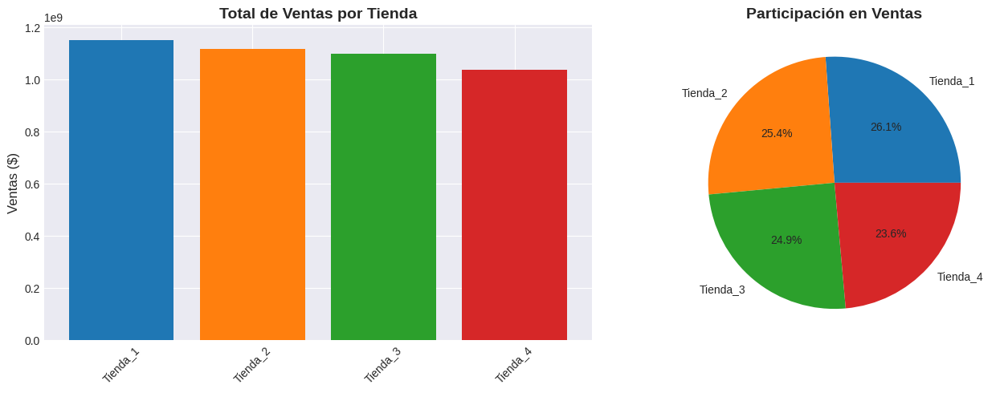

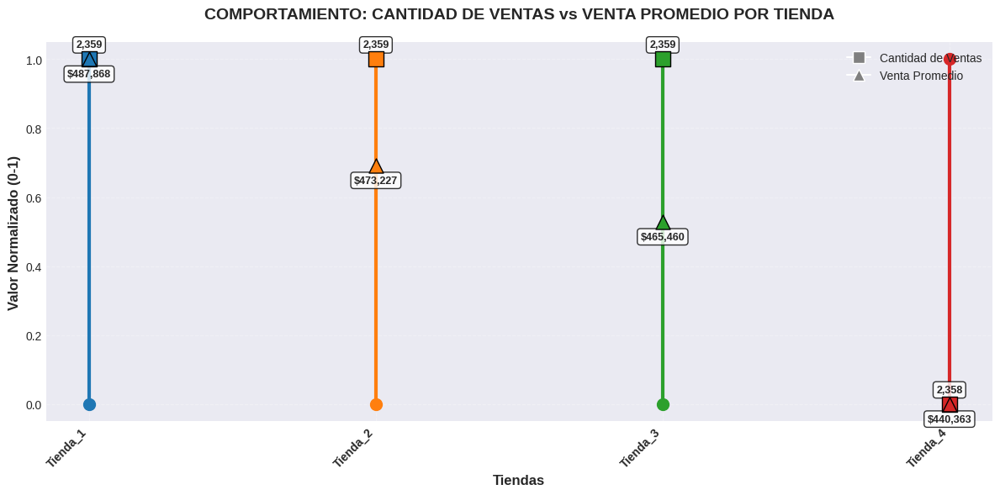


TABLA COMPARATIVA: CANTIDAD vs PROMEDIO

  Tienda  Cantidad_Ventas  Venta_Promedio  Total_Ventas  Diferencia_Promedio  Diferencia_Cantidad
Tienda_1             2359       487867.91  1150880400.0             21138.41                 0.25
Tienda_2             2359       473227.43  1116343500.0              6497.93                 0.25
Tienda_3             2359       465459.77  1098019600.0             -1269.73                 0.25
Tienda_4             2358       440362.89  1038375700.0            -26366.61                -0.75

----------------------------------------------------------------------

 RESUMEN ESTADÍSTICO:
• Cantidad promedio de ventas: 2359
• Venta promedio global: $466,729.50
• Rango cantidad: 2358 - 2359
• Rango valor promedio: $440,362.89 - $487,867.91

 ANÁLISIS DE COMPORTAMIENTO:
• Tienda_1: ALTO volumen, ALTO valor promedio
• Tienda_2: ALTO volumen, ALTO valor promedio
• Tienda_3: ALTO volumen, BAJO valor promedio
• Tienda_4: BAJO volumen, BAJO valor promedio


In [ ]:
#Importaciones para el analisis de graficos por medio las bibliotecas
import matplotlib.pyplot as plt
import numpy as np

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Gráfico 1: Total de ventas por tienda
axes[0].bar(metricas_tienda.index, metricas_tienda['Total_Ventas'], color=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728'])
axes[0].set_title('Total de Ventas por Tienda', fontsize=14, fontweight='bold')
axes[0].set_ylabel('Ventas ($)', fontsize=12)
axes[0].tick_params(axis='x', rotation=45)

# Gráfico 2: Participación porcentual
wedges, texts, autotexts = axes[1].pie(metricas_tienda['Participacion'],
                                       labels=metricas_tienda.index,
                                       autopct='%1.1f%%',
                                       colors=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728'])
axes[1].set_title('Participación en Ventas', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()

# Para crear la figura para el gráfico lineal aplico este código
fig, ax = plt.subplots(figsize=(12, 6))

# Vamos a Preparar los datos para una mejor visualizacion
tiendas = ventas_por_tienda.index
cantidad = ventas_por_tienda['Cantidad_Transacciones']
promedio = ventas_por_tienda['Promedio_Venta']

# Normalizar datos para comparación en misma escala escala por tienda.
cantidad_norm = (cantidad - cantidad.min()) / (cantidad.max() - cantidad.min())
promedio_norm = (promedio - promedio.min()) / (promedio.max() - promedio.min())

# Crear la línea para c/d tienda para una mejor visualización
x = np.arange(len(tiendas))
colors = plt.cm.tab10(np.arange(len(tiendas)))

#  líneas para cada una de las 4 tiendas
for i, tienda in enumerate(tiendas):
    ax.plot([i, i], [0, 1], color=colors[i], linewidth=3, label=tienda, marker='o', markersize=10)
    # Añadir los puntos de cantidad normalizada y organizados.
    ax.scatter(i, cantidad_norm.iloc[i], color=colors[i], s=150, edgecolor='black', zorder=5,
               marker='s', label=f'{tienda} - Cantidad' if i == 0 else "")
    # Añadir puntos de promedio normalizado y organizados.
    ax.scatter(i, promedio_norm.iloc[i], color=colors[i], s=150, edgecolor='black', zorder=5,
               marker='^', label=f'{tienda} - Promedio' if i == 0 else "")

# Personalizar c/da uno de los gráficos
ax.set_xlabel('Tiendas', fontsize=12, fontweight='bold')
ax.set_ylabel('Valor Normalizado (0-1)', fontsize=12, fontweight='bold')
ax.set_title('COMPORTAMIENTO: CANTIDAD DE VENTAS vs VENTA PROMEDIO POR TIENDA',
             fontsize=14, fontweight='bold', pad=20)
ax.set_xticks(x)
ax.set_xticklabels(tiendas, rotation=45, ha='right', fontweight='bold')

# Añadir leyenda personalizada para una mejor visualizacion.
from matplotlib.lines import Line2D
legend_elements = [
    Line2D([0], [0], marker='s', color='w', markerfacecolor='gray', markersize=10, label='Cantidad de Ventas'),
    Line2D([0], [0], marker='^', color='w', markerfacecolor='gray', markersize=10, label='Venta Promedio')
]
ax.legend(handles=legend_elements, loc='upper right')

# Añadir grid "ojo"
ax.grid(True, alpha=0.3, linestyle='--')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Agregamos los c/da uno de los valores reales como anotaciones
for i, tienda in enumerate(tiendas):
    # Anotación uno para cantidad
    ax.annotate(f'{cantidad.iloc[i]:,}',
                xy=(i, cantidad_norm.iloc[i]),
                xytext=(0, 10),
                textcoords='offset points',
                ha='center', fontsize=9, fontweight='bold',
                bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8))

    # Anotación dos para promedio
    ax.annotate(f'${promedio.iloc[i]:,.0f}',
                xy=(i, promedio_norm.iloc[i]),
                xytext=(0, -15),
                textcoords='offset points',
                ha='center', fontsize=9, fontweight='bold',
                bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8))

plt.tight_layout()
plt.show()


# VAMOS A CREAR LA TABLA COMPARATIVA, CONSIDERO QUE ES UNA BUENA ESTRATEGIA

print("\n" + "="*70)
print("TABLA COMPARATIVA: CANTIDAD vs PROMEDIO")
print("="*70)

tabla_comparativa = pd.DataFrame({
    'Tienda': tiendas,
    'Cantidad_Ventas': cantidad.values,
    'Venta_Promedio': promedio.values,
    'Total_Ventas': ventas_por_tienda['Total_Ventas'].values,
    'Diferencia_Promedio': (promedio.values - promedio.mean()).round(2),
    'Diferencia_Cantidad': (cantidad.values - cantidad.mean()).round(2)
})

# Ordenar por diferencia de promedio (mayor a menor) "OJO"
tabla_comparativa = tabla_comparativa.sort_values('Venta_Promedio', ascending=False)

print("\n" + tabla_comparativa.to_string(index=False))
print("\n" + "-"*70)

# Resumen estadístico para las tiendas para un mejor analisis.
print("\n RESUMEN ESTADÍSTICO:")
print(f"• Cantidad promedio de ventas: {cantidad.mean():.0f}")
print(f"• Venta promedio global: ${promedio.mean():,.2f}")
print(f"• Rango cantidad: {cantidad.min():.0f} - {cantidad.max():.0f}")
print(f"• Rango valor promedio: ${promedio.min():,.2f} - ${promedio.max():,.2f}")

# Análisis de comportamiento para las tiendas segun los datos del arcchivo.
print("\n ANÁLISIS DE COMPORTAMIENTO:")
for idx, row in tabla_comparativa.iterrows():
    comportamiento = []
    if row['Cantidad_Ventas'] > cantidad.mean():
        comportamiento.append("ALTO volumen")
    else:
        comportamiento.append("BAJO volumen")

    if row['Venta_Promedio'] > promedio.mean():
        comportamiento.append("ALTO valor promedio")
    else:
        comportamiento.append("BAJO valor promedio")

    print(f"• {row['Tienda']}: {', '.join(comportamiento)}")

# 2. Ventas por categoría


ANÁLISIS DETALLADO: Tienda_1

 1. ANÁLISIS POR PRODUCTO - Tienda_1
--------------------------------------------------
TOP 5 PRODUCTOS MÁS VENDIDOS (UNIDADES):
  1. Armario: 60.0 unidades ($29,462,300.00)
  2. TV LED UHD 4K: 60.0 unidades ($142,150,200.00)
  3. Microondas: 60.0 unidades ($34,761,500.00)
  4. Secadora de ropa: 58.0 unidades ($59,062,400.00)
  5. Mesa de noche: 56.0 unidades ($15,679,600.00)

2. ANÁLISIS POR CATEGORÍA - Tienda_1
--------------------------------------------------
TOP 5 CATEGORÍAS MÁS VENDIDAS:
  1. Muebles: 465.0 unidades ($187,633,700.00)
  2. Electrónicos: 448.0 unidades ($429,493,500.00)
  3. Juguetes: 324.0 unidades ($17,995,700.00)
  4. Electrodomésticos: 312.0 unidades ($363,685,200.00)
  5. Deportes y diversión: 284.0 unidades ($39,290,000.00)

3. ANÁLISIS POR LUGAR DE COMPRA - Tienda_1
--------------------------------------------------
LUGAR MÁS FRECUENTE POR CATEGORÍA:
  • Muebles: Bogotá (195 transacciones)
  • Electrónicos: Bogotá (162 transacc

/tmp/ipython-input-3939039851.py:201: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


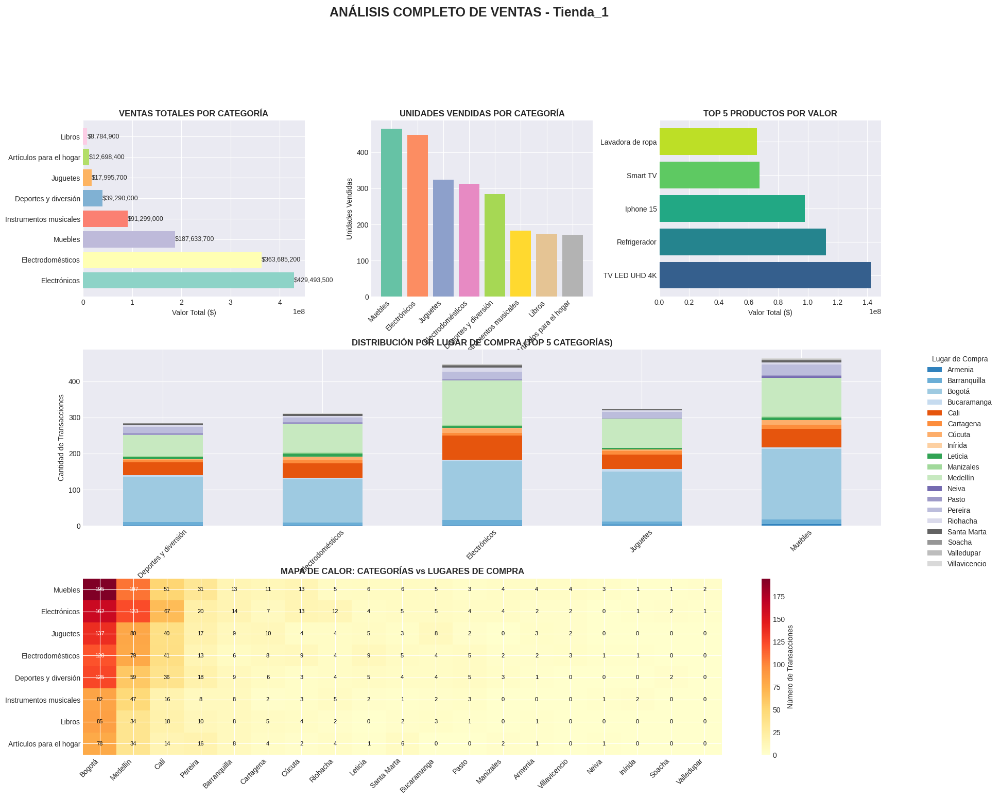


TABLAS DETALLADAS - Tienda_1
--------------------------------------------------

RESUMEN POR CATEGORÍA (ordenado por unidades):
                         Unidades_Vendidas  Valor_Total  Productos_Unicos
Categoría del Producto                                                   
Muebles                                465  187633700.0                10
Electrónicos                           448  429493500.0                10
Juguetes                               324   17995700.0                 7
Electrodomésticos                      312  363685200.0                 6
Deportes y diversión                   284   39290000.0                 6
Instrumentos musicales                 182   91299000.0                 4
Libros                                 173    8784900.0                 4
Artículos para el hogar                171   12698400.0                 4

TOP 10 PRODUCTOS (unidades):
                         Unidades_Vendidas  Valor_Total
Producto                                     

/tmp/ipython-input-3939039851.py:201: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


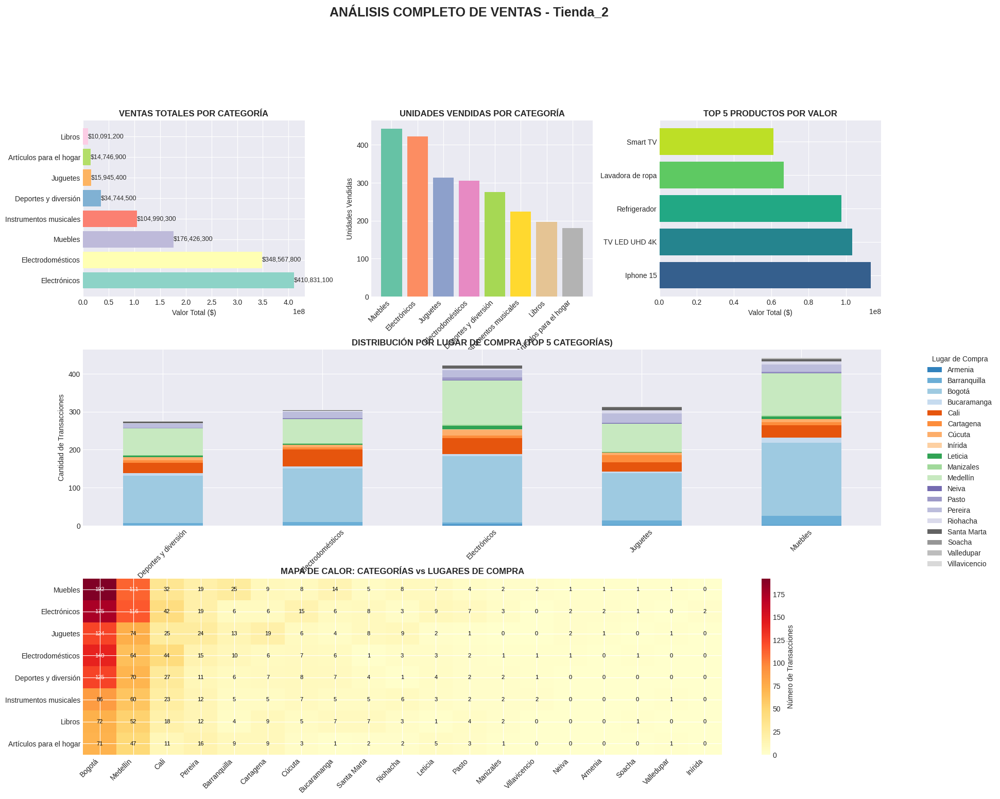


TABLAS DETALLADAS - Tienda_2
--------------------------------------------------

RESUMEN POR CATEGORÍA (ordenado por unidades):
                         Unidades_Vendidas  Valor_Total  Productos_Unicos
Categoría del Producto                                                   
Muebles                                442  176426300.0                10
Electrónicos                           422  410831100.0                10
Juguetes                               313   15945400.0                 7
Electrodomésticos                      305  348567800.0                 6
Deportes y diversión                   275   34744500.0                 6
Instrumentos musicales                 224  104990300.0                 4
Libros                                 197   10091200.0                 4
Artículos para el hogar                181   14746900.0                 4

TOP 10 PRODUCTOS (unidades):
                           Unidades_Vendidas  Valor_Total
Producto                                   

/tmp/ipython-input-3939039851.py:201: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


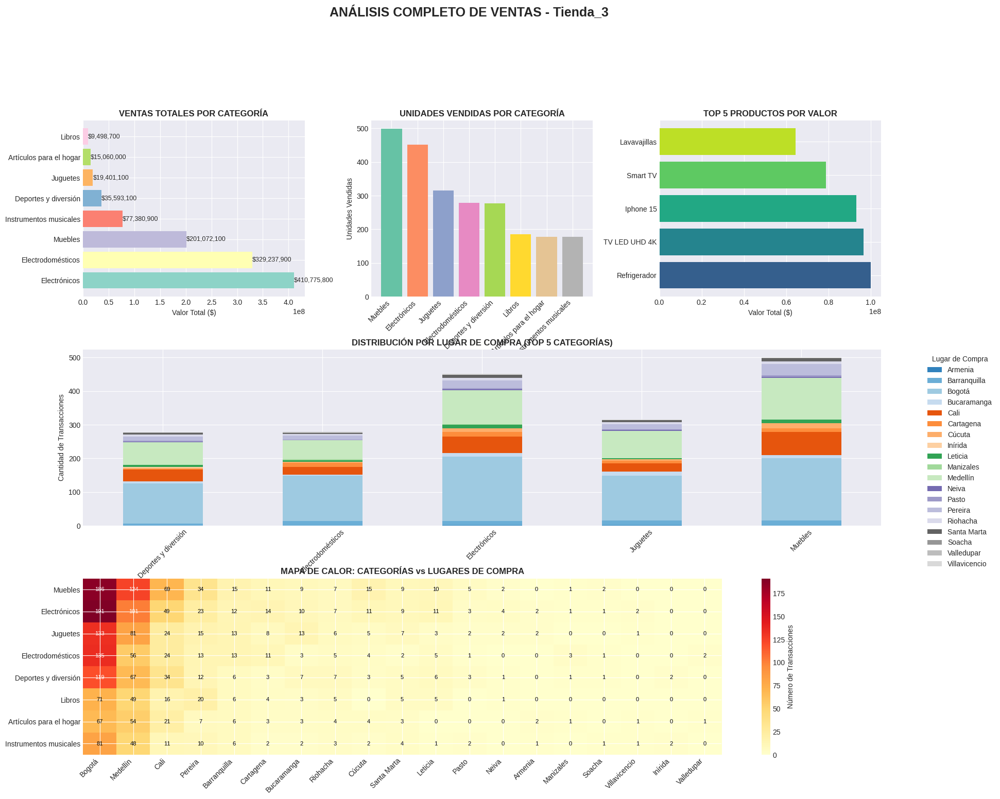


TABLAS DETALLADAS - Tienda_3
--------------------------------------------------

RESUMEN POR CATEGORÍA (ordenado por unidades):
                         Unidades_Vendidas  Valor_Total  Productos_Unicos
Categoría del Producto                                                   
Muebles                                499  201072100.0                10
Electrónicos                           451  410775800.0                10
Juguetes                               315   19401100.0                 7
Electrodomésticos                      278  329237900.0                 6
Deportes y diversión                   277   35593100.0                 6
Libros                                 185    9498700.0                 4
Artículos para el hogar                177   15060000.0                 4
Instrumentos musicales                 177   77380900.0                 4

TOP 10 PRODUCTOS (unidades):
                           Unidades_Vendidas  Valor_Total
Producto                                   

/tmp/ipython-input-3939039851.py:201: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


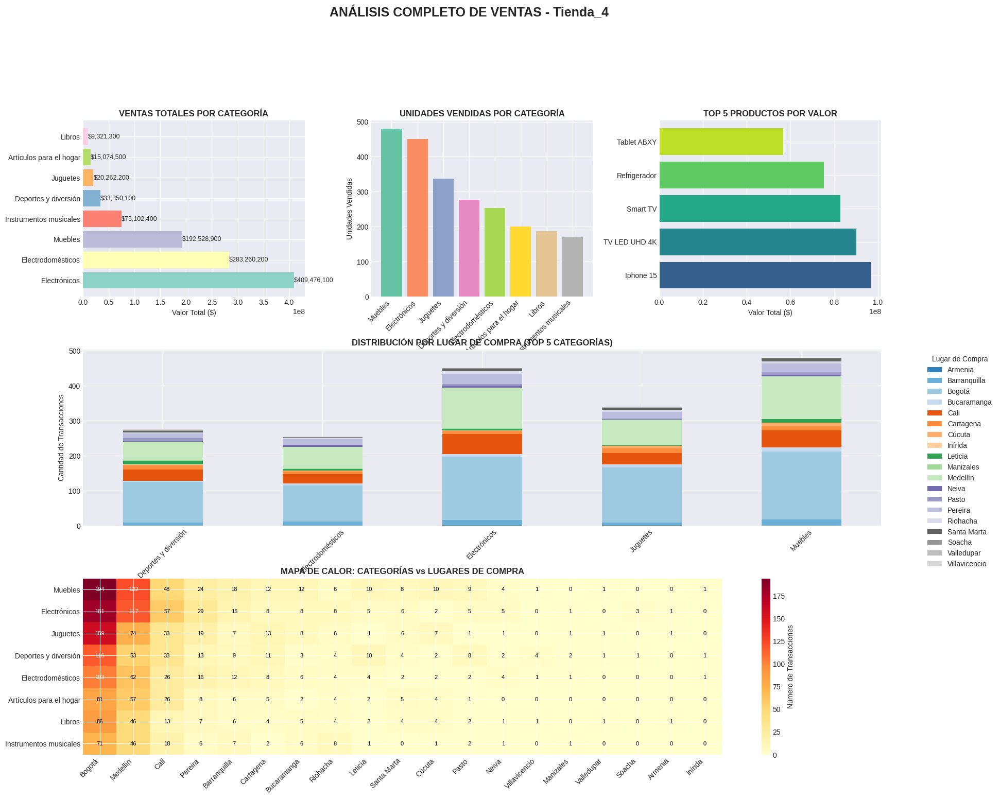


TABLAS DETALLADAS - Tienda_4
--------------------------------------------------

RESUMEN POR CATEGORÍA (ordenado por unidades):
                         Unidades_Vendidas  Valor_Total  Productos_Unicos
Categoría del Producto                                                   
Muebles                                480  192528900.0                10
Electrónicos                           451  409476100.0                10
Juguetes                               338   20262200.0                 7
Deportes y diversión                   277   33350100.0                 6
Electrodomésticos                      254  283260200.0                 6
Artículos para el hogar                201   15074500.0                 4
Libros                                 187    9321300.0                 4
Instrumentos musicales                 170   75102400.0                 4

TOP 10 PRODUCTOS (unidades):
                           Unidades_Vendidas  Valor_Total
Producto                                   

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib.gridspec import GridSpec

# Con esto vamos a importante la configuración inicial del proyecto.
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

# 1. CONSOLIDAR DATOS DE TODAS LAS TIENDAS..... ok
todas_tiendas = pd.concat([
    tienda.assign(Tienda='Tienda_1'),
    tienda2.assign(Tienda='Tienda_2'),
    tienda3.assign(Tienda='Tienda_3'),
    tienda4.assign(Tienda='Tienda_4')
], ignore_index=True)

# Convertir fecha a datetime..................ok
todas_tiendas['Fecha de Compra'] = pd.to_datetime(todas_tiendas['Fecha de Compra'], format='%d/%m/%Y')

# ANÁLISIS POR C/D TIENDA............OK
for tienda_nombre in ['Tienda_1', 'Tienda_2', 'Tienda_3', 'Tienda_4']:
    print(f"\n{'='*80}")
    print(f"ANÁLISIS DETALLADO: {tienda_nombre}")
    print(f"{'='*80}")

    # Filtrar datos de la tienda (YA ESTA)
    datos_tienda = todas_tiendas[todas_tiendas['Tienda'] == tienda_nombre].copy()


    # 1. ANÁLISIS POR PRODUCTO SEGUN LA PREGUNTA, mmmmmmmmmmmm

    print(f"\n 1. ANÁLISIS POR PRODUCTO - {tienda_nombre}")
    print("-" * 50)

    # Ventas por producto por c/da tienda (valor total y unidades)
    ventas_producto = datos_tienda.groupby('Producto').agg(
        Unidades_Vendidas=('Producto', 'count'),
        Valor_Total=('Precio', 'sum'),
        Precio_Promedio=('Precio', 'mean')
    ).round(2).sort_values('Unidades_Vendidas', ascending=False)

    # TOP 5 de Productos más vendidos solo por unidades
    top5_productos = ventas_producto.head(5)
    print("TOP 5 PRODUCTOS MÁS VENDIDOS (UNIDADES):")
    for i, (producto, datos) in enumerate(top5_productos.iterrows(), 1):
        print(f"  {i}. {producto}: {datos['Unidades_Vendidas']} unidades (${datos['Valor_Total']:,.2f})")


    # 2. ANÁLISIS POR CATEGORÍA SUPER IMPORTANTE

    print(f"\n2. ANÁLISIS POR CATEGORÍA - {tienda_nombre}")
    print("-" * 50)

    # Ventas por categoría
    ventas_categoria = datos_tienda.groupby('Categoría del Producto').agg(
        Unidades_Vendidas=('Categoría del Producto', 'count'),
        Valor_Total=('Precio', 'sum'),
        Precio_Promedio=('Precio', 'mean'),
        Productos_Unicos=('Producto', 'nunique')
    ).round(2).sort_values('Unidades_Vendidas', ascending=False)

    # TOP 5 Categorías más vendidas
    top5_categorias = ventas_categoria.head(5)
    print("TOP 5 CATEGORÍAS MÁS VENDIDAS:")
    for i, (categoria, datos) in enumerate(top5_categorias.iterrows(), 1):
        print(f"  {i}. {categoria}: {datos['Unidades_Vendidas']} unidades (${datos['Valor_Total']:,.2f})")


    # 3. ANÁLISIS POR LUGAR DE COMPRA............OK

    print(f"\n3. ANÁLISIS POR LUGAR DE COMPRA - {tienda_nombre}")
    print("-" * 50)

    # Lugar de compra más frecuente por cada una de las categorias.......
    lugar_categoria = datos_tienda.groupby(['Categoría del Producto', 'Lugar de Compra']).agg(
        Transacciones=('Lugar de Compra', 'count'),
        Valor_Total=('Precio', 'sum')
    ).reset_index()

    # Encontrar el lugar más frecuente para cada categoría, es incluir las ciudades ojo.....
    idx_max = lugar_categoria.groupby('Categoría del Producto')['Transacciones'].idxmax()
    lugar_mas_frecuente = lugar_categoria.loc[idx_max].sort_values('Transacciones', ascending=False)

    print("LUGAR MÁS FRECUENTE POR CATEGORÍA:")
    for i, row in lugar_mas_frecuente.head(5).iterrows():
        print(f"  • {row['Categoría del Producto']}: {row['Lugar de Compra']} ({row['Transacciones']} transacciones)")


    # 4. CODIGO PARA EL RESUMEN ESTADÍSTICO

    print(f"\n4. RESUMEN ESTADÍSTICO - {tienda_nombre}")
    print("-" * 50)

    resumen_stats = {
        'Total_Transacciones': len(datos_tienda),
        'Total_Ventas': datos_tienda['Precio'].sum(),
        'Promedio_Venta': datos_tienda['Precio'].mean(),
        'Mediana_Venta': datos_tienda['Precio'].median(),
        'Venta_Max': datos_tienda['Precio'].max(),
        'Venta_Min': datos_tienda['Precio'].min(),
        'Categorias_Unicas': datos_tienda['Categoría del Producto'].nunique(),
        'Productos_Unicos': datos_tienda['Producto'].nunique(),
        'Lugares_Unicos': datos_tienda['Lugar de Compra'].nunique(),
        'Vendedores_Unicos': datos_tienda['Vendedor'].nunique()
    }

    for k, v in resumen_stats.items():
        if 'Venta' in k or 'Ventas' == k:
            print(f"  {k.replace('_', ' ')}: ${v:,.2f}")
        else:
            print(f"  {k.replace('_', ' ')}: {v}")


    # 5. VISUALIZACIONES

    print(f"\n5. GENERANDO VISUALIZACIONES PARA {tienda_nombre}...")

    fig = plt.figure(figsize=(20, 16))
    fig.suptitle(f'ANÁLISIS COMPLETO DE VENTAS - {tienda_nombre}', fontsize=18, fontweight='bold', y=1.02)
    gs = GridSpec(3, 3, figure=fig, hspace=0.3, wspace=0.3)

    # Gráfico 1: Ventas totales por categoría (Barras)
    ax1 = fig.add_subplot(gs[0, 0])
    categorias_ordenadas = ventas_categoria.sort_values('Valor_Total', ascending=False)
    bars1 = ax1.barh(range(len(categorias_ordenadas)), categorias_ordenadas['Valor_Total'],
                    color=plt.cm.Set3(np.arange(len(categorias_ordenadas))))
    ax1.set_yticks(range(len(categorias_ordenadas)))
    ax1.set_yticklabels(categorias_ordenadas.index)
    ax1.set_xlabel('Valor Total ($)')
    ax1.set_title('VENTAS TOTALES POR CATEGORÍA', fontsize=12, fontweight='bold')

    # Añadir valores en barras...........ok
    for i, v in enumerate(categorias_ordenadas['Valor_Total']):
        ax1.text(v, i, f'${v:,.0f}', va='center', fontsize=9)

    # Gráfico 2: Unidades vendidas por C/D categoría
    ax2 = fig.add_subplot(gs[0, 1])
    bars2 = ax2.bar(range(len(ventas_categoria)), ventas_categoria['Unidades_Vendidas'],
                    color=plt.cm.Set2(np.arange(len(ventas_categoria))))
    ax2.set_xticks(range(len(ventas_categoria)))
    ax2.set_xticklabels(ventas_categoria.index, rotation=45, ha='right')
    ax2.set_ylabel('Unidades Vendidas')
    ax2.set_title('UNIDADES VENDIDAS POR CATEGORÍA', fontsize=12, fontweight='bold')

    # Gráfico 3: TOP 5 Productos por valor.............========================
    ax3 = fig.add_subplot(gs[0, 2])
    top5_valor = ventas_producto.sort_values('Valor_Total', ascending=False).head(5)
    colors3 = plt.cm.viridis(np.linspace(0.3, 0.9, 5))
    bars3 = ax3.barh(range(len(top5_valor)), top5_valor['Valor_Total'], color=colors3)
    ax3.set_yticks(range(len(top5_valor)))
    ax3.set_yticklabels([p[:20] + '...' if len(p) > 20 else p for p in top5_valor.index])
    ax3.set_xlabel('Valor Total ($)')
    ax3.set_title('TOP 5 PRODUCTOS POR VALOR', fontsize=12, fontweight='bold')

    # Gráfico 4: Distribución de las 5 primeras categorías por lugar de compra =====================
    ax4 = fig.add_subplot(gs[1, :])
    top_cats = ventas_categoria.head(5).index
    datos_top_cats = datos_tienda[datos_tienda['Categoría del Producto'].isin(top_cats)]

    lugar_dist = datos_top_cats.groupby(['Categoría del Producto', 'Lugar de Compra']).size().unstack(fill_value=0)
    lugar_dist.plot(kind='bar', stacked=True, ax=ax4, colormap='tab20c')
    ax4.set_ylabel('Cantidad de Transacciones')
    ax4.set_xlabel('Categoría del Producto')
    ax4.set_title('DISTRIBUCIÓN POR LUGAR DE COMPRA (TOP 5 CATEGORÍAS)', fontsize=12, fontweight='bold')
    ax4.legend(title='Lugar de Compra', bbox_to_anchor=(1.05, 1), loc='upper left')
    ax4.tick_params(axis='x', rotation=45)

    # Gráfico 5: Creamos un mapa de calor Categorías vs Lugares de Compra ==============
    ax5 = fig.add_subplot(gs[2, :])
    heatmap_data = datos_tienda.pivot_table(
        index='Categoría del Producto',
        columns='Lugar de Compra',
        values='Precio',
        aggfunc='count',
        fill_value=0
    )

    # Ordenar por frecuencia total..............ya creada =============================

    heatmap_data = heatmap_data.loc[heatmap_data.sum(axis=1).sort_values(ascending=False).index]
    heatmap_data = heatmap_data[heatmap_data.sum(axis=0).sort_values(ascending=False).index]

    im = ax5.imshow(heatmap_data, cmap='YlOrRd', aspect='auto')
    ax5.set_xticks(range(len(heatmap_data.columns)))
    ax5.set_xticklabels(heatmap_data.columns, rotation=45, ha='right')
    ax5.set_yticks(range(len(heatmap_data.index)))
    ax5.set_yticklabels(heatmap_data.index)
    ax5.set_title('MAPA DE CALOR: CATEGORÍAS vs LUGARES DE COMPRA', fontsize=12, fontweight='bold')

    # Añadir barra de color
    plt.colorbar(im, ax=ax5, label='Número de Transacciones')

    # Añadir valores en las celdas
    for i in range(len(heatmap_data.index)):
        for j in range(len(heatmap_data.columns)):
            ax5.text(j, i, heatmap_data.iloc[i, j], ha='center', va='center',
                    color='black' if heatmap_data.iloc[i, j] < heatmap_data.values.max()/2 else 'white',
                    fontsize=8)

    plt.tight_layout()
    plt.show()


    # VAMOS A CREAR LAS TABLAS DETALLADAS =========================

    print(f"\nTABLAS DETALLADAS - {tienda_nombre}")
    print("-" * 50)

    # Tabla 1 resumen categorías
    print("\nRESUMEN POR CATEGORÍA (ordenado por unidades):")
    print(ventas_categoria[['Unidades_Vendidas', 'Valor_Total', 'Productos_Unicos']].to_string())

    # Tabla 2 resumen productos top 10
    print(f"\nTOP 10 PRODUCTOS (unidades):")
    print(ventas_producto.head(10)[['Unidades_Vendidas', 'Valor_Total']].to_string())

    print(f"\n{'='*80}")
    print(f"ANÁLISIS COMPLETADO PARA {tienda_nombre}")
    print(f"{'='*80}\n")

# ANÁLISIS COMPARATIVO ENTRE TIENDAS ========================================

print("\n" + "="*80)
print("ANÁLISIS COMPARATIVO ENTRE TIENDAS")
print("="*80)

# Comparativa de métricas clave entre tiendas
comparativa_tiendas = todas_tiendas.groupby('Tienda').agg({
    'Precio': ['sum', 'mean', 'count'],
    'Producto': 'nunique',
    'Categoría del Producto': 'nunique',
    'Lugar de Compra': 'nunique'
}).round(2)

comparativa_tiendas.columns = ['_'.join(col).strip() for col in comparativa_tiendas.columns.values]
comparativa_tiendas = comparativa_tiendas.rename(columns={
    'Precio_sum': 'Total_Ventas',
    'Precio_mean': 'Ticket_Promedio',
    'Precio_count': 'Transacciones',
    'Producto_nunique': 'Productos_Unicos',
    'Categoría del Producto_nunique': 'Categorias_Unicas',
    'Lugar de Compra_nunique': 'Lugares_Unicos'
})

print("\nCOMPARATIVA DE MÉTRICAS CLAVE:")
print("-" * 50)
print(comparativa_tiendas.to_string())

# Encontrar mejores y peores datos ======================================================
print(f"\nMEJORES PERFORMERS:")
print("-" * 30)
print(f"Mayor venta total: {comparativa_tiendas['Total_Ventas'].idxmax()} (${comparativa_tiendas['Total_Ventas'].max():,.2f})")
print(f"Mayor transacciones: {comparativa_tiendas['Transacciones'].idxmax()} ({comparativa_tiendas['Transacciones'].max()})")
print(f"Mayor ticket promedio: {comparativa_tiendas['Ticket_Promedio'].idxmax()} (${comparativa_tiendas['Ticket_Promedio'].max():,.2f})")

print(f"\nOPORTUNIDADES DE MEJORA:")
print("-" * 30)
print(f"Menor venta total: {comparativa_tiendas['Total_Ventas'].idxmin()} (${comparativa_tiendas['Total_Ventas'].min():,.2f})")
print(f"Menor transacciones: {comparativa_tiendas['Transacciones'].idxmin()} ({comparativa_tiendas['Transacciones'].min()})")
print(f"Menor variedad productos: {comparativa_tiendas['Productos_Unicos'].idxmin()} ({comparativa_tiendas['Productos_Unicos'].min()} productos)")

print(f"\n{'='*80}")
print("RECOMENDACIONES ESTRATÉGICAS:")
print("="*80)
print("""
1. ENFOQUE EN PRODUCTOS TOP: Replicar estrategias de venta de productos líderes en todas las tiendas
2. OPTIMIZACIÓN DE INVENTARIO: Ajustar stock según categorías más vendidas por tienda
3. EXPANSIÓN GEOGRÁFICA: Identificar lugares de compra con menor penetración para campañas específicas
4. PERSONALIZACIÓN POR TIENDA: Adaptar mix de productos según preferencias locales
5. SEGMENTACIÓN DE CLIENTES: Desarrollar estrategias basadas en lugares de compra más frecuentes
""")

print(f"\n ANÁLISIS COMPLETADO - {len(todas_tiendas):,} transacciones procesadas")


ANÁLISIS DE ENVÍOS: Tienda_1

 ENVÍO PROMEDIO POR TIENDA - Tienda_1
--------------------------------------------------
 ESTADÍSTICAS DE ENVÍO:
  • Envío promedio: $26,018.61
  • Envío mediano: $12,400.00
  • Envío máximo: $160,800.00
  • Envío mínimo: $0.00
  • Total en envíos: $61,377,900.00
  • Porcentaje promedio vs precio: 5.5%

 ENVÍO POR LUGAR DE COMPRA - Tienda_1
--------------------------------------------------

 TOP 5 LUGARES CON MAYOR ENVÍO PROMEDIO:
  1. Soacha: $43,420.00 (5.0 envíos)
  2. Cúcuta: $40,129.41 (51.0 envíos)
  3. Pasto: $35,078.26 (23.0 envíos)
  4. Villavicencio: $34,709.09 (11.0 envíos)
  5. Neiva: $31,516.67 (6.0 envíos)

 TOP 5 LUGARES CON MENOR ENVÍO PROMEDIO:
  1. Cartagena: $22,624.53 (53.0 envíos)
  2. Santa Marta: $22,593.75 (32.0 envíos)
  3. Pereira: $22,403.76 (133.0 envíos)
  4. Valledupar: $18,766.67 (3.0 envíos)
  5. Armenia: $17,314.29 (14.0 envíos)

 RELACIÓN ENVÍO-PRECIO - Tienda_1
--------------------------------------------------
  • Corr

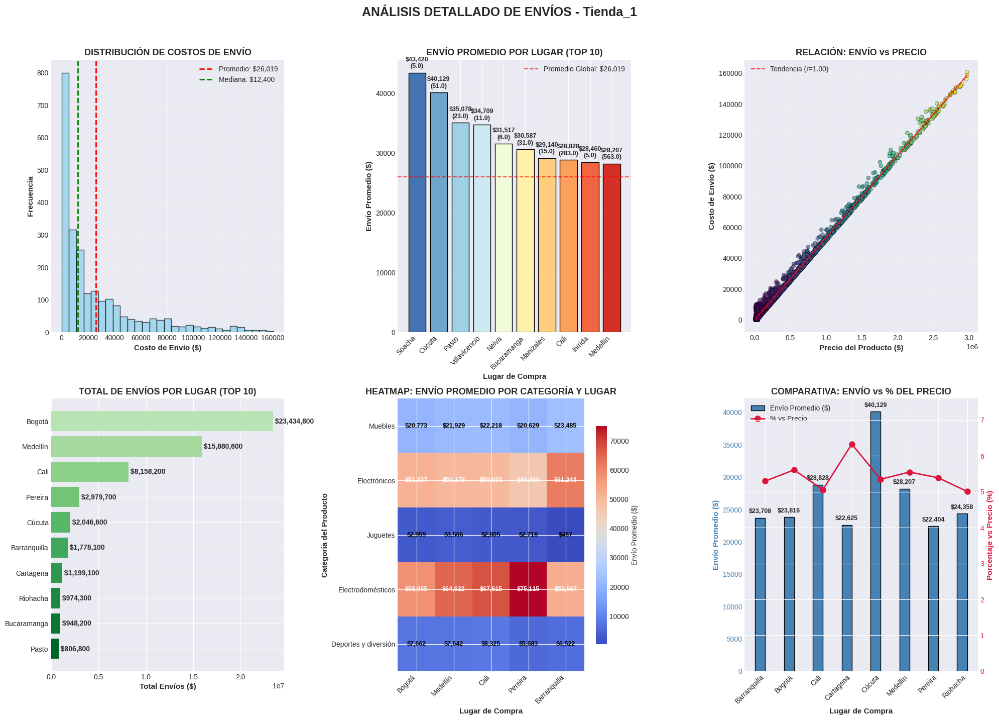


 RESUMEN Y RECOMENDACIONES - Tienda_1:
--------------------------------------------------
1. LUGAR CON MAYOR ENVÍO PROMEDIO:
   • Soacha: $43,420.00
   • Recomendación: Revisar logística o negociar mejores tarifas

2. LUGAR CON MENOR ENVÍO PROMEDIO:
   • Armenia: $17,314.29
   • Recomendación: Replicar estrategia logística exitosa

3. EFICIENCIA LOGÍSTICA:
   • Costo promedio por envío: $26,018.61
   • Porcentaje vs precio: 5.5%

4. OPTIMIZACIÓN DE COSTOS:
   • Desviación estándar: $32,860.00
   • Rango: $0.00 - $160,800.00


ANÁLISIS DE ENVÍOS: Tienda_2

 ENVÍO PROMEDIO POR TIENDA - Tienda_2
--------------------------------------------------
 ESTADÍSTICAS DE ENVÍO:
  • Envío promedio: $25,216.24
  • Envío mediano: $11,600.00
  • Envío máximo: $162,500.00
  • Envío mínimo: $0.00
  • Total en envíos: $59,485,100.00
  • Porcentaje promedio vs precio: 5.6%

 ENVÍO POR LUGAR DE COMPRA - Tienda_2
--------------------------------------------------

 TOP 5 LUGARES CON MAYOR ENVÍO PROMEDIO:
 

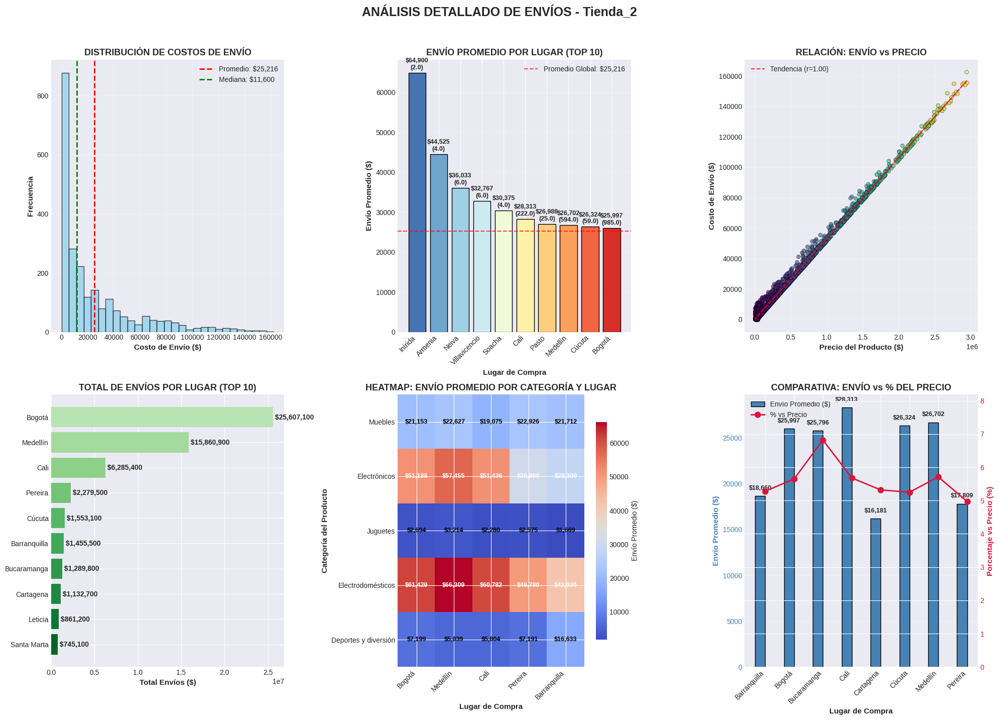


 RESUMEN Y RECOMENDACIONES - Tienda_2:
--------------------------------------------------
1. LUGAR CON MAYOR ENVÍO PROMEDIO:
   • Inírida: $64,900.00
   • Recomendación: Revisar logística o negociar mejores tarifas

2. LUGAR CON MENOR ENVÍO PROMEDIO:
   • Manizales: $13,476.92
   • Recomendación: Replicar estrategia logística exitosa

3. EFICIENCIA LOGÍSTICA:
   • Costo promedio por envío: $25,216.24
   • Porcentaje vs precio: 5.6%

4. OPTIMIZACIÓN DE COSTOS:
   • Desviación estándar: $31,741.38
   • Rango: $0.00 - $162,500.00


ANÁLISIS DE ENVÍOS: Tienda_3

 ENVÍO PROMEDIO POR TIENDA - Tienda_3
--------------------------------------------------
 ESTADÍSTICAS DE ENVÍO:
  • Envío promedio: $24,805.68
  • Envío mediano: $11,900.00
  • Envío máximo: $158,400.00
  • Envío mínimo: $0.00
  • Total en envíos: $58,516,600.00
  • Porcentaje promedio vs precio: 5.4%

 ENVÍO POR LUGAR DE COMPRA - Tienda_3
--------------------------------------------------

 TOP 5 LUGARES CON MAYOR ENVÍO PROMEDIO

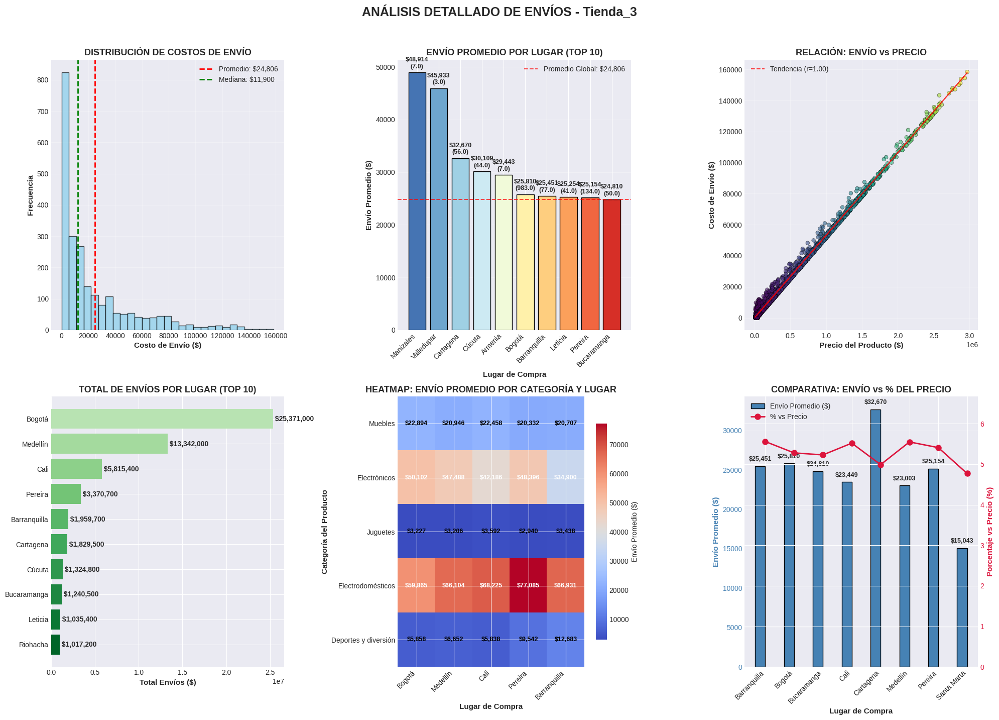


 RESUMEN Y RECOMENDACIONES - Tienda_3:
--------------------------------------------------
1. LUGAR CON MAYOR ENVÍO PROMEDIO:
   • Manizales: $48,914.29
   • Recomendación: Revisar logística o negociar mejores tarifas

2. LUGAR CON MENOR ENVÍO PROMEDIO:
   • Villavicencio: $11,820.00
   • Recomendación: Replicar estrategia logística exitosa

3. EFICIENCIA LOGÍSTICA:
   • Costo promedio por envío: $24,805.68
   • Porcentaje vs precio: 5.4%

4. OPTIMIZACIÓN DE COSTOS:
   • Desviación estándar: $30,945.89
   • Rango: $0.00 - $158,400.00


ANÁLISIS DE ENVÍOS: Tienda_4

 ENVÍO PROMEDIO POR TIENDA - Tienda_4
--------------------------------------------------
 ESTADÍSTICAS DE ENVÍO:
  • Envío promedio: $23,459.46
  • Envío mediano: $10,950.00
  • Envío máximo: $154,700.00
  • Envío mínimo: $0.00
  • Total en envíos: $55,317,400.00
  • Porcentaje promedio vs precio: 5.5%

 ENVÍO POR LUGAR DE COMPRA - Tienda_4
--------------------------------------------------

 TOP 5 LUGARES CON MAYOR ENVÍO PR

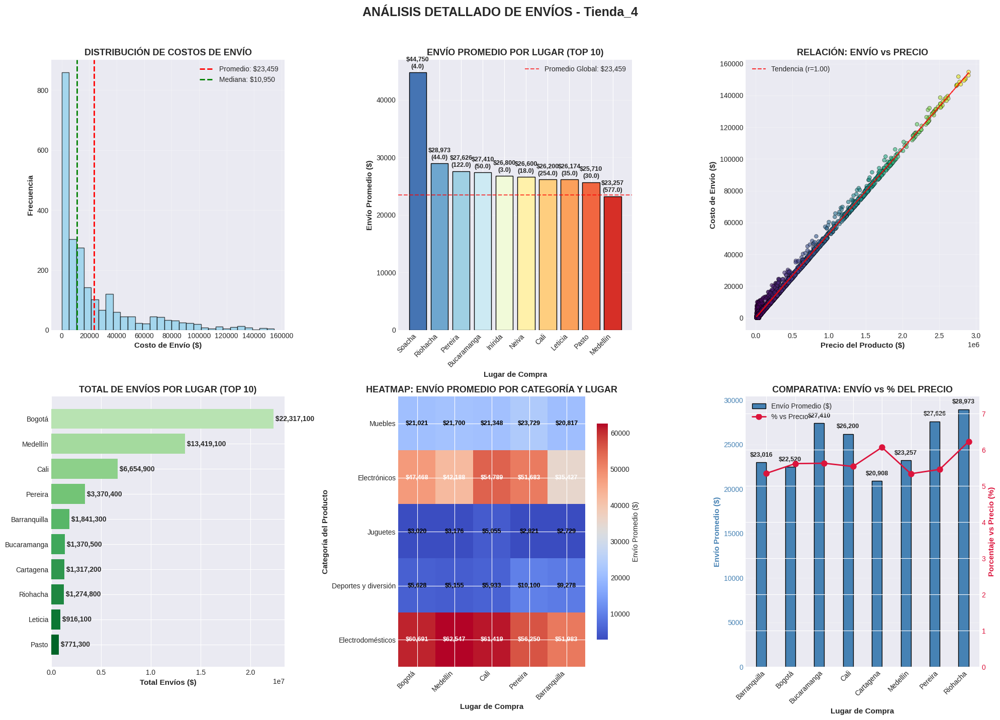


 RESUMEN Y RECOMENDACIONES - Tienda_4:
--------------------------------------------------
1. LUGAR CON MAYOR ENVÍO PROMEDIO:
   • Soacha: $44,750.00
   • Recomendación: Revisar logística o negociar mejores tarifas

2. LUGAR CON MENOR ENVÍO PROMEDIO:
   • Armenia: $4,566.67
   • Recomendación: Replicar estrategia logística exitosa

3. EFICIENCIA LOGÍSTICA:
   • Costo promedio por envío: $23,459.46
   • Porcentaje vs precio: 5.5%

4. OPTIMIZACIÓN DE COSTOS:
   • Desviación estándar: $30,279.10
   • Rango: $0.00 - $154,700.00


 ANÁLISIS COMPARATIVO DE ENVÍOS ENTRE TIENDAS

 COMPARATIVA DE ENVÍOS POR TIENDA:
------------------------------------------------------------
          Envio_Promedio  Envio_Total  Desviacion_Envio  Total_Envios  Precio_Promedio  Porcentaje_vs_Precio
Tienda                                                                                                      
Tienda_1        26018.61   61377900.0          32860.00          2359        487867.91                  5.3

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Cargar datos
url = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_1%20.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_4.csv"

tienda = pd.read_csv(url)
tienda2 = pd.read_csv(url2)
tienda3 = pd.read_csv(url3)
tienda4 = pd.read_csv(url4)

# Crear DataFrame consolidado
todas_tiendas = pd.concat([
    tienda.assign(Tienda='Tienda_1'),
    tienda2.assign(Tienda='Tienda_2'),
    tienda3.assign(Tienda='Tienda_3'),
    tienda4.assign(Tienda='Tienda_4')
], ignore_index=True)

# Análisis por cada tienda
for tienda_nombre in ['Tienda_1', 'Tienda_2', 'Tienda_3', 'Tienda_4']:
    print(f"\n{'='*80}")
    print(f"ANÁLISIS DE ENVÍOS: {tienda_nombre}")
    print(f"{'='*80}")

    # Filtrar datos de la tienda actual
    datos_tienda = todas_tiendas[todas_tiendas['Tienda'] == tienda_nombre].copy()


    # 1. ENVÍO PROMEDIO POR TIENDA

    print(f"\n ENVÍO PROMEDIO POR TIENDA - {tienda_nombre}")
    print("-" * 50)

    # Estadísticas de envío fffffffff xxxxxxxxxxxxxxxxxxxxxxxxx
    envio_promedio = datos_tienda['Costo de envío'].mean()
    envio_mediano = datos_tienda['Costo de envío'].median()
    envio_max = datos_tienda['Costo de envío'].max()
    envio_min = datos_tienda['Costo de envío'].min()
    envio_total = datos_tienda['Costo de envío'].sum()

    print(f" ESTADÍSTICAS DE ENVÍO:")
    print(f"  • Envío promedio: ${envio_promedio:,.2f}")
    print(f"  • Envío mediano: ${envio_mediano:,.2f}")
    print(f"  • Envío máximo: ${envio_max:,.2f}")
    print(f"  • Envío mínimo: ${envio_min:,.2f}")
    print(f"  • Total en envíos: ${envio_total:,.2f}")

    # Porcentaje del envío respecto al precio
    datos_tienda['Porcentaje_Envio'] = (datos_tienda['Costo de envío'] / datos_tienda['Precio']) * 100
    porcentaje_promedio = datos_tienda['Porcentaje_Envio'].mean()
    print(f"  • Porcentaje promedio vs precio: {porcentaje_promedio:.1f}%")


    # 2. TOMAMOS LOS DATOS DE LUGAR DE COMPRA PARA REALIZAR EL ANÁLISIS....................

    print(f"\n ENVÍO POR LUGAR DE COMPRA - {tienda_nombre}")
    print("-" * 50)

    # Envío promedio por lugar de compra =======================================
    envio_por_lugar = datos_tienda.groupby('Lugar de Compra').agg({
        'Costo de envío': ['mean', 'sum', 'count', 'std'],
        'Precio': 'mean'
    }).round(2)

    envio_por_lugar.columns = ['_'.join(col).strip() for col in envio_por_lugar.columns.values]
    envio_por_lugar = envio_por_lugar.rename(columns={
        'Costo de envío_mean': 'Envio_Promedio',
        'Costo de envío_sum': 'Envio_Total',
        'Costo de envío_count': 'Cantidad_Envios',
        'Costo de envío_std': 'Desviacion_Envio',
        'Precio_mean': 'Precio_Promedio'
    })

    # Ordenar por envío promedio de mayor a menor (=
    envio_por_lugar = envio_por_lugar.sort_values('Envio_Promedio', ascending=False)

    print(f"\n TOP 5 LUGARES CON MAYOR ENVÍO PROMEDIO:")
    for i, (lugar, datos) in enumerate(envio_por_lugar.head(5).iterrows(), 1):
        print(f"  {i}. {lugar}: ${datos['Envio_Promedio']:,.2f} ({datos['Cantidad_Envios']} envíos)")

    print(f"\n TOP 5 LUGARES CON MENOR ENVÍO PROMEDIO:")
    for i, (lugar, datos) in enumerate(envio_por_lugar.tail(5).iterrows(), 1):
        print(f"  {i}. {lugar}: ${datos['Envio_Promedio']:,.2f} ({datos['Cantidad_Envios']} envíos)")


    # 3. VAMOS A REALIZAR EL ANÁLISIS DE RELACIÓN ENVÍO POR PRECIO

    print(f"\n RELACIÓN ENVÍO-PRECIO - {tienda_nombre}")
    print("-" * 50)

    # Calcular la correlación ===================================
    correlacion_envio_precio = datos_tienda['Costo de envío'].corr(datos_tienda['Precio'])
    print(f"  • Correlación Envío-Precio: {correlacion_envio_precio:.3f}")

    if correlacion_envio_precio > 0.7:
        print("    → FUERTE correlación positiva: Envíos más caros para productos más caros")
    elif correlacion_envio_precio > 0.3:
        print("    → MODERADA correlación positiva")
    elif correlacion_envio_precio < -0.3:
        print("    → Correlación NEGATIVA: Envíos más baratos para productos más caros")
    else:
        print("    → Correlación DÉBIL: Poca relación entre envío y precio")


    # 4. VAMOS A CREAR LOS GRÁFICOS DETALLADOS

    print(f"\n GENERANDO GRÁFICOS DETALLADOS PARA {tienda_nombre}...")

    fig, axes = plt.subplots(2, 3, figsize=(20, 14))
    fig.suptitle(f'ANÁLISIS DETALLADO DE ENVÍOS - {tienda_nombre}',
                 fontsize=18, fontweight='bold', y=1.02)

    # Gráfico 1: Distribución de costos de envío
    ax1 = axes[0, 0]
    bins = np.linspace(0, datos_tienda['Costo de envío'].max(), 30)
    ax1.hist(datos_tienda['Costo de envío'], bins=bins, color='skyblue',
             edgecolor='black', alpha=0.7)
    ax1.axvline(x=envio_promedio, color='red', linestyle='--', linewidth=2,
                label=f'Promedio: ${envio_promedio:,.0f}')
    ax1.axvline(x=envio_mediano, color='green', linestyle='--', linewidth=2,
                label=f'Mediana: ${envio_mediano:,.0f}')
    ax1.set_xlabel('Costo de Envío ($)', fontsize=11, fontweight='bold')
    ax1.set_ylabel('Frecuencia', fontsize=11, fontweight='bold')
    ax1.set_title('DISTRIBUCIÓN DE COSTOS DE ENVÍO', fontsize=13, fontweight='bold')
    ax1.legend()
    ax1.grid(True, alpha=0.3)

    # Gráfico 2: Envío promedio por lugar de compra agrego un Top 10.
    ax2 = axes[0, 1]
    top_lugares_envio = envio_por_lugar.head(10)
    colors2 = plt.cm.RdYlBu_r(np.linspace(0.1, 0.9, len(top_lugares_envio)))
    bars2 = ax2.bar(range(len(top_lugares_envio)), top_lugares_envio['Envio_Promedio'],
                   color=colors2, edgecolor='black')
    ax2.set_xlabel('Lugar de Compra', fontsize=11, fontweight='bold')
    ax2.set_ylabel('Envío Promedio ($)', fontsize=11, fontweight='bold')
    ax2.set_title('ENVÍO PROMEDIO POR LUGAR (TOP 10)', fontsize=13, fontweight='bold')
    ax2.set_xticks(range(len(top_lugares_envio)))
    ax2.set_xticklabels(top_lugares_envio.index, rotation=45, ha='right')
    ax2.axhline(y=envio_promedio, color='red', linestyle='--', alpha=0.7,
                label=f'Promedio Global: ${envio_promedio:,.0f}')
    ax2.legend(loc='upper right')
    ax2.grid(True, alpha=0.3, axis='y')

    # Añadir valores en las barras
    for i, bar in enumerate(bars2):
        height = bar.get_height()
        cantidad = top_lugares_envio.iloc[i]['Cantidad_Envios']
        ax2.text(bar.get_x() + bar.get_width()/2., height + envio_promedio*0.02,
                f'${height:,.0f}\n({cantidad})',
                ha='center', va='bottom', fontsize=9, fontweight='bold')

    # Gráfico 3: Relación Envío Vs Precio.
    ax3 = axes[0, 2]
    scatter = ax3.scatter(datos_tienda['Precio'], datos_tienda['Costo de envío'],
                         alpha=0.6, c=datos_tienda['Precio'], cmap='viridis',
                         s=30, edgecolor='black', linewidth=0.5)
    ax3.set_xlabel('Precio del Producto ($)', fontsize=11, fontweight='bold')
    ax3.set_ylabel('Costo de Envío ($)', fontsize=11, fontweight='bold')
    ax3.set_title('RELACIÓN: ENVÍO vs PRECIO', fontsize=13, fontweight='bold')

    # Añadir la línea de tendencia OJO...........
    z = np.polyfit(datos_tienda['Precio'], datos_tienda['Costo de envío'], 1)
    p = np.poly1d(z)
    ax3.plot(datos_tienda['Precio'], p(datos_tienda['Precio']), "r--", alpha=0.8,
             label=f'Tendencia (r={correlacion_envio_precio:.2f})')
    ax3.legend()
    ax3.grid(True, alpha=0.3)

    # Gráfico 4: Total de envíos por lugar.
    ax4 = axes[1, 0]
    top_lugares_total = envio_por_lugar.sort_values('Envio_Total', ascending=False).head(10)
    bars4 = ax4.barh(range(len(top_lugares_total)), top_lugares_total['Envio_Total'],
                    color=plt.cm.Greens(np.linspace(0.3, 0.9, len(top_lugares_total))))
    ax4.set_yticks(range(len(top_lugares_total)))
    ax4.set_yticklabels(top_lugares_total.index)
    ax4.set_xlabel('Total Envíos ($)', fontsize=11, fontweight='bold')
    ax4.set_title('TOTAL DE ENVÍOS POR LUGAR (TOP 10)', fontsize=13, fontweight='bold')
    ax4.invert_yaxis()

    # Añadir valores en las barras
    for i, v in enumerate(top_lugares_total['Envio_Total']):
        ax4.text(v, i, f' ${v:,.0f}', va='center', fontweight='bold')

    # Gráfico 5: Heatmap Envío Promedio por Lugar y Categoría
    ax5 = axes[1, 1]
    # Ahora voy a seleccionar el top 5 categorías y top 5 lugares
    top_categorias = datos_tienda['Categoría del Producto'].value_counts().head(5).index
    top_lugares_heat = datos_tienda['Lugar de Compra'].value_counts().head(5).index

    datos_filtrados = datos_tienda[
        datos_tienda['Categoría del Producto'].isin(top_categorias) &
        datos_tienda['Lugar de Compra'].isin(top_lugares_heat)
    ]

    # Voy a Crear matriz para heatmap
    heatmap_data = datos_filtrados.pivot_table(
        index='Categoría del Producto',
        columns='Lugar de Compra',
        values='Costo de envío',
        aggfunc='mean',
        fill_value=0
    ).round(2)

    # Aquie voy a ordenar los datos
    heatmap_data = heatmap_data.reindex(top_categorias).reindex(columns=top_lugares_heat)

    # Crear heatmap
    im = ax5.imshow(heatmap_data, cmap='coolwarm', aspect='auto')
    ax5.set_xlabel('Lugar de Compra', fontsize=11, fontweight='bold')
    ax5.set_ylabel('Categoría del Producto', fontsize=11, fontweight='bold')
    ax5.set_title('HEATMAP: ENVÍO PROMEDIO POR CATEGORÍA Y LUGAR', fontsize=13, fontweight='bold')
    ax5.set_xticks(range(len(top_lugares_heat)))
    ax5.set_xticklabels(top_lugares_heat, rotation=45, ha='right')
    ax5.set_yticks(range(len(top_categorias)))
    ax5.set_yticklabels(top_categorias)

    # Importante añadir barra de color
    cbar = plt.colorbar(im, ax=ax5, shrink=0.8)
    cbar.set_label('Envío Promedio ($)', fontsize=10)

    # Añadir valores en las celdas
    for i in range(len(top_categorias)):
        for j in range(len(top_lugares_heat)):
            valor = heatmap_data.iloc[i, j]
            if valor > 0:
                color = 'white' if valor > heatmap_data.values.mean() else 'black'
                ax5.text(j, i, f'${valor:,.0f}', ha='center', va='center',
                        color=color, fontweight='bold', fontsize=9)

    # Gráfico 6: Comparativa Envío Vs el % del Precio
    ax6 = axes[1, 2]

    # Seleccionar el top 8 de lugares por cantidad de envíos
    top_8_lugares = envio_por_lugar.sort_values('Cantidad_Envios', ascending=False).head(8).index
    datos_top_lugares = datos_tienda[datos_tienda['Lugar de Compra'].isin(top_8_lugares)]

    # Calcular las métricas por lugar
    comparativa_lugares = datos_top_lugares.groupby('Lugar de Compra').agg({
        'Costo de envío': 'mean',
        'Porcentaje_Envio': 'mean'
    }).round(2)

    x_pos = np.arange(len(comparativa_lugares))
    width = 0.35

    # Crear las barras para envío promedio
    bars6a = ax6.bar(x_pos - width/2, comparativa_lugares['Costo de envío'],
                    width, label='Envío Promedio ($)', color='steelblue', edgecolor='black')

    # Línea para porcentaje segundo eje Y....................
    ax6_twin = ax6.twinx()
    line6b = ax6_twin.plot(x_pos, comparativa_lugares['Porcentaje_Envio'],
                          color='crimson', marker='o', linewidth=2, markersize=8,
                          label='% vs Precio')

    ax6.set_xlabel('Lugar de Compra', fontsize=11, fontweight='bold')
    ax6.set_ylabel('Envío Promedio ($)', fontsize=11, fontweight='bold', color='steelblue')
    ax6.set_xticks(x_pos)
    ax6.set_xticklabels(comparativa_lugares.index, rotation=45, ha='right')
    ax6.tick_params(axis='y', labelcolor='steelblue')
    ax6.set_title('COMPARATIVA: ENVÍO vs % DEL PRECIO', fontsize=13, fontweight='bold')
    ax6.grid(True, alpha=0.3, axis='y')

    ax6_twin.set_ylabel('Porcentaje vs Precio (%)', fontsize=11, fontweight='bold', color='crimson')
    ax6_twin.tick_params(axis='y', labelcolor='crimson')
    ax6_twin.set_ylim(0, comparativa_lugares['Porcentaje_Envio'].max() * 1.2)

    # Añadir valores en las barras
    for i, bar in enumerate(bars6a):
        height = bar.get_height()
        ax6.text(bar.get_x() + bar.get_width()/2., height + envio_promedio*0.02,
                f'${height:,.0f}', ha='center', va='bottom', fontsize=9, fontweight='bold')

    # Combinar leyendas, ojo......
    lines1, labels1 = ax6.get_legend_handles_labels()
    lines2, labels2 = ax6_twin.get_legend_handles_labels()
    ax6.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

    plt.tight_layout()
    plt.show()


    # 5. VOY A CREAR EL RESUMEN Y RECOMENDACIONES

    print(f"\n RESUMEN Y RECOMENDACIONES - {tienda_nombre}:")
    print("-" * 50)

    # Identificar oportunidades de optimización
    lugar_mayor_envio = envio_por_lugar.iloc[0]
    lugar_menor_envio = envio_por_lugar.iloc[-1]

    print(f"1. LUGAR CON MAYOR ENVÍO PROMEDIO:")
    print(f"   • {envio_por_lugar.index[0]}: ${lugar_mayor_envio['Envio_Promedio']:,.2f}")
    print(f"   • Recomendación: Revisar logística o negociar mejores tarifas")

    print(f"\n2. LUGAR CON MENOR ENVÍO PROMEDIO:")
    print(f"   • {envio_por_lugar.index[-1]}: ${lugar_menor_envio['Envio_Promedio']:,.2f}")
    print(f"   • Recomendación: Replicar estrategia logística exitosa")

    # Análisis de eficiencia segun los datos reflejados.
    eficiencia_promedio = (envio_total / len(datos_tienda))
    print(f"\n3. EFICIENCIA LOGÍSTICA:")
    print(f"   • Costo promedio por envío: ${eficiencia_promedio:,.2f}")
    print(f"   • Porcentaje vs precio: {porcentaje_promedio:.1f}%")

    if porcentaje_promedio > 10:
        print(f"   •  OPORTUNIDAD: Envíos representan más del 10% del precio")
    elif porcentaje_promedio < 5:
        print(f"   •  EXCELENTE: Envíos representan menos del 5% del precio")

    print(f"\n4. OPTIMIZACIÓN DE COSTOS:")
    print(f"   • Desviación estándar: ${datos_tienda['Costo de envío'].std():,.2f}")
    print(f"   • Rango: ${envio_min:,.2f} - ${envio_max:,.2f}")

    # Recomendación basada en correlación de los datos.
    if correlacion_envio_precio < 0.3:
        print(f"   •   OPORTUNIDAD: Poca relación envío-precio, revisar estructura de costos")

    print(f"\n{'='*80}")


# ANÁLISIS COMPARATIVO ENTRE LAS 4 TIENDAS

print("\n" + "="*80)
print(" ANÁLISIS COMPARATIVO DE ENVÍOS ENTRE TIENDAS")
print("="*80)

# Calcular métricas comparativas
comparativa_envios = todas_tiendas.groupby('Tienda').agg({
    'Costo de envío': ['mean', 'sum', 'std', 'count'],
    'Precio': 'mean'
}).round(2)

comparativa_envios.columns = ['_'.join(col).strip() for col in comparativa_envios.columns.values]
comparativa_envios = comparativa_envios.rename(columns={
    'Costo de envío_mean': 'Envio_Promedio',
    'Costo de envío_sum': 'Envio_Total',
    'Costo de envío_std': 'Desviacion_Envio',
    'Costo de envío_count': 'Total_Envios',
    'Precio_mean': 'Precio_Promedio'
})

# Calcular porcentaje Vs precio
comparativa_envios['Porcentaje_vs_Precio'] = (comparativa_envios['Envio_Promedio'] / comparativa_envios['Precio_Promedio'] * 100).round(2)

# Ordenar por envío promedio
comparativa_envios = comparativa_envios.sort_values('Envio_Promedio', ascending=False)

print("\n COMPARATIVA DE ENVÍOS POR TIENDA:")
print("-" * 60)
print(comparativa_envios.to_string())

print(f"\n RANKING DE ENVÍOS PROMEDIO:")
print("-" * 40)
for i, (tienda_nombre, datos) in enumerate(comparativa_envios.iterrows(), 1):
    print(f"{i}. {tienda_nombre}: ${datos['Envio_Promedio']:,.2f} "
          f"({datos['Porcentaje_vs_Precio']:.1f}% del precio)")

print(f"\n INSIGHTS TRANSVERSALES:")
print("-" * 40)
print(f"1. MEJOR DESEMPEÑO: {comparativa_envios.iloc[-1].name} "
      f"(${comparativa_envios['Envio_Promedio'].min():,.2f} por envío)")
print(f"2. MAYOR OPORTUNIDAD: {comparativa_envios.iloc[0].name} "
      f"(${comparativa_envios['Envio_Promedio'].max():,.2f} por envío)")
print(f"3. MÁS CONSISTENTE: {comparativa_envios['Desviacion_Envio'].idxmin()} "
      f"(menor variación: ${comparativa_envios['Desviacion_Envio'].min():,.2f})")

print(f"\n RECOMENDACIONES GENERALES:")
print("-" * 40)
print("1. Establecer tarifas de envío más consistentes entre tiendas")
print("2. Negociar mejores tarifas con transportistas para tiendas con costos altos")
print("3. Implementar política de envíos gratuitos para órdenes sobre cierto monto")
print("4. Optimizar rutas de entrega basadas en análisis geográfico")

print(f"\n{'='*80}")
print(" ANÁLISIS DE ENVÍOS COMPLETADO")
print(f"{'='*80}")


ANÁLISIS DE ENVÍOS: Tienda_1

 ENVÍO PROMEDIO POR TIENDA - Tienda_1
--------------------------------------------------
 ESTADÍSTICAS DE ENVÍO:
  • Envío promedio: $26,018.61
  • Envío mediano: $12,400.00
  • Envío máximo: $160,800.00
  • Envío mínimo: $0.00
  • Total en envíos: $61,377,900.00
  • Porcentaje promedio vs precio: 5.5%

 ENVÍO POR LUGAR DE COMPRA - Tienda_1
--------------------------------------------------

 TOP 5 LUGARES CON MAYOR ENVÍO PROMEDIO:
  1. Soacha: $43,420.00 (5.0 envíos)
  2. Cúcuta: $40,129.41 (51.0 envíos)
  3. Pasto: $35,078.26 (23.0 envíos)
  4. Villavicencio: $34,709.09 (11.0 envíos)
  5. Neiva: $31,516.67 (6.0 envíos)

 TOP 5 LUGARES CON MENOR ENVÍO PROMEDIO:
  1. Cartagena: $22,624.53 (53.0 envíos)
  2. Santa Marta: $22,593.75 (32.0 envíos)
  3. Pereira: $22,403.76 (133.0 envíos)
  4. Valledupar: $18,766.67 (3.0 envíos)
  5. Armenia: $17,314.29 (14.0 envíos)

 RELACIÓN ENVÍO-PRECIO - Tienda_1
--------------------------------------------------
  • Corr

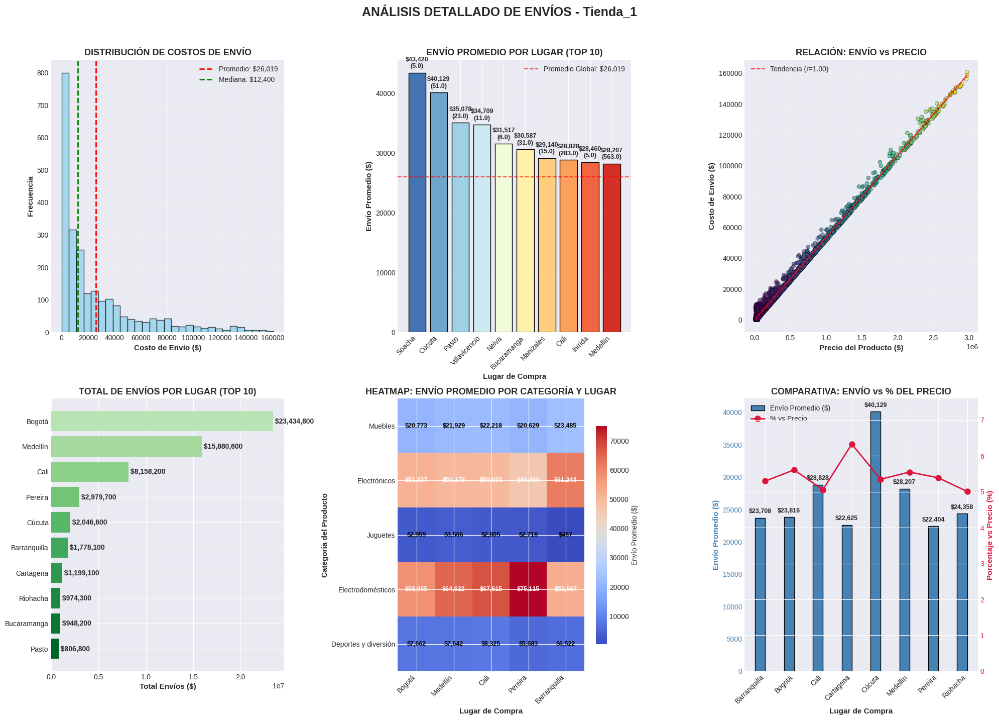


 RESUMEN Y RECOMENDACIONES - Tienda_1:
--------------------------------------------------
1. LUGAR CON MAYOR ENVÍO PROMEDIO:
   • Soacha: $43,420.00
   • Recomendación: Revisar logística o negociar mejores tarifas

2. LUGAR CON MENOR ENVÍO PROMEDIO:
   • Armenia: $17,314.29
   • Recomendación: Replicar estrategia logística exitosa

3. EFICIENCIA LOGÍSTICA:
   • Costo promedio por envío: $26,018.61
   • Porcentaje vs precio: 5.5%

4. OPTIMIZACIÓN DE COSTOS:
   • Desviación estándar: $32,860.00
   • Rango: $0.00 - $160,800.00


ANÁLISIS DE ENVÍOS: Tienda_2

 ENVÍO PROMEDIO POR TIENDA - Tienda_2
--------------------------------------------------
 ESTADÍSTICAS DE ENVÍO:
  • Envío promedio: $25,216.24
  • Envío mediano: $11,600.00
  • Envío máximo: $162,500.00
  • Envío mínimo: $0.00
  • Total en envíos: $59,485,100.00
  • Porcentaje promedio vs precio: 5.6%

 ENVÍO POR LUGAR DE COMPRA - Tienda_2
--------------------------------------------------

 TOP 5 LUGARES CON MAYOR ENVÍO PROMEDIO:
 

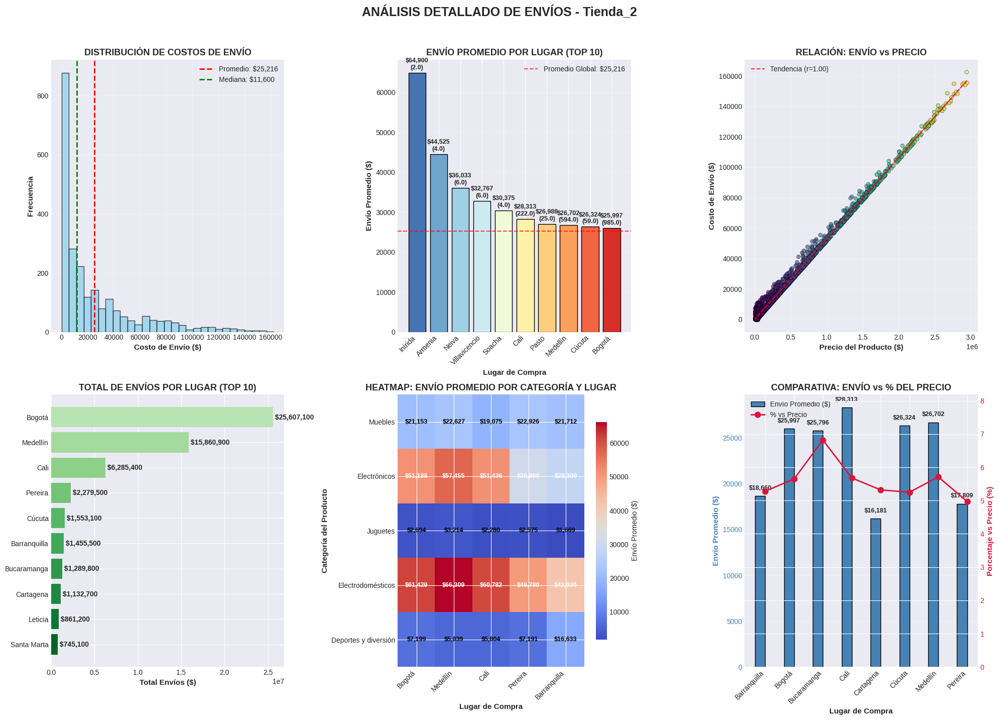


 RESUMEN Y RECOMENDACIONES - Tienda_2:
--------------------------------------------------
1. LUGAR CON MAYOR ENVÍO PROMEDIO:
   • Inírida: $64,900.00
   • Recomendación: Revisar logística o negociar mejores tarifas

2. LUGAR CON MENOR ENVÍO PROMEDIO:
   • Manizales: $13,476.92
   • Recomendación: Replicar estrategia logística exitosa

3. EFICIENCIA LOGÍSTICA:
   • Costo promedio por envío: $25,216.24
   • Porcentaje vs precio: 5.6%

4. OPTIMIZACIÓN DE COSTOS:
   • Desviación estándar: $31,741.38
   • Rango: $0.00 - $162,500.00


ANÁLISIS DE ENVÍOS: Tienda_3

 ENVÍO PROMEDIO POR TIENDA - Tienda_3
--------------------------------------------------
 ESTADÍSTICAS DE ENVÍO:
  • Envío promedio: $24,805.68
  • Envío mediano: $11,900.00
  • Envío máximo: $158,400.00
  • Envío mínimo: $0.00
  • Total en envíos: $58,516,600.00
  • Porcentaje promedio vs precio: 5.4%

 ENVÍO POR LUGAR DE COMPRA - Tienda_3
--------------------------------------------------

 TOP 5 LUGARES CON MAYOR ENVÍO PROMEDIO

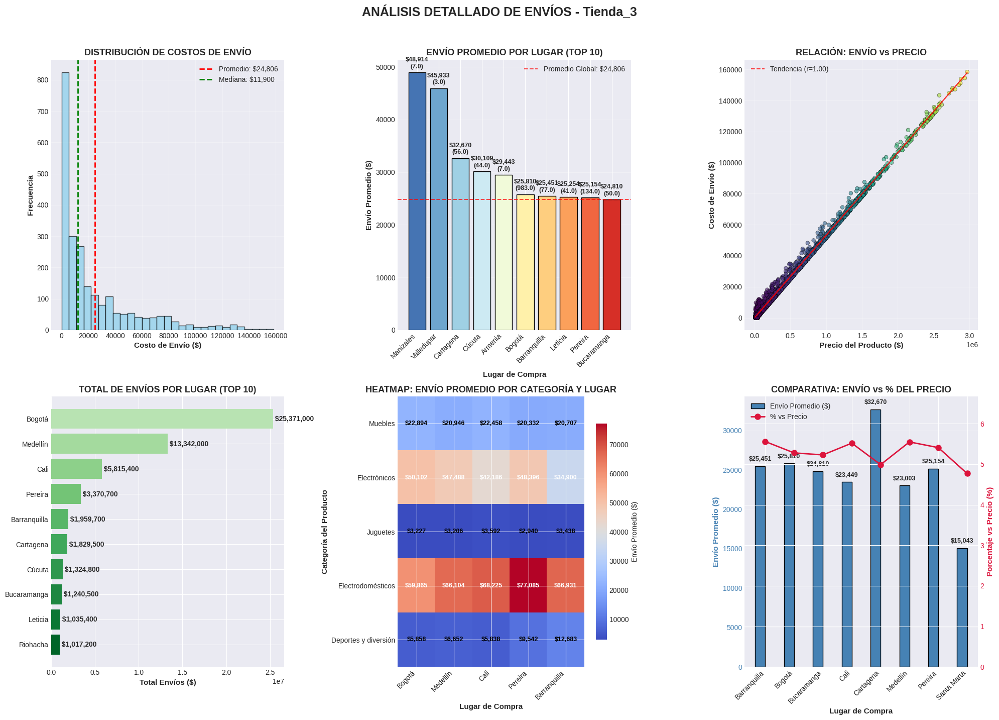


 RESUMEN Y RECOMENDACIONES - Tienda_3:
--------------------------------------------------
1. LUGAR CON MAYOR ENVÍO PROMEDIO:
   • Manizales: $48,914.29
   • Recomendación: Revisar logística o negociar mejores tarifas

2. LUGAR CON MENOR ENVÍO PROMEDIO:
   • Villavicencio: $11,820.00
   • Recomendación: Replicar estrategia logística exitosa

3. EFICIENCIA LOGÍSTICA:
   • Costo promedio por envío: $24,805.68
   • Porcentaje vs precio: 5.4%

4. OPTIMIZACIÓN DE COSTOS:
   • Desviación estándar: $30,945.89
   • Rango: $0.00 - $158,400.00


ANÁLISIS DE ENVÍOS: Tienda_4

 ENVÍO PROMEDIO POR TIENDA - Tienda_4
--------------------------------------------------
 ESTADÍSTICAS DE ENVÍO:
  • Envío promedio: $23,459.46
  • Envío mediano: $10,950.00
  • Envío máximo: $154,700.00
  • Envío mínimo: $0.00
  • Total en envíos: $55,317,400.00
  • Porcentaje promedio vs precio: 5.5%

 ENVÍO POR LUGAR DE COMPRA - Tienda_4
--------------------------------------------------

 TOP 5 LUGARES CON MAYOR ENVÍO PR

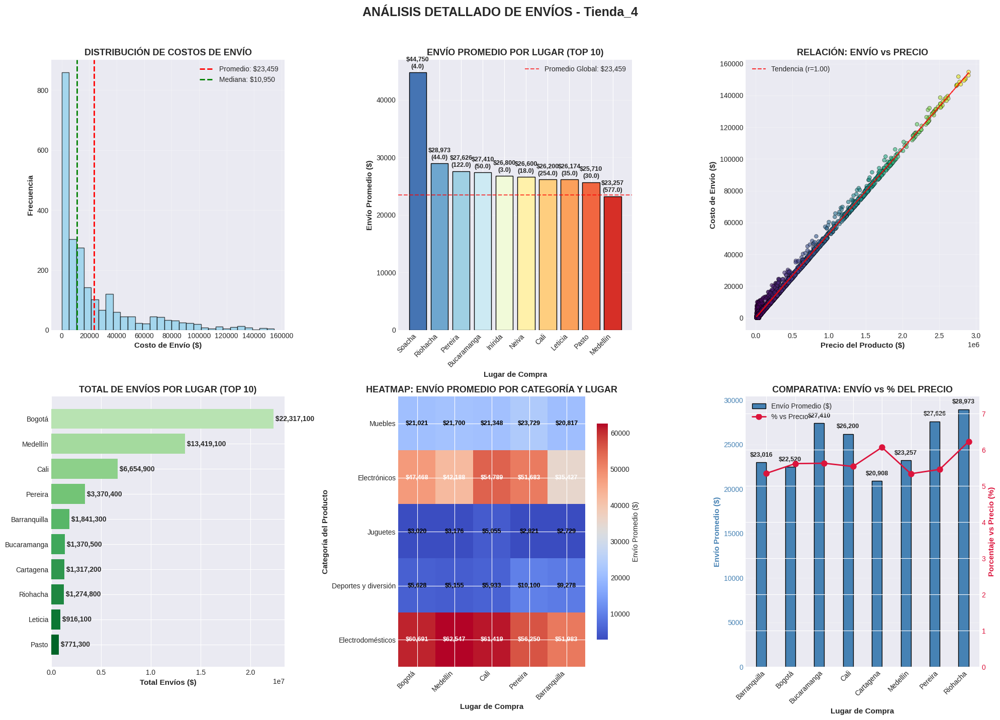


 RESUMEN Y RECOMENDACIONES - Tienda_4:
--------------------------------------------------
1. LUGAR CON MAYOR ENVÍO PROMEDIO:
   • Soacha: $44,750.00
   • Recomendación: Revisar logística o negociar mejores tarifas

2. LUGAR CON MENOR ENVÍO PROMEDIO:
   • Armenia: $4,566.67
   • Recomendación: Replicar estrategia logística exitosa

3. EFICIENCIA LOGÍSTICA:
   • Costo promedio por envío: $23,459.46
   • Porcentaje vs precio: 5.5%

4. OPTIMIZACIÓN DE COSTOS:
   • Desviación estándar: $30,279.10
   • Rango: $0.00 - $154,700.00


📊 ANÁLISIS COMPARATIVO DE ENVÍOS ENTRE TIENDAS

 COMPARATIVA DE ENVÍOS POR TIENDA:
------------------------------------------------------------
          Envio_Promedio  Envio_Total  Desviacion_Envio  Total_Envios  Precio_Promedio  Porcentaje_vs_Precio
Tienda                                                                                                      
Tienda_1        26018.61   61377900.0          32860.00          2359        487867.91                  5.

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

url = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_1%20.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_4.csv"

tienda = pd.read_csv(url)
tienda2 = pd.read_csv(url2)
tienda3 = pd.read_csv(url3)
tienda4 = pd.read_csv(url4)
#===========================================================================
todas_tiendas = pd.concat([
    tienda.assign(Tienda='Tienda_1'),
    tienda2.assign(Tienda='Tienda_2'),
    tienda3.assign(Tienda='Tienda_3'),
    tienda4.assign(Tienda='Tienda_4')
], ignore_index=True)
#===========================================================================
# Análisis por cada tienda
for tienda_nombre in ['Tienda_1', 'Tienda_2', 'Tienda_3', 'Tienda_4']:
    print(f"\n{'='*80}")
    print(f"ANÁLISIS DE ENVÍOS: {tienda_nombre}")
    print(f"{'='*80}")

    # Filtrar datos de la tienda actual
    datos_tienda = todas_tiendas[todas_tiendas['Tienda'] == tienda_nombre].copy()

    # 1. ENVÍO PROMEDIO POR C/DA TIENDA

    print(f"\n ENVÍO PROMEDIO POR TIENDA - {tienda_nombre}")
    print("-" * 50)

    # Crear estadísticas de envío
    envio_promedio = datos_tienda['Costo de envío'].mean()
    envio_mediano = datos_tienda['Costo de envío'].median()
    envio_max = datos_tienda['Costo de envío'].max()
    envio_min = datos_tienda['Costo de envío'].min()
    envio_total = datos_tienda['Costo de envío'].sum()

    print(f" ESTADÍSTICAS DE ENVÍO:")
    print(f"  • Envío promedio: ${envio_promedio:,.2f}")
    print(f"  • Envío mediano: ${envio_mediano:,.2f}")
    print(f"  • Envío máximo: ${envio_max:,.2f}")
    print(f"  • Envío mínimo: ${envio_min:,.2f}")
    print(f"  • Total en envíos: ${envio_total:,.2f}")

    # Porcentaje del envío respecto al precio =====================================

    datos_tienda['Porcentaje_Envio'] = (datos_tienda['Costo de envío'] / datos_tienda['Precio']) * 100
    porcentaje_promedio = datos_tienda['Porcentaje_Envio'].mean()
    print(f"  • Porcentaje promedio vs precio: {porcentaje_promedio:.1f}%")


    # 2. ANÁLISIS POR LUGAR DE COMPRA

    print(f"\n ENVÍO POR LUGAR DE COMPRA - {tienda_nombre}")
    print("-" * 50)

    # Envío promedio por lugar de compra
    envio_por_lugar = datos_tienda.groupby('Lugar de Compra').agg({
        'Costo de envío': ['mean', 'sum', 'count', 'std'],
        'Precio': 'mean'
    }).round(2)

    envio_por_lugar.columns = ['_'.join(col).strip() for col in envio_por_lugar.columns.values]
    envio_por_lugar = envio_por_lugar.rename(columns={
        'Costo de envío_mean': 'Envio_Promedio',
        'Costo de envío_sum': 'Envio_Total',
        'Costo de envío_count': 'Cantidad_Envios',
        'Costo de envío_std': 'Desviacion_Envio',
        'Precio_mean': 'Precio_Promedio'
    })

    # Ordenar por envío promedio de mayor a menor
    envio_por_lugar = envio_por_lugar.sort_values('Envio_Promedio', ascending=False)

    print(f"\n TOP 5 LUGARES CON MAYOR ENVÍO PROMEDIO:")
    for i, (lugar, datos) in enumerate(envio_por_lugar.head(5).iterrows(), 1):
        print(f"  {i}. {lugar}: ${datos['Envio_Promedio']:,.2f} ({datos['Cantidad_Envios']} envíos)")

    print(f"\n TOP 5 LUGARES CON MENOR ENVÍO PROMEDIO:")
    for i, (lugar, datos) in enumerate(envio_por_lugar.tail(5).iterrows(), 1):
        print(f"  {i}. {lugar}: ${datos['Envio_Promedio']:,.2f} ({datos['Cantidad_Envios']} envíos)")


    # 3. ANÁLISIS DE RELACIÓN ENVÍO-PRECIO

    print(f"\n RELACIÓN ENVÍO-PRECIO - {tienda_nombre}")
    print("-" * 50)

    # Calcular la correlación
    correlacion_envio_precio = datos_tienda['Costo de envío'].corr(datos_tienda['Precio'])
    print(f"  • Correlación Envío-Precio: {correlacion_envio_precio:.3f}")

    if correlacion_envio_precio > 0.7:
        print("    → FUERTE correlación positiva: Envíos más caros para productos más caros")
    elif correlacion_envio_precio > 0.3:
        print("    → MODERADA correlación positiva")
    elif correlacion_envio_precio < -0.3:
        print("    → Correlación NEGATIVA: Envíos más baratos para productos más caros")
    else:
        print("    → Correlación DÉBIL: Poca relación entre envío y precio")


    # 4. GRÁFICOS DETALLADOS

    print(f"\n GENERANDO GRÁFICOS DETALLADOS PARA {tienda_nombre}...")

    fig, axes = plt.subplots(2, 3, figsize=(20, 14))
    fig.suptitle(f'ANÁLISIS DETALLADO DE ENVÍOS - {tienda_nombre}',
                 fontsize=18, fontweight='bold', y=1.02)

    # Gráfico 1: Distribución de costos y de envío
    ax1 = axes[0, 0]
    bins = np.linspace(0, datos_tienda['Costo de envío'].max(), 30)
    ax1.hist(datos_tienda['Costo de envío'], bins=bins, color='skyblue',
             edgecolor='black', alpha=0.7)
    ax1.axvline(x=envio_promedio, color='red', linestyle='--', linewidth=2,
                label=f'Promedio: ${envio_promedio:,.0f}')
    ax1.axvline(x=envio_mediano, color='green', linestyle='--', linewidth=2,
                label=f'Mediana: ${envio_mediano:,.0f}')
    ax1.set_xlabel('Costo de Envío ($)', fontsize=11, fontweight='bold')
    ax1.set_ylabel('Frecuencia', fontsize=11, fontweight='bold')
    ax1.set_title('DISTRIBUCIÓN DE COSTOS DE ENVÍO', fontsize=13, fontweight='bold')
    ax1.legend()
    ax1.grid(True, alpha=0.3)

    # Gráfico 2: Envío promedio por lugar de compra segun Top 10
    ax2 = axes[0, 1]
    top_lugares_envio = envio_por_lugar.head(10)
    colors2 = plt.cm.RdYlBu_r(np.linspace(0.1, 0.9, len(top_lugares_envio)))
    bars2 = ax2.bar(range(len(top_lugares_envio)), top_lugares_envio['Envio_Promedio'],
                   color=colors2, edgecolor='black')
    ax2.set_xlabel('Lugar de Compra', fontsize=11, fontweight='bold')
    ax2.set_ylabel('Envío Promedio ($)', fontsize=11, fontweight='bold')
    ax2.set_title('ENVÍO PROMEDIO POR LUGAR (TOP 10)', fontsize=13, fontweight='bold')
    ax2.set_xticks(range(len(top_lugares_envio)))
    ax2.set_xticklabels(top_lugares_envio.index, rotation=45, ha='right')
    ax2.axhline(y=envio_promedio, color='red', linestyle='--', alpha=0.7,
                label=f'Promedio Global: ${envio_promedio:,.0f}')
    ax2.legend(loc='upper right')
    ax2.grid(True, alpha=0.3, axis='y')

    # Añadir valores en las barras
    for i, bar in enumerate(bars2):
        height = bar.get_height()
        cantidad = top_lugares_envio.iloc[i]['Cantidad_Envios']
        ax2.text(bar.get_x() + bar.get_width()/2., height + envio_promedio*0.02,
                f'${height:,.0f}\n({cantidad})',
                ha='center', va='bottom', fontsize=9, fontweight='bold')

    # Gráfico 3: Relación Envío vs Precio
    ax3 = axes[0, 2]
    scatter = ax3.scatter(datos_tienda['Precio'], datos_tienda['Costo de envío'],
                         alpha=0.6, c=datos_tienda['Precio'], cmap='viridis',
                         s=30, edgecolor='black', linewidth=0.5)
    ax3.set_xlabel('Precio del Producto ($)', fontsize=11, fontweight='bold')
    ax3.set_ylabel('Costo de Envío ($)', fontsize=11, fontweight='bold')
    ax3.set_title('RELACIÓN: ENVÍO vs PRECIO', fontsize=13, fontweight='bold')

    # Añadir línea de tendencia
    z = np.polyfit(datos_tienda['Precio'], datos_tienda['Costo de envío'], 1)
    p = np.poly1d(z)
    ax3.plot(datos_tienda['Precio'], p(datos_tienda['Precio']), "r--", alpha=0.8,
             label=f'Tendencia (r={correlacion_envio_precio:.2f})')
    ax3.legend()
    ax3.grid(True, alpha=0.3)

    # Gráfico 4: Total de envíos por lugar barras horizontales
    ax4 = axes[1, 0]
    top_lugares_total = envio_por_lugar.sort_values('Envio_Total', ascending=False).head(10)
    bars4 = ax4.barh(range(len(top_lugares_total)), top_lugares_total['Envio_Total'],
                    color=plt.cm.Greens(np.linspace(0.3, 0.9, len(top_lugares_total))))
    ax4.set_yticks(range(len(top_lugares_total)))
    ax4.set_yticklabels(top_lugares_total.index)
    ax4.set_xlabel('Total Envíos ($)', fontsize=11, fontweight='bold')
    ax4.set_title('TOTAL DE ENVÍOS POR LUGAR (TOP 10)', fontsize=13, fontweight='bold')
    ax4.invert_yaxis()

    # Añadir valores en las barras
    for i, v in enumerate(top_lugares_total['Envio_Total']):
        ax4.text(v, i, f' ${v:,.0f}', va='center', fontweight='bold')

    # Gráfico 5: Heatmap Envío Promedio por Lugar y Categoría
    ax5 = axes[1, 1]
    # Seleccionar top 5 categorías y top 5 lugares
    top_categorias = datos_tienda['Categoría del Producto'].value_counts().head(5).index
    top_lugares_heat = datos_tienda['Lugar de Compra'].value_counts().head(5).index

    datos_filtrados = datos_tienda[
        datos_tienda['Categoría del Producto'].isin(top_categorias) &
        datos_tienda['Lugar de Compra'].isin(top_lugares_heat)
    ]

    # Crear matriz para heatmap
    heatmap_data = datos_filtrados.pivot_table(
        index='Categoría del Producto',
        columns='Lugar de Compra',
        values='Costo de envío',
        aggfunc='mean',
        fill_value=0
    ).round(2)

    # Ordenar datos =====================================================================
    heatmap_data = heatmap_data.reindex(top_categorias).reindex(columns=top_lugares_heat)

    # Voy a crear heatmap ======================================================
    im = ax5.imshow(heatmap_data, cmap='coolwarm', aspect='auto')
    ax5.set_xlabel('Lugar de Compra', fontsize=11, fontweight='bold')
    ax5.set_ylabel('Categoría del Producto', fontsize=11, fontweight='bold')
    ax5.set_title('HEATMAP: ENVÍO PROMEDIO POR CATEGORÍA Y LUGAR', fontsize=13, fontweight='bold')
    ax5.set_xticks(range(len(top_lugares_heat)))
    ax5.set_xticklabels(top_lugares_heat, rotation=45, ha='right')
    ax5.set_yticks(range(len(top_categorias)))
    ax5.set_yticklabels(top_categorias)

    # Añadir barra de color
    cbar = plt.colorbar(im, ax=ax5, shrink=0.8)
    cbar.set_label('Envío Promedio ($)', fontsize=10)

    # Añadir valores en las celdas
    for i in range(len(top_categorias)):
        for j in range(len(top_lugares_heat)):
            valor = heatmap_data.iloc[i, j]
            if valor > 0:
                color = 'white' if valor > heatmap_data.values.mean() else 'black'
                ax5.text(j, i, f'${valor:,.0f}', ha='center', va='center',
                        color=color, fontweight='bold', fontsize=9)

    # Gráfico 6: Comparativa Envío vs Porcentaje del Precio
    ax6 = axes[1, 2]

    # Seleccionar top 8 lugares por cantidad de envíos
    top_8_lugares = envio_por_lugar.sort_values('Cantidad_Envios', ascending=False).head(8).index
    datos_top_lugares = datos_tienda[datos_tienda['Lugar de Compra'].isin(top_8_lugares)]

    # Calcular métricas por lugar
    comparativa_lugares = datos_top_lugares.groupby('Lugar de Compra').agg({
        'Costo de envío': 'mean',
        'Porcentaje_Envio': 'mean'
    }).round(2)

    x_pos = np.arange(len(comparativa_lugares))
    width = 0.35

    # Barras para envío promedio
    bars6a = ax6.bar(x_pos - width/2, comparativa_lugares['Costo de envío'],
                    width, label='Envío Promedio ($)', color='steelblue', edgecolor='black')

    # Línea para porcentaje segundo eje Y
    ax6_twin = ax6.twinx()
    line6b = ax6_twin.plot(x_pos, comparativa_lugares['Porcentaje_Envio'],
                          color='crimson', marker='o', linewidth=2, markersize=8,
                          label='% vs Precio')

    ax6.set_xlabel('Lugar de Compra', fontsize=11, fontweight='bold')
    ax6.set_ylabel('Envío Promedio ($)', fontsize=11, fontweight='bold', color='steelblue')
    ax6.set_xticks(x_pos)
    ax6.set_xticklabels(comparativa_lugares.index, rotation=45, ha='right')
    ax6.tick_params(axis='y', labelcolor='steelblue')
    ax6.set_title('COMPARATIVA: ENVÍO vs % DEL PRECIO', fontsize=13, fontweight='bold')
    ax6.grid(True, alpha=0.3, axis='y')

    ax6_twin.set_ylabel('Porcentaje vs Precio (%)', fontsize=11, fontweight='bold', color='crimson')
    ax6_twin.tick_params(axis='y', labelcolor='crimson')
    ax6_twin.set_ylim(0, comparativa_lugares['Porcentaje_Envio'].max() * 1.2)

    # Añadir valores en las barras
    for i, bar in enumerate(bars6a):
        height = bar.get_height()
        ax6.text(bar.get_x() + bar.get_width()/2., height + envio_promedio*0.02,
                f'${height:,.0f}', ha='center', va='bottom', fontsize=9, fontweight='bold')

    # Combinar leyendas
    lines1, labels1 = ax6.get_legend_handles_labels()
    lines2, labels2 = ax6_twin.get_legend_handles_labels()
    ax6.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

    plt.tight_layout()
    plt.show()


    # 5. RESUMEN Y RECOMENDACIONES

    print(f"\n RESUMEN Y RECOMENDACIONES - {tienda_nombre}:")
    print("-" * 50)

    # Identificar oportunidades de optimización
    lugar_mayor_envio = envio_por_lugar.iloc[0]
    lugar_menor_envio = envio_por_lugar.iloc[-1]

    print(f"1. LUGAR CON MAYOR ENVÍO PROMEDIO:")
    print(f"   • {envio_por_lugar.index[0]}: ${lugar_mayor_envio['Envio_Promedio']:,.2f}")
    print(f"   • Recomendación: Revisar logística o negociar mejores tarifas")

    print(f"\n2. LUGAR CON MENOR ENVÍO PROMEDIO:")
    print(f"   • {envio_por_lugar.index[-1]}: ${lugar_menor_envio['Envio_Promedio']:,.2f}")
    print(f"   • Recomendación: Replicar estrategia logística exitosa")

    # Análisis de eficiencia
    eficiencia_promedio = (envio_total / len(datos_tienda))
    print(f"\n3. EFICIENCIA LOGÍSTICA:")
    print(f"   • Costo promedio por envío: ${eficiencia_promedio:,.2f}")
    print(f"   • Porcentaje vs precio: {porcentaje_promedio:.1f}%")

    if porcentaje_promedio > 10:
        print(f"   •  OPORTUNIDAD: Envíos representan más del 10% del precio")
    elif porcentaje_promedio < 5:
        print(f"   •  EXCELENTE: Envíos representan menos del 5% del precio")

    print(f"\n4. OPTIMIZACIÓN DE COSTOS:")
    print(f"   • Desviación estándar: ${datos_tienda['Costo de envío'].std():,.2f}")
    print(f"   • Rango: ${envio_min:,.2f} - ${envio_max:,.2f}")

    # Recomendación basada en correlación
    if correlacion_envio_precio < 0.3:
        print(f"   •   OPORTUNIDAD: Poca relación envío-precio, revisar estructura de costos")

    print(f"\n{'='*80}")


# ANÁLISIS COMPARATIVO ENTRE TIENDAS

print("\n" + "="*80)
print(" ANÁLISIS COMPARATIVO DE ENVÍOS ENTRE TIENDAS")
print("="*80)

# Calcular métricas comparativas
comparativa_envios = todas_tiendas.groupby('Tienda').agg({
    'Costo de envío': ['mean', 'sum', 'std', 'count'],
    'Precio': 'mean'
}).round(2)

comparativa_envios.columns = ['_'.join(col).strip() for col in comparativa_envios.columns.values]
comparativa_envios = comparativa_envios.rename(columns={
    'Costo de envío_mean': 'Envio_Promedio',
    'Costo de envío_sum': 'Envio_Total',
    'Costo de envío_std': 'Desviacion_Envio',
    'Costo de envío_count': 'Total_Envios',
    'Precio_mean': 'Precio_Promedio'
})

# Calcular porcentaje vs precio
comparativa_envios['Porcentaje_vs_Precio'] = (comparativa_envios['Envio_Promedio'] / comparativa_envios['Precio_Promedio'] * 100).round(2)

# Ordenar por envío promedio
comparativa_envios = comparativa_envios.sort_values('Envio_Promedio', ascending=False)

print("\n COMPARATIVA DE ENVÍOS POR TIENDA:")
print("-" * 60)
print(comparativa_envios.to_string())

print(f"\n RANKING DE ENVÍOS PROMEDIO:")
print("-" * 40)
for i, (tienda_nombre, datos) in enumerate(comparativa_envios.iterrows(), 1):
    print(f"{i}. {tienda_nombre}: ${datos['Envio_Promedio']:,.2f} "
          f"({datos['Porcentaje_vs_Precio']:.1f}% del precio)")

print(f"\n INSIGHTS TRANSVERSALES:")
print("-" * 40)
print(f"1. MEJOR DESEMPEÑO: {comparativa_envios.iloc[-1].name} "
      f"(${comparativa_envios['Envio_Promedio'].min():,.2f} por envío)")
print(f"2. MAYOR OPORTUNIDAD: {comparativa_envios.iloc[0].name} "
      f"(${comparativa_envios['Envio_Promedio'].max():,.2f} por envío)")
print(f"3. MÁS CONSISTENTE: {comparativa_envios['Desviacion_Envio'].idxmin()} "
      f"(menor variación: ${comparativa_envios['Desviacion_Envio'].min():,.2f})")

print(f"\n RECOMENDACIONES GENERALES:")
print("-" * 40)
print("1. Establecer tarifas de envío más consistentes entre tiendas")
print("2. Negociar mejores tarifas con transportistas para tiendas con costos altos")
print("3. Implementar política de envíos gratuitos para órdenes sobre cierto monto")
print("4. Optimizar rutas de entrega basadas en análisis geográfico")

print(f"\n{'='*80}")
print(" ANÁLISIS DE ENVÍOS COMPLETADO")
print(f"{'='*80}")


 ANÁLISIS DE ENVÍOS: Tienda_1

 ENVÍO PROMEDIO POR TIENDA - Tienda_1
--------------------------------------------------
 ESTADÍSTICAS DE ENVÍO:
  • Envío promedio: $26,018.61
  • Envío mediano: $12,400.00
  • Envío máximo: $160,800.00
  • Envío mínimo: $0.00
  • Total en envíos: $61,377,900.00
  • Porcentaje promedio vs precio: 5.5%

 ENVÍO POR LUGAR DE COMPRA - Tienda_1
--------------------------------------------------

 TOP 5 LUGARES CON MAYOR ENVÍO PROMEDIO:
  1. Soacha: $43,420.00 (5.0 envíos)
  2. Cúcuta: $40,129.41 (51.0 envíos)
  3. Pasto: $35,078.26 (23.0 envíos)
  4. Villavicencio: $34,709.09 (11.0 envíos)
  5. Neiva: $31,516.67 (6.0 envíos)

 TOP 5 LUGARES CON MENOR ENVÍO PROMEDIO:
  1. Cartagena: $22,624.53 (53.0 envíos)
  2. Santa Marta: $22,593.75 (32.0 envíos)
  3. Pereira: $22,403.76 (133.0 envíos)
  4. Valledupar: $18,766.67 (3.0 envíos)
  5. Armenia: $17,314.29 (14.0 envíos)

 RELACIÓN ENVÍO-PRECIO - Tienda_1
--------------------------------------------------
  • Cor

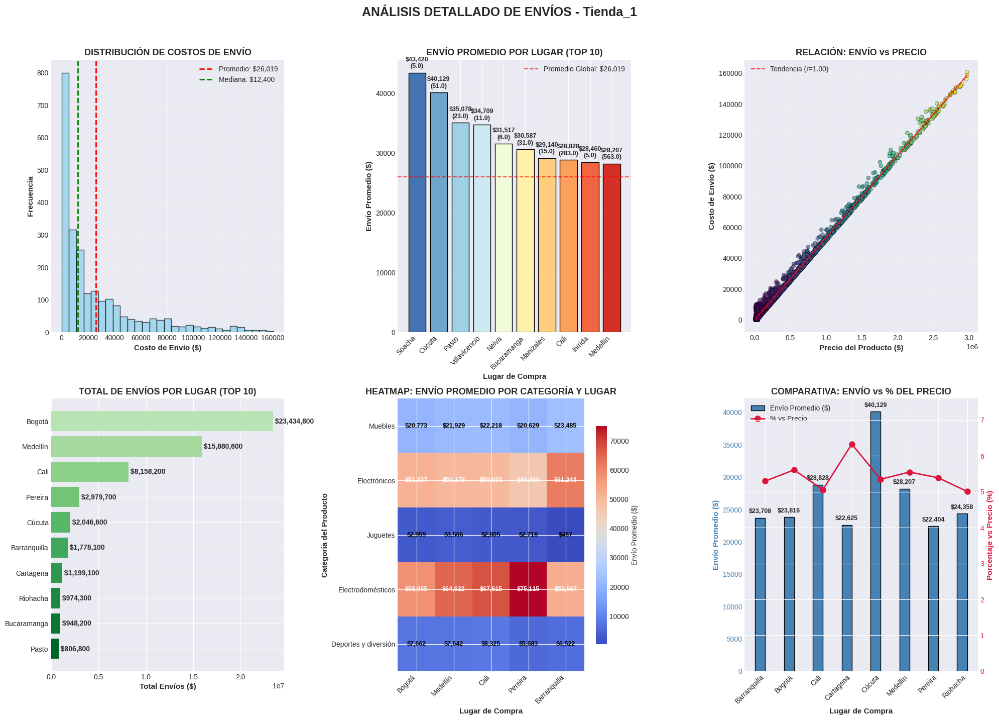


 RESUMEN Y RECOMENDACIONES - Tienda_1:
--------------------------------------------------
1. LUGAR CON MAYOR ENVÍO PROMEDIO:
   • Soacha: $43,420.00
   • Recomendación: Revisar logística o negociar mejores tarifas

2. LUGAR CON MENOR ENVÍO PROMEDIO:
   • Armenia: $17,314.29
   • Recomendación: Replicar estrategia logística exitosa

3. EFICIENCIA LOGÍSTICA:
   • Costo promedio por envío: $26,018.61
   • Porcentaje vs precio: 5.5%

4. OPTIMIZACIÓN DE COSTOS:
   • Desviación estándar: $32,860.00
   • Rango: $0.00 - $160,800.00


 ANÁLISIS DE ENVÍOS: Tienda_2

 ENVÍO PROMEDIO POR TIENDA - Tienda_2
--------------------------------------------------
 ESTADÍSTICAS DE ENVÍO:
  • Envío promedio: $25,216.24
  • Envío mediano: $11,600.00
  • Envío máximo: $162,500.00
  • Envío mínimo: $0.00
  • Total en envíos: $59,485,100.00
  • Porcentaje promedio vs precio: 5.6%

 ENVÍO POR LUGAR DE COMPRA - Tienda_2
--------------------------------------------------

 TOP 5 LUGARES CON MAYOR ENVÍO PROMEDIO:


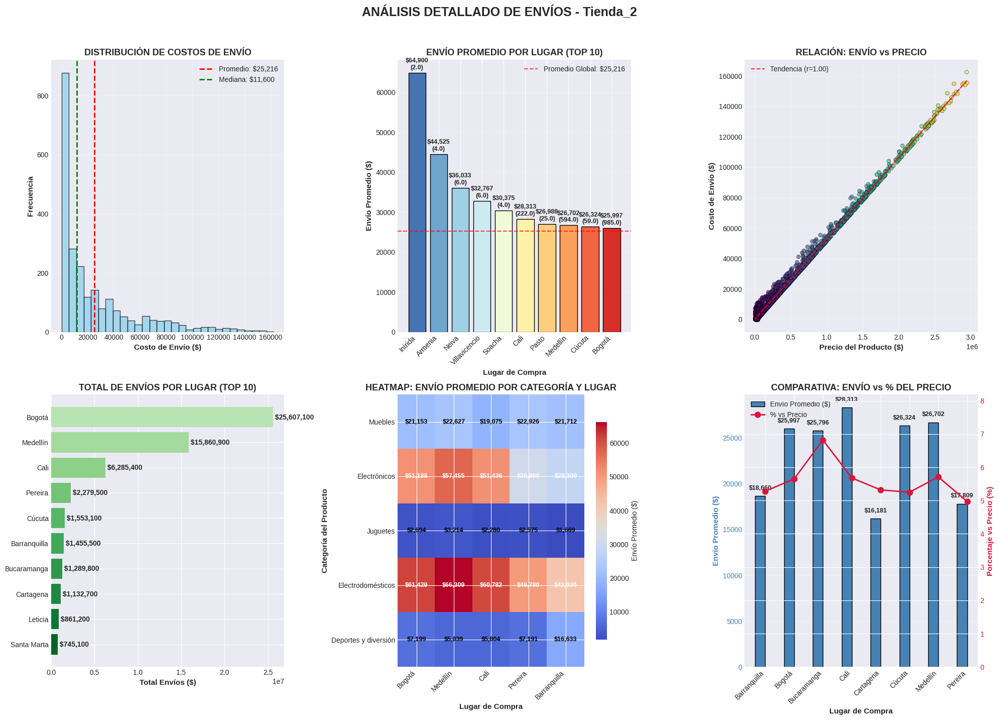


 RESUMEN Y RECOMENDACIONES - Tienda_2:
--------------------------------------------------
1. LUGAR CON MAYOR ENVÍO PROMEDIO:
   • Inírida: $64,900.00
   • Recomendación: Revisar logística o negociar mejores tarifas

2. LUGAR CON MENOR ENVÍO PROMEDIO:
   • Manizales: $13,476.92
   • Recomendación: Replicar estrategia logística exitosa

3. EFICIENCIA LOGÍSTICA:
   • Costo promedio por envío: $25,216.24
   • Porcentaje vs precio: 5.6%

4. OPTIMIZACIÓN DE COSTOS:
   • Desviación estándar: $31,741.38
   • Rango: $0.00 - $162,500.00


 ANÁLISIS DE ENVÍOS: Tienda_3

 ENVÍO PROMEDIO POR TIENDA - Tienda_3
--------------------------------------------------
 ESTADÍSTICAS DE ENVÍO:
  • Envío promedio: $24,805.68
  • Envío mediano: $11,900.00
  • Envío máximo: $158,400.00
  • Envío mínimo: $0.00
  • Total en envíos: $58,516,600.00
  • Porcentaje promedio vs precio: 5.4%

 ENVÍO POR LUGAR DE COMPRA - Tienda_3
--------------------------------------------------

 TOP 5 LUGARES CON MAYOR ENVÍO PROMEDI

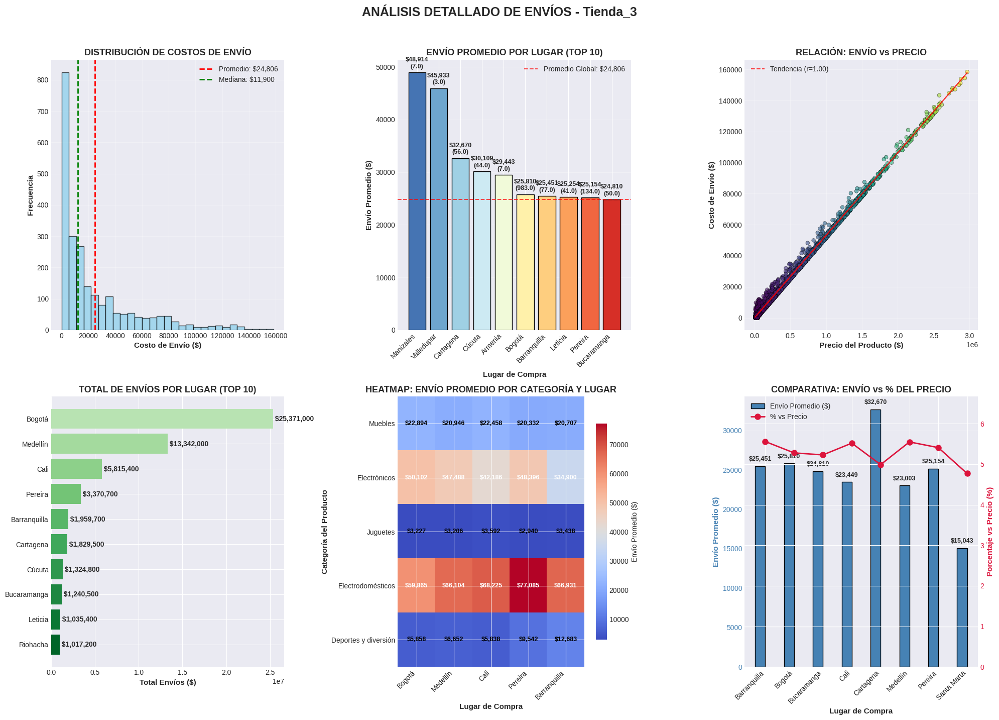


 RESUMEN Y RECOMENDACIONES - Tienda_3:
--------------------------------------------------
1. LUGAR CON MAYOR ENVÍO PROMEDIO:
   • Manizales: $48,914.29
   • Recomendación: Revisar logística o negociar mejores tarifas

2. LUGAR CON MENOR ENVÍO PROMEDIO:
   • Villavicencio: $11,820.00
   • Recomendación: Replicar estrategia logística exitosa

3. EFICIENCIA LOGÍSTICA:
   • Costo promedio por envío: $24,805.68
   • Porcentaje vs precio: 5.4%

4. OPTIMIZACIÓN DE COSTOS:
   • Desviación estándar: $30,945.89
   • Rango: $0.00 - $158,400.00


 ANÁLISIS DE ENVÍOS: Tienda_4

 ENVÍO PROMEDIO POR TIENDA - Tienda_4
--------------------------------------------------
 ESTADÍSTICAS DE ENVÍO:
  • Envío promedio: $23,459.46
  • Envío mediano: $10,950.00
  • Envío máximo: $154,700.00
  • Envío mínimo: $0.00
  • Total en envíos: $55,317,400.00
  • Porcentaje promedio vs precio: 5.5%

 ENVÍO POR LUGAR DE COMPRA - Tienda_4
--------------------------------------------------

 TOP 5 LUGARES CON MAYOR ENVÍO P

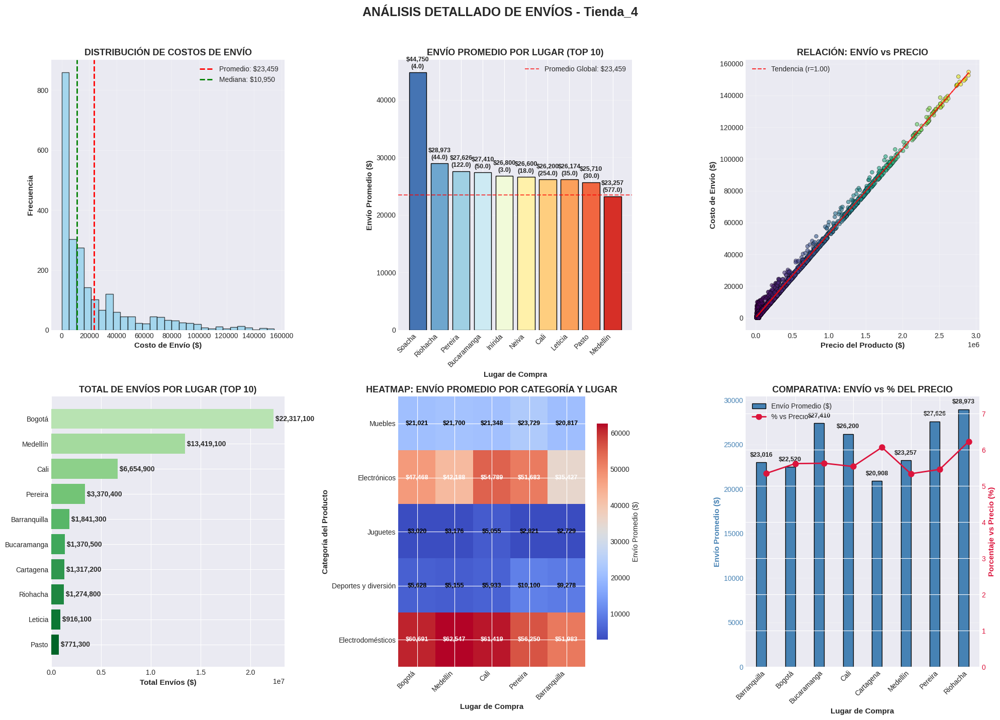


 RESUMEN Y RECOMENDACIONES - Tienda_4:
--------------------------------------------------
1. LUGAR CON MAYOR ENVÍO PROMEDIO:
   • Soacha: $44,750.00
   • Recomendación: Revisar logística o negociar mejores tarifas

2. LUGAR CON MENOR ENVÍO PROMEDIO:
   • Armenia: $4,566.67
   • Recomendación: Replicar estrategia logística exitosa

3. EFICIENCIA LOGÍSTICA:
   • Costo promedio por envío: $23,459.46
   • Porcentaje vs precio: 5.5%

4. OPTIMIZACIÓN DE COSTOS:
   • Desviación estándar: $30,279.10
   • Rango: $0.00 - $154,700.00


 ANÁLISIS COMPARATIVO DE ENVÍOS ENTRE TIENDAS

 COMPARATIVA DE ENVÍOS POR TIENDA:
------------------------------------------------------------
          Envio_Promedio  Envio_Total  Desviacion_Envio  Total_Envios  Precio_Promedio  Porcentaje_vs_Precio
Tienda                                                                                                      
Tienda_1        26018.61   61377900.0          32860.00          2359        487867.91                  5.3

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

url = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_1%20.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_4.csv"

tienda = pd.read_csv(url)
tienda2 = pd.read_csv(url2)
tienda3 = pd.read_csv(url3)
tienda4 = pd.read_csv(url4)

todas_tiendas = pd.concat([
    tienda.assign(Tienda='Tienda_1'),
    tienda2.assign(Tienda='Tienda_2'),
    tienda3.assign(Tienda='Tienda_3'),
    tienda4.assign(Tienda='Tienda_4')
], ignore_index=True)

# Análisis por tienda
for tienda_nombre in ['Tienda_1', 'Tienda_2', 'Tienda_3', 'Tienda_4']:
    print(f"\n{'='*80}")
    print(f" ANÁLISIS DE ENVÍOS: {tienda_nombre}")
    print(f"{'='*80}")

    # Filtrar datos de la tienda actual
    datos_tienda = todas_tiendas[todas_tiendas['Tienda'] == tienda_nombre].copy()

    # 1. ENVÍO PROMEDIO POR TIENDA

    print(f"\n ENVÍO PROMEDIO POR TIENDA - {tienda_nombre}")
    print("-" * 50)

    # Estadísticas de envío
    envio_promedio = datos_tienda['Costo de envío'].mean()
    envio_mediano = datos_tienda['Costo de envío'].median()
    envio_max = datos_tienda['Costo de envío'].max()
    envio_min = datos_tienda['Costo de envío'].min()
    envio_total = datos_tienda['Costo de envío'].sum()

    print(f" ESTADÍSTICAS DE ENVÍO:")
    print(f"  • Envío promedio: ${envio_promedio:,.2f}")
    print(f"  • Envío mediano: ${envio_mediano:,.2f}")
    print(f"  • Envío máximo: ${envio_max:,.2f}")
    print(f"  • Envío mínimo: ${envio_min:,.2f}")
    print(f"  • Total en envíos: ${envio_total:,.2f}")

    # Porcentaje del envío respecto al precio
    datos_tienda['Porcentaje_Envio'] = (datos_tienda['Costo de envío'] / datos_tienda['Precio']) * 100
    porcentaje_promedio = datos_tienda['Porcentaje_Envio'].mean()
    print(f"  • Porcentaje promedio vs precio: {porcentaje_promedio:.1f}%")

    # 2. ANÁLISIS POR LUGAR DE COMPRA

    print(f"\n ENVÍO POR LUGAR DE COMPRA - {tienda_nombre}")
    print("-" * 50)

    # Envío promedio por lugar de compra
    envio_por_lugar = datos_tienda.groupby('Lugar de Compra').agg({
        'Costo de envío': ['mean', 'sum', 'count', 'std'],
        'Precio': 'mean'
    }).round(2)

    envio_por_lugar.columns = ['_'.join(col).strip() for col in envio_por_lugar.columns.values]
    envio_por_lugar = envio_por_lugar.rename(columns={
        'Costo de envío_mean': 'Envio_Promedio',
        'Costo de envío_sum': 'Envio_Total',
        'Costo de envío_count': 'Cantidad_Envios',
        'Costo de envío_std': 'Desviacion_Envio',
        'Precio_mean': 'Precio_Promedio'
    })

    # Ordenar por envío promedio (mayor a menor)
    envio_por_lugar = envio_por_lugar.sort_values('Envio_Promedio', ascending=False)

    print(f"\n TOP 5 LUGARES CON MAYOR ENVÍO PROMEDIO:")
    for i, (lugar, datos) in enumerate(envio_por_lugar.head(5).iterrows(), 1):
        print(f"  {i}. {lugar}: ${datos['Envio_Promedio']:,.2f} ({datos['Cantidad_Envios']} envíos)")

    print(f"\n TOP 5 LUGARES CON MENOR ENVÍO PROMEDIO:")
    for i, (lugar, datos) in enumerate(envio_por_lugar.tail(5).iterrows(), 1):
        print(f"  {i}. {lugar}: ${datos['Envio_Promedio']:,.2f} ({datos['Cantidad_Envios']} envíos)")

    # 3. ANÁLISIS DE RELACIÓN ENVÍO-PRECIO

    print(f"\n RELACIÓN ENVÍO-PRECIO - {tienda_nombre}")
    print("-" * 50)

    # Calcular la correlación
    correlacion_envio_precio = datos_tienda['Costo de envío'].corr(datos_tienda['Precio'])
    print(f"  • Correlación Envío-Precio: {correlacion_envio_precio:.3f}")

    if correlacion_envio_precio > 0.7:
        print("    → FUERTE correlación positiva: Envíos más caros para productos más caros")
    elif correlacion_envio_precio > 0.3:
        print("    → MODERADA correlación positiva")
    elif correlacion_envio_precio < -0.3:
        print("    → Correlación NEGATIVA: Envíos más baratos para productos más caros")
    else:
        print("    → Correlación DÉBIL: Poca relación entre envío y precio")

    # 4. GRÁFICOS DETALLADOS
    print(f"\n GENERANDO GRÁFICOS DETALLADOS PARA {tienda_nombre}...")

    fig, axes = plt.subplots(2, 3, figsize=(20, 14))
    fig.suptitle(f'ANÁLISIS DETALLADO DE ENVÍOS - {tienda_nombre}',
                 fontsize=18, fontweight='bold', y=1.02)

    # Gráfico 1: Distribución de costos de envío
    ax1 = axes[0, 0]
    bins = np.linspace(0, datos_tienda['Costo de envío'].max(), 30)
    ax1.hist(datos_tienda['Costo de envío'], bins=bins, color='skyblue',
             edgecolor='black', alpha=0.7)
    ax1.axvline(x=envio_promedio, color='red', linestyle='--', linewidth=2,
                label=f'Promedio: ${envio_promedio:,.0f}')
    ax1.axvline(x=envio_mediano, color='green', linestyle='--', linewidth=2,
                label=f'Mediana: ${envio_mediano:,.0f}')
    ax1.set_xlabel('Costo de Envío ($)', fontsize=11, fontweight='bold')
    ax1.set_ylabel('Frecuencia', fontsize=11, fontweight='bold')
    ax1.set_title('DISTRIBUCIÓN DE COSTOS DE ENVÍO', fontsize=13, fontweight='bold')
    ax1.legend()
    ax1.grid(True, alpha=0.3)

    # Gráfico 2: Envío promedio por lugar de compra  ### Top 10
    ax2 = axes[0, 1]
    top_lugares_envio = envio_por_lugar.head(10)
    colors2 = plt.cm.RdYlBu_r(np.linspace(0.1, 0.9, len(top_lugares_envio)))
    bars2 = ax2.bar(range(len(top_lugares_envio)), top_lugares_envio['Envio_Promedio'],
                   color=colors2, edgecolor='black')
    ax2.set_xlabel('Lugar de Compra', fontsize=11, fontweight='bold')
    ax2.set_ylabel('Envío Promedio ($)', fontsize=11, fontweight='bold')
    ax2.set_title('ENVÍO PROMEDIO POR LUGAR (TOP 10)', fontsize=13, fontweight='bold')
    ax2.set_xticks(range(len(top_lugares_envio)))
    ax2.set_xticklabels(top_lugares_envio.index, rotation=45, ha='right')
    ax2.axhline(y=envio_promedio, color='red', linestyle='--', alpha=0.7,
                label=f'Promedio Global: ${envio_promedio:,.0f}')
    ax2.legend(loc='upper right')
    ax2.grid(True, alpha=0.3, axis='y')

    # Añadir valores en las barras
    for i, bar in enumerate(bars2):
        height = bar.get_height()
        cantidad = top_lugares_envio.iloc[i]['Cantidad_Envios']
        ax2.text(bar.get_x() + bar.get_width()/2., height + envio_promedio*0.02,
                f'${height:,.0f}\n({cantidad})',
                ha='center', va='bottom', fontsize=9, fontweight='bold')

    # Gráfico 3: Relación Envío Vs Precio Scatter plot
    ax3 = axes[0, 2]
    scatter = ax3.scatter(datos_tienda['Precio'], datos_tienda['Costo de envío'],
                         alpha=0.6, c=datos_tienda['Precio'], cmap='viridis',
                         s=30, edgecolor='black', linewidth=0.5)
    ax3.set_xlabel('Precio del Producto ($)', fontsize=11, fontweight='bold')
    ax3.set_ylabel('Costo de Envío ($)', fontsize=11, fontweight='bold')
    ax3.set_title('RELACIÓN: ENVÍO vs PRECIO', fontsize=13, fontweight='bold')

    # Añadir línea de tendencia
    z = np.polyfit(datos_tienda['Precio'], datos_tienda['Costo de envío'], 1)
    p = np.poly1d(z)
    ax3.plot(datos_tienda['Precio'], p(datos_tienda['Precio']), "r--", alpha=0.8,
             label=f'Tendencia (r={correlacion_envio_precio:.2f})')
    ax3.legend()
    ax3.grid(True, alpha=0.3)

    # Gráfico 4: Total de envíos por lugar barras horizontales
    ax4 = axes[1, 0]
    top_lugares_total = envio_por_lugar.sort_values('Envio_Total', ascending=False).head(10)
    bars4 = ax4.barh(range(len(top_lugares_total)), top_lugares_total['Envio_Total'],
                    color=plt.cm.Greens(np.linspace(0.3, 0.9, len(top_lugares_total))))
    ax4.set_yticks(range(len(top_lugares_total)))
    ax4.set_yticklabels(top_lugares_total.index)
    ax4.set_xlabel('Total Envíos ($)', fontsize=11, fontweight='bold')
    ax4.set_title('TOTAL DE ENVÍOS POR LUGAR (TOP 10)', fontsize=13, fontweight='bold')
    ax4.invert_yaxis()

    # Añadir valores en las barras
    for i, v in enumerate(top_lugares_total['Envio_Total']):
        ax4.text(v, i, f' ${v:,.0f}', va='center', fontweight='bold')

    # Gráfico 5: Heatmap Envío Promedio por Lugar y Categoría
    ax5 = axes[1, 1]
    # Seleccionar top 5 categorías y top 5 lugares
    top_categorias = datos_tienda['Categoría del Producto'].value_counts().head(5).index
    top_lugares_heat = datos_tienda['Lugar de Compra'].value_counts().head(5).index

    datos_filtrados = datos_tienda[
        datos_tienda['Categoría del Producto'].isin(top_categorias) &
        datos_tienda['Lugar de Compra'].isin(top_lugares_heat)
    ]

    # Crear matriz para heatmap
    heatmap_data = datos_filtrados.pivot_table(
        index='Categoría del Producto',
        columns='Lugar de Compra',
        values='Costo de envío',
        aggfunc='mean',
        fill_value=0
    ).round(2)

    # Ordenar datos
    heatmap_data = heatmap_data.reindex(top_categorias).reindex(columns=top_lugares_heat)

    # Crear heatmap
    im = ax5.imshow(heatmap_data, cmap='coolwarm', aspect='auto')
    ax5.set_xlabel('Lugar de Compra', fontsize=11, fontweight='bold')
    ax5.set_ylabel('Categoría del Producto', fontsize=11, fontweight='bold')
    ax5.set_title('HEATMAP: ENVÍO PROMEDIO POR CATEGORÍA Y LUGAR', fontsize=13, fontweight='bold')
    ax5.set_xticks(range(len(top_lugares_heat)))
    ax5.set_xticklabels(top_lugares_heat, rotation=45, ha='right')
    ax5.set_yticks(range(len(top_categorias)))
    ax5.set_yticklabels(top_categorias)

    # Añadir barra de color
    cbar = plt.colorbar(im, ax=ax5, shrink=0.8)
    cbar.set_label('Envío Promedio ($)', fontsize=10)

    # Añadir valores en las celdas
    for i in range(len(top_categorias)):
        for j in range(len(top_lugares_heat)):
            valor = heatmap_data.iloc[i, j]
            if valor > 0:
                color = 'white' if valor > heatmap_data.values.mean() else 'black'
                ax5.text(j, i, f'${valor:,.0f}', ha='center', va='center',
                        color=color, fontweight='bold', fontsize=9)

    # Gráfico 6: Comparativa Envío vs Porcentaje del Precio
    ax6 = axes[1, 2]

    # Seleccionar top 8 lugares por cantidad de envíos
    top_8_lugares = envio_por_lugar.sort_values('Cantidad_Envios', ascending=False).head(8).index
    datos_top_lugares = datos_tienda[datos_tienda['Lugar de Compra'].isin(top_8_lugares)]

    # Calcular métricas por lugar
    comparativa_lugares = datos_top_lugares.groupby('Lugar de Compra').agg({
        'Costo de envío': 'mean',
        'Porcentaje_Envio': 'mean'
    }).round(2)

    x_pos = np.arange(len(comparativa_lugares))
    width = 0.35

    # Barras para envío promedio
    bars6a = ax6.bar(x_pos - width/2, comparativa_lugares['Costo de envío'],
                    width, label='Envío Promedio ($)', color='steelblue', edgecolor='black')

    # Línea para porcentaje (segundo eje Y)
    ax6_twin = ax6.twinx()
    line6b = ax6_twin.plot(x_pos, comparativa_lugares['Porcentaje_Envio'],
                          color='crimson', marker='o', linewidth=2, markersize=8,
                          label='% vs Precio')

    ax6.set_xlabel('Lugar de Compra', fontsize=11, fontweight='bold')
    ax6.set_ylabel('Envío Promedio ($)', fontsize=11, fontweight='bold', color='steelblue')
    ax6.set_xticks(x_pos)
    ax6.set_xticklabels(comparativa_lugares.index, rotation=45, ha='right')
    ax6.tick_params(axis='y', labelcolor='steelblue')
    ax6.set_title('COMPARATIVA: ENVÍO vs % DEL PRECIO', fontsize=13, fontweight='bold')
    ax6.grid(True, alpha=0.3, axis='y')

    ax6_twin.set_ylabel('Porcentaje vs Precio (%)', fontsize=11, fontweight='bold', color='crimson')
    ax6_twin.tick_params(axis='y', labelcolor='crimson')
    ax6_twin.set_ylim(0, comparativa_lugares['Porcentaje_Envio'].max() * 1.2)

    # Añadir valores en las barras
    for i, bar in enumerate(bars6a):
        height = bar.get_height()
        ax6.text(bar.get_x() + bar.get_width()/2., height + envio_promedio*0.02,
                f'${height:,.0f}', ha='center', va='bottom', fontsize=9, fontweight='bold')

    # Combinar leyendas
    lines1, labels1 = ax6.get_legend_handles_labels()
    lines2, labels2 = ax6_twin.get_legend_handles_labels()
    ax6.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

    plt.tight_layout()
    plt.show()

    # 5. RESUMEN Y RECOMENDACIONES

    print(f"\n RESUMEN Y RECOMENDACIONES - {tienda_nombre}:")
    print("-" * 50)

    # Identificar oportunidades de optimización
    lugar_mayor_envio = envio_por_lugar.iloc[0]
    lugar_menor_envio = envio_por_lugar.iloc[-1]

    print(f"1. LUGAR CON MAYOR ENVÍO PROMEDIO:")
    print(f"   • {envio_por_lugar.index[0]}: ${lugar_mayor_envio['Envio_Promedio']:,.2f}")
    print(f"   • Recomendación: Revisar logística o negociar mejores tarifas")

    print(f"\n2. LUGAR CON MENOR ENVÍO PROMEDIO:")
    print(f"   • {envio_por_lugar.index[-1]}: ${lugar_menor_envio['Envio_Promedio']:,.2f}")
    print(f"   • Recomendación: Replicar estrategia logística exitosa")

    # Análisis de eficiencia
    eficiencia_promedio = (envio_total / len(datos_tienda))
    print(f"\n3. EFICIENCIA LOGÍSTICA:")
    print(f"   • Costo promedio por envío: ${eficiencia_promedio:,.2f}")
    print(f"   • Porcentaje vs precio: {porcentaje_promedio:.1f}%")

    if porcentaje_promedio > 10:
        print(f"   •  OPORTUNIDAD: Envíos representan más del 10% del precio")
    elif porcentaje_promedio < 5:
        print(f"   •  EXCELENTE: Envíos representan menos del 5% del precio")

    print(f"\n4. OPTIMIZACIÓN DE COSTOS:")
    print(f"   • Desviación estándar: ${datos_tienda['Costo de envío'].std():,.2f}")
    print(f"   • Rango: ${envio_min:,.2f} - ${envio_max:,.2f}")

    # Recomendación basada en correlación
    if correlacion_envio_precio < 0.3:
        print(f"   •   OPORTUNIDAD: Poca relación envío-precio, revisar estructura de costos")

    print(f"\n{'='*80}")


# ANÁLISIS COMPARATIVO ENTRE TIENDAS

print("\n" + "="*80)
print(" ANÁLISIS COMPARATIVO DE ENVÍOS ENTRE TIENDAS")
print("="*80)

# Calcular métricas comparativas
comparativa_envios = todas_tiendas.groupby('Tienda').agg({
    'Costo de envío': ['mean', 'sum', 'std', 'count'],
    'Precio': 'mean'
}).round(2)

comparativa_envios.columns = ['_'.join(col).strip() for col in comparativa_envios.columns.values]
comparativa_envios = comparativa_envios.rename(columns={
    'Costo de envío_mean': 'Envio_Promedio',
    'Costo de envío_sum': 'Envio_Total',
    'Costo de envío_std': 'Desviacion_Envio',
    'Costo de envío_count': 'Total_Envios',
    'Precio_mean': 'Precio_Promedio'
})

# Calcular porcentaje vs precio
comparativa_envios['Porcentaje_vs_Precio'] = (comparativa_envios['Envio_Promedio'] / comparativa_envios['Precio_Promedio'] * 100).round(2)

# Ordenar por envío promedio
comparativa_envios = comparativa_envios.sort_values('Envio_Promedio', ascending=False)

print("\n COMPARATIVA DE ENVÍOS POR TIENDA:")
print("-" * 60)
print(comparativa_envios.to_string())

print(f"\n RANKING DE ENVÍOS PROMEDIO:")
print("-" * 40)
for i, (tienda_nombre, datos) in enumerate(comparativa_envios.iterrows(), 1):
    print(f"{i}. {tienda_nombre}: ${datos['Envio_Promedio']:,.2f} "
          f"({datos['Porcentaje_vs_Precio']:.1f}% del precio)")

print(f"\n INSIGHTS TRANSVERSALES:")
print("-" * 40)
print(f"1. MEJOR DESEMPEÑO: {comparativa_envios.iloc[-1].name} "
      f"(${comparativa_envios['Envio_Promedio'].min():,.2f} por envío)")
print(f"2. MAYOR OPORTUNIDAD: {comparativa_envios.iloc[0].name} "
      f"(${comparativa_envios['Envio_Promedio'].max():,.2f} por envío)")
print(f"3. MÁS CONSISTENTE: {comparativa_envios['Desviacion_Envio'].idxmin()} "
      f"(menor variación: ${comparativa_envios['Desviacion_Envio'].min():,.2f})")

print(f"\n RECOMENDACIONES GENERALES:")
print("-" * 40)
print("1. Establecer tarifas de envío más consistentes entre tiendas")
print("2. Negociar mejores tarifas con transportistas para tiendas con costos altos")
print("3. Implementar política de envíos gratuitos para órdenes sobre cierto monto")
print("4. Optimizar rutas de entrega basadas en análisis geográfico")

print(f"\n{'='*80}")
print(" ANÁLISIS DE ENVÍOS COMPLETADO")
print(f"{'='*80}")

# 3. Calificación promedio de la tienda



 ANÁLISIS DETALLADO: Tienda_1

 CALIFICACIÓN PROMEDIO: 3.98/5.0

 DISTRIBUCIÓN DE CALIFICACIONES:
  • 1 estrella(s): 319 votos (13.5%)
  • 2 estrella(s): 86 votos (3.6%)
  • 3 estrella(s): 218 votos (9.2%)
  • 4 estrella(s): 444 votos (18.8%)
  • 5 estrella(s): 1292 votos (54.8%)

 LUGARES DE COMPRA MÁS FRECUENTES:
  • Bogotá: 984 compras (41.7%)
  • Medellín: 563 compras (23.9%)
  • Cali: 283 compras (12.0%)
  • Pereira: 133 compras (5.6%)
  • Barranquilla: 75 compras (3.2%)

 CALIFICACIÓN PROMEDIO POR LUGAR DE COMPRA (Top 5):
  • Bogotá: 4.09/5.0 (984.0 votos)
  • Medellín: 3.87/5.0 (563.0 votos)
  • Cali: 3.99/5.0 (283.0 votos)
  • Pereira: 3.95/5.0 (133.0 votos)
  • Barranquilla: 3.57/5.0 (75.0 votos)


/tmp/ipython-input-1664506372.py:163: UserWarning: Glyph 9733 (\N{BLACK STAR}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9733 (\N{BLACK STAR}) missing from font(s) Liberation Sans.
  fig.canvas.print_figure(bytes_io, **kw)


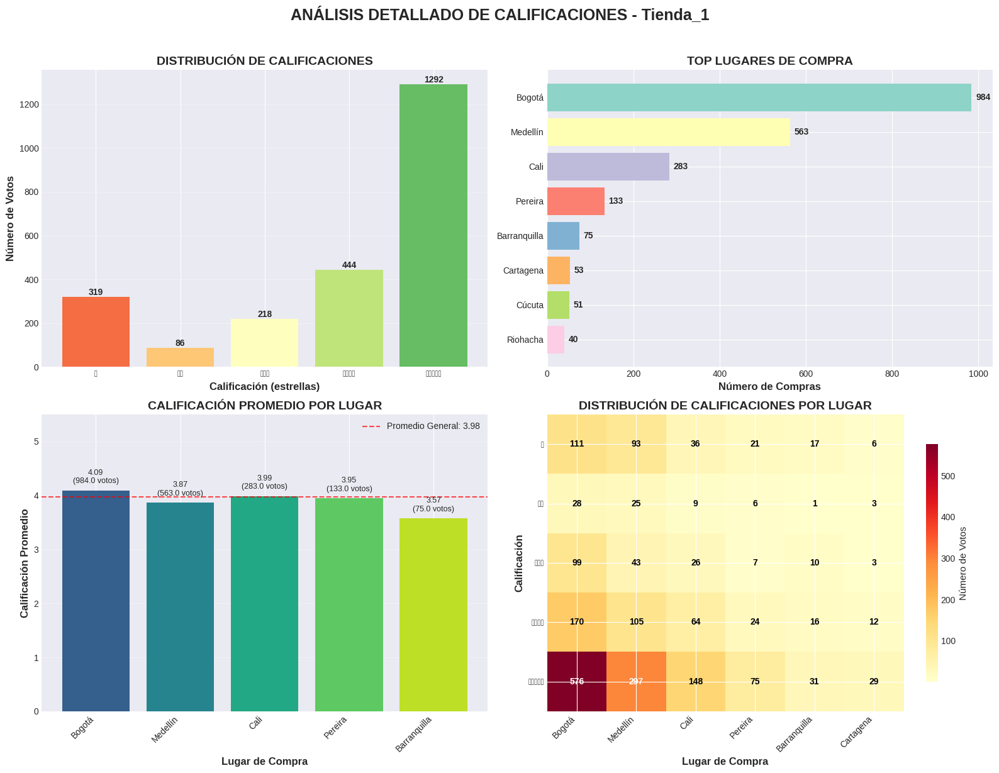


 RESUMEN ESTADÍSTICO - Tienda_1:
----------------------------------------
• Calificación promedio: 3.98/5.0
• Mediana de calificaciones: 5.0/5.0
• Moda (calificación más común): 5/5.0
• Desviación estándar: 1.42
• Rango de calificaciones: 1 - 5
• Total de votos: 2359
• Calificaciones positivas (4-5★): 73.6%

 EVALUACIÓN DEL DESEMPEÑO:
    REGULAR - Hay margen de mejora


 ANÁLISIS DETALLADO: Tienda_2

 CALIFICACIÓN PROMEDIO: 4.04/5.0

 DISTRIBUCIÓN DE CALIFICACIONES:
  • 1 estrella(s): 273 votos (11.6%)
  • 2 estrella(s): 93 votos (3.9%)
  • 3 estrella(s): 209 votos (8.9%)
  • 4 estrella(s): 482 votos (20.4%)
  • 5 estrella(s): 1302 votos (55.2%)

 LUGARES DE COMPRA MÁS FRECUENTES:
  • Bogotá: 985 compras (41.8%)
  • Medellín: 594 compras (25.2%)
  • Cali: 222 compras (9.4%)
  • Pereira: 128 compras (5.4%)
  • Barranquilla: 78 compras (3.3%)

 CALIFICACIÓN PROMEDIO POR LUGAR DE COMPRA (Top 5):
  • Bogotá: 4.14/5.0 (985.0 votos)
  • Medellín: 3.92/5.0 (594.0 votos)
  • Cali: 4.25/5.0 (

/tmp/ipython-input-1664506372.py:163: UserWarning: Glyph 9733 (\N{BLACK STAR}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9733 (\N{BLACK STAR}) missing from font(s) Liberation Sans.
  fig.canvas.print_figure(bytes_io, **kw)


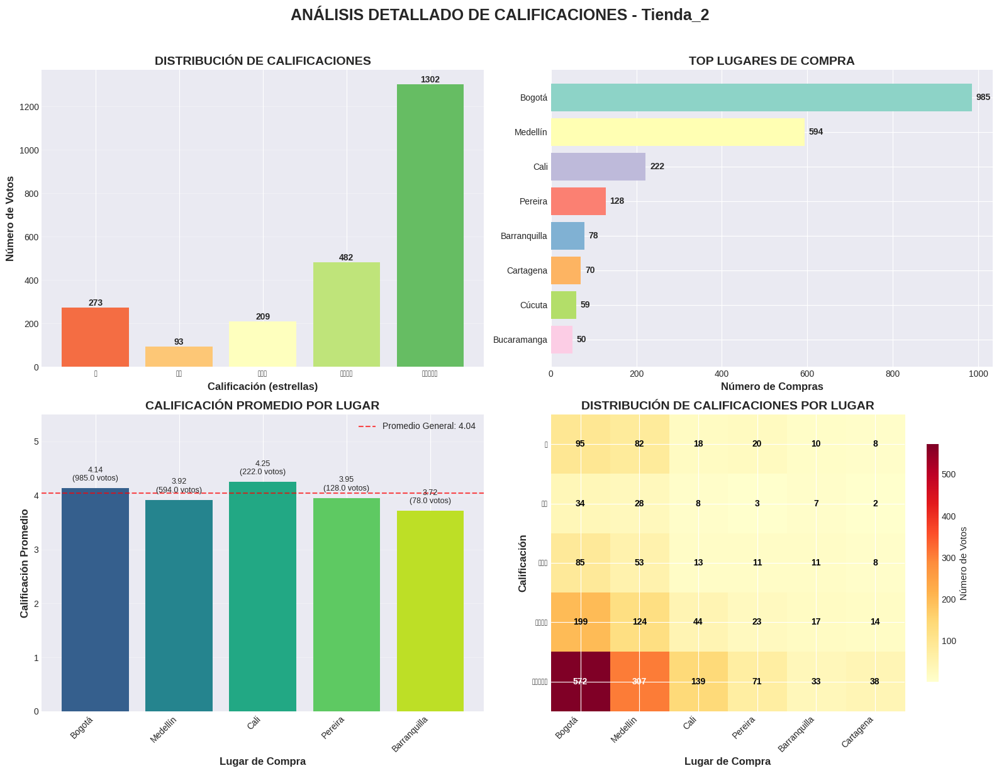


 RESUMEN ESTADÍSTICO - Tienda_2:
----------------------------------------
• Calificación promedio: 4.04/5.0
• Mediana de calificaciones: 5.0/5.0
• Moda (calificación más común): 5/5.0
• Desviación estándar: 1.36
• Rango de calificaciones: 1 - 5
• Total de votos: 2359
• Calificaciones positivas (4-5★): 75.6%

 EVALUACIÓN DEL DESEMPEÑO:
   MUY BUENO - Calificación superior al 80%


 ANÁLISIS DETALLADO: Tienda_3

 CALIFICACIÓN PROMEDIO: 4.05/5.0

 DISTRIBUCIÓN DE CALIFICACIONES:
  • 1 estrella(s): 297 votos (12.6%)
  • 2 estrella(s): 79 votos (3.3%)
  • 3 estrella(s): 193 votos (8.2%)
  • 4 estrella(s): 434 votos (18.4%)
  • 5 estrella(s): 1356 votos (57.5%)

 LUGARES DE COMPRA MÁS FRECUENTES:
  • Bogotá: 983 compras (41.7%)
  • Medellín: 580 compras (24.6%)
  • Cali: 248 compras (10.5%)
  • Pereira: 134 compras (5.7%)
  • Barranquilla: 77 compras (3.3%)

 CALIFICACIÓN PROMEDIO POR LUGAR DE COMPRA (Top 5):
  • Bogotá: 4.16/5.0 (983.0 votos)
  • Medellín: 4.00/5.0 (580.0 votos)
  • Cali: 

/tmp/ipython-input-1664506372.py:163: UserWarning: Glyph 9733 (\N{BLACK STAR}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9733 (\N{BLACK STAR}) missing from font(s) Liberation Sans.
  fig.canvas.print_figure(bytes_io, **kw)


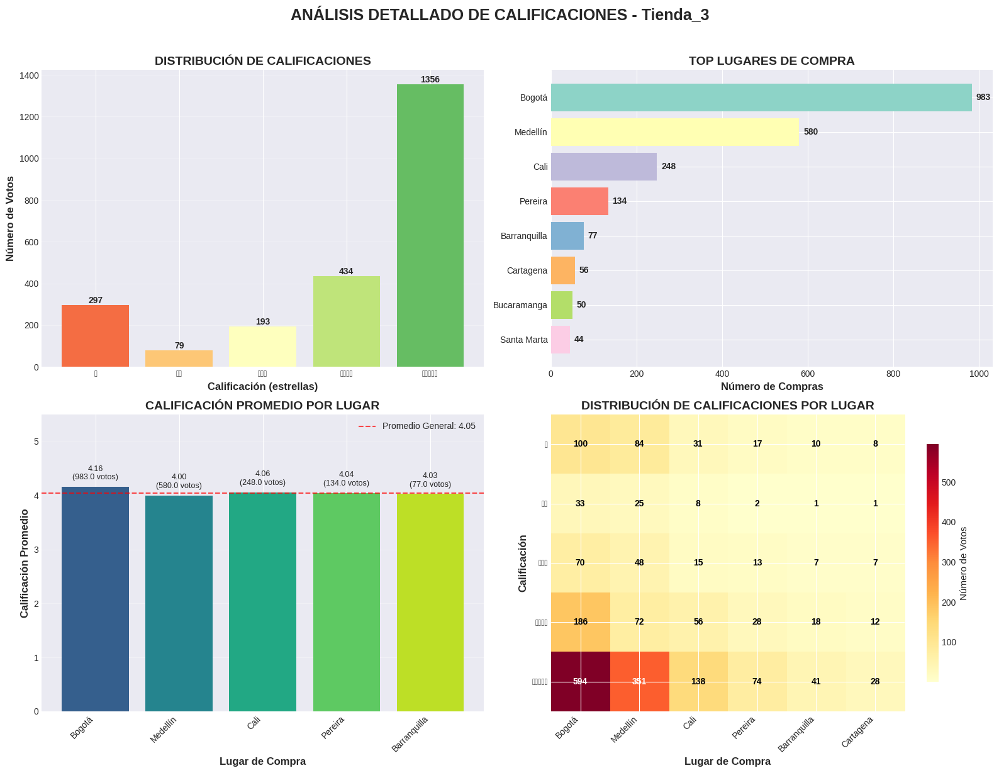


 RESUMEN ESTADÍSTICO - Tienda_3:
----------------------------------------
• Calificación promedio: 4.05/5.0
• Mediana de calificaciones: 5.0/5.0
• Moda (calificación más común): 5/5.0
• Desviación estándar: 1.39
• Rango de calificaciones: 1 - 5
• Total de votos: 2359
• Calificaciones positivas (4-5★): 75.9%

 EVALUACIÓN DEL DESEMPEÑO:
   MUY BUENO - Calificación superior al 80%


 ANÁLISIS DETALLADO: Tienda_4

 CALIFICACIÓN PROMEDIO: 4.00/5.0

 DISTRIBUCIÓN DE CALIFICACIONES:
  • 1 estrella(s): 310 votos (13.1%)
  • 2 estrella(s): 85 votos (3.6%)
  • 3 estrella(s): 210 votos (8.9%)
  • 4 estrella(s): 453 votos (19.2%)
  • 5 estrella(s): 1300 votos (55.1%)

 LUGARES DE COMPRA MÁS FRECUENTES:
  • Bogotá: 991 compras (42.0%)
  • Medellín: 577 compras (24.5%)
  • Cali: 254 compras (10.8%)
  • Pereira: 122 compras (5.2%)
  • Barranquilla: 80 compras (3.4%)

 CALIFICACIÓN PROMEDIO POR LUGAR DE COMPRA (Top 5):
  • Bogotá: 4.07/5.0 (991.0 votos)
  • Medellín: 3.92/5.0 (577.0 votos)
  • Cali: 

/tmp/ipython-input-1664506372.py:163: UserWarning: Glyph 9733 (\N{BLACK STAR}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9733 (\N{BLACK STAR}) missing from font(s) Liberation Sans.
  fig.canvas.print_figure(bytes_io, **kw)


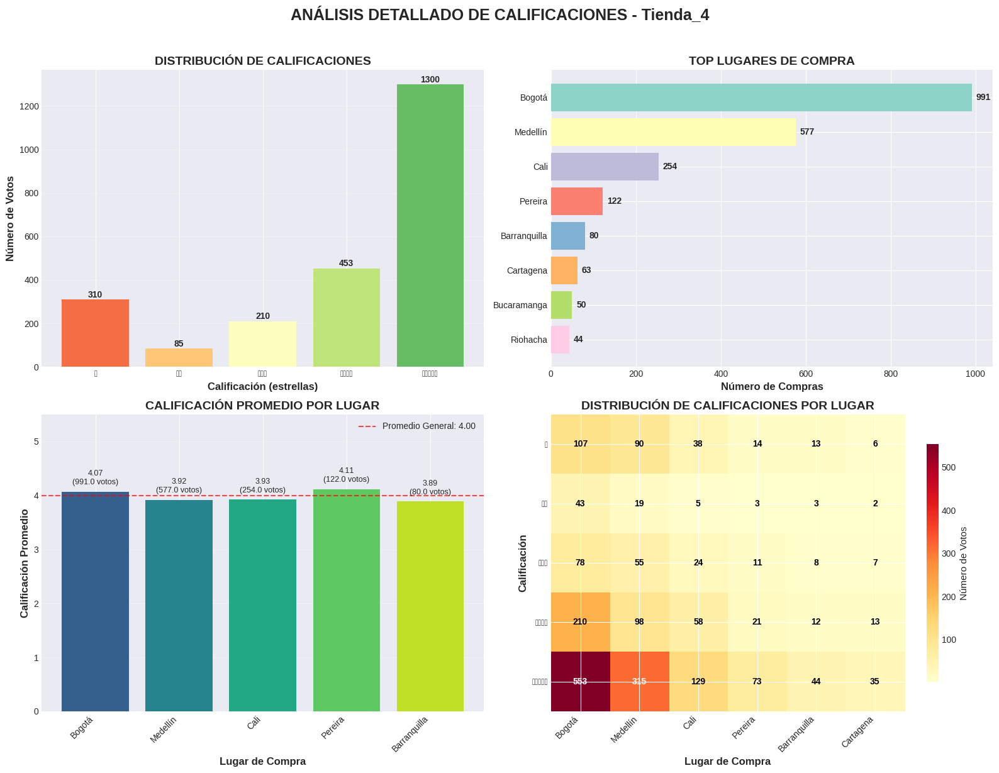


 RESUMEN ESTADÍSTICO - Tienda_4:
----------------------------------------
• Calificación promedio: 4.00/5.0
• Mediana de calificaciones: 5.0/5.0
• Moda (calificación más común): 5/5.0
• Desviación estándar: 1.40
• Rango de calificaciones: 1 - 5
• Total de votos: 2358
• Calificaciones positivas (4-5★): 74.3%

 EVALUACIÓN DEL DESEMPEÑO:
    REGULAR - Hay margen de mejora


 ANÁLISIS COMPARATIVO DE CALIFICACIONES ENTRE TIENDAS

 COMPARATIVA DE CALIFICACIONES:
------------------------------------------------------------
          Calificacion_Promedio  Calificacion_Mediana  Desviacion_Estandar  Total_Votos  Lugares_Unicos
Tienda                                                                                                 
Tienda_3                   4.05                   5.0                 1.39         2359              19
Tienda_2                   4.04                   5.0                 1.36         2359              19
Tienda_4                   4.00                   5.0        

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Primero, cargar los datos de las tiendas
url = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_1%20.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_4.csv"

tienda = pd.read_csv(url)
tienda2 = pd.read_csv(url2)
tienda3 = pd.read_csv(url3)
tienda4 = pd.read_csv(url4)

# Ahora crear DataFrame consolidado
todas_tiendas = pd.concat([
    tienda.assign(Tienda='Tienda_1'),
    tienda2.assign(Tienda='Tienda_2'),
    tienda3.assign(Tienda='Tienda_3'),
    tienda4.assign(Tienda='Tienda_4')
], ignore_index=True)

# Análisis por tienda
for tienda_nombre in ['Tienda_1', 'Tienda_2', 'Tienda_3', 'Tienda_4']:
    print(f"\n{'='*80}")
    print(f" ANÁLISIS DETALLADO: {tienda_nombre}")
    print(f"{'='*80}")

    # Filtrar datos de la tienda actual
    datos_tienda = todas_tiendas[todas_tiendas['Tienda'] == tienda_nombre].copy()

    # 1. Calificación promedio por tienda
    calificacion_promedio = datos_tienda['Calificación'].mean()
    print(f"\n CALIFICACIÓN PROMEDIO: {calificacion_promedio:.2f}/5.0")

    # 2. Distribución de calificaciones
    distribucion_calif = datos_tienda['Calificación'].value_counts().sort_index()
    print("\n DISTRIBUCIÓN DE CALIFICACIONES:")
    for calif in range(1, 6):
        cantidad = distribucion_calif.get(calif, 0)
        porcentaje = (cantidad / len(datos_tienda)) * 100
        print(f"  • {calif} estrella(s): {cantidad} votos ({porcentaje:.1f}%)")

    # 3. Lugares de compra más frecuentes
    print(f"\n LUGARES DE COMPRA MÁS FRECUENTES:")
    lugares_frecuentes = datos_tienda['Lugar de Compra'].value_counts().head(5)
    for lugar, cantidad in lugares_frecuentes.items():
        porcentaje = (cantidad / len(datos_tienda)) * 100
        print(f"  • {lugar}: {cantidad} compras ({porcentaje:.1f}%)")

    # 4. Calificación promedio por lugar de compra (top 5 lugares)
    print(f"\n CALIFICACIÓN PROMEDIO POR LUGAR DE COMPRA (Top 5):")
    calif_por_lugar = datos_tienda.groupby('Lugar de Compra')['Calificación'].agg(['mean', 'count'])
    calif_por_lugar = calif_por_lugar.sort_values('count', ascending=False).head(5)

    for lugar, datos in calif_por_lugar.iterrows():
        print(f"  • {lugar}: {datos['mean']:.2f}/5.0 ({datos['count']} votos)")

    # CREAR GRÁFICOS DETALLADOS

    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    fig.suptitle(f'ANÁLISIS DETALLADO DE CALIFICACIONES - {tienda_nombre}',
                 fontsize=18, fontweight='bold', y=1.02)

    # Gráfico 1: Distribución de calificaciones ####### barras
    ax1 = axes[0, 0]
    bars1 = ax1.bar(distribucion_calif.index, distribucion_calif.values,
                   color=plt.cm.RdYlGn(np.linspace(0.2, 0.8, 5)))
    ax1.set_xlabel('Calificación (estrellas)', fontsize=12, fontweight='bold')
    ax1.set_ylabel('Número de Votos', fontsize=12, fontweight='bold')
    ax1.set_title('DISTRIBUCIÓN DE CALIFICACIONES', fontsize=14, fontweight='bold')
    ax1.set_xticks(range(1, 6))
    ax1.set_xticklabels(['★' * i for i in range(1, 6)])
    ax1.grid(True, alpha=0.3, axis='y')

    # Añadir valores en las barras
    for bar in bars1:
        height = bar.get_height()
        ax1.text(bar.get_x() + bar.get_width()/2., height + 0.5,
                f'{int(height)}', ha='center', va='bottom', fontweight='bold')

    # Gráfico 2: Lugares de compra más frecuentes
    ax2 = axes[0, 1]
    lugares_top = datos_tienda['Lugar de Compra'].value_counts().head(8)
    colors2 = plt.cm.Set3(np.arange(len(lugares_top)))
    bars2 = ax2.barh(range(len(lugares_top)), lugares_top.values, color=colors2)
    ax2.set_yticks(range(len(lugares_top)))
    ax2.set_yticklabels(lugares_top.index)
    ax2.set_xlabel('Número de Compras', fontsize=12, fontweight='bold')
    ax2.set_title('TOP LUGARES DE COMPRA', fontsize=14, fontweight='bold')
    ax2.invert_yaxis()

    # Añadir valores en las barras
    for i, v in enumerate(lugares_top.values):
        ax2.text(v + max(lugares_top.values)*0.01, i, str(v),
                va='center', fontweight='bold')

    # Gráfico 3: Calificación promedio por lugar de compra (top 10)
    ax3 = axes[1, 0]
    top_lugares_calif = calif_por_lugar.head(10)
    x_pos = np.arange(len(top_lugares_calif))
    colors3 = plt.cm.viridis(np.linspace(0.3, 0.9, len(top_lugares_calif)))

    bars3 = ax3.bar(x_pos, top_lugares_calif['mean'], color=colors3)
    ax3.set_xlabel('Lugar de Compra', fontsize=12, fontweight='bold')
    ax3.set_ylabel('Calificación Promedio', fontsize=12, fontweight='bold')
    ax3.set_title('CALIFICACIÓN PROMEDIO POR LUGAR', fontsize=14, fontweight='bold')
    ax3.set_xticks(x_pos)
    ax3.set_xticklabels(top_lugares_calif.index, rotation=45, ha='right')
    ax3.set_ylim(0, 5.5)
    ax3.axhline(y=calificacion_promedio, color='red', linestyle='--',
                alpha=0.7, label=f'Promedio General: {calificacion_promedio:.2f}')
    ax3.legend()
    ax3.grid(True, alpha=0.3, axis='y')

    # Añadir valores en las barras
    for i, bar in enumerate(bars3):
        height = bar.get_height()
        votos = top_lugares_calif.iloc[i]['count']
        ax3.text(bar.get_x() + bar.get_width()/2., height + 0.1,
                f'{height:.2f}\n({votos} votos)',
                ha='center', va='bottom', fontsize=9)

    # Gráfico 4: Heatmap de calificaciones por lugar (top 6 lugares)
    ax4 = axes[1, 1]
    top_6_lugares = datos_tienda['Lugar de Compra'].value_counts().head(6).index
    datos_top = datos_tienda[datos_tienda['Lugar de Compra'].isin(top_6_lugares)]

    # Crear matriz para heatmap
    heatmap_data = []
    for lugar in top_6_lugares:
        datos_lugar = datos_top[datos_top['Lugar de Compra'] == lugar]
        distrib = datos_lugar['Calificación'].value_counts().reindex(range(1, 6), fill_value=0)
        heatmap_data.append(distrib.values)

    heatmap_data = np.array(heatmap_data)

    # Crear heatmap
    im = ax4.imshow(heatmap_data.T, cmap='YlOrRd', aspect='auto', interpolation='nearest')
    ax4.set_xlabel('Lugar de Compra', fontsize=12, fontweight='bold')
    ax4.set_ylabel('Calificación', fontsize=12, fontweight='bold')
    ax4.set_title('DISTRIBUCIÓN DE CALIFICACIONES POR LUGAR', fontsize=14, fontweight='bold')
    ax4.set_xticks(range(len(top_6_lugares)))
    ax4.set_xticklabels(top_6_lugares, rotation=45, ha='right')
    ax4.set_yticks(range(5))
    ax4.set_yticklabels(['★' * (i+1) for i in range(5)])

    # Añadir barra de color
    cbar = plt.colorbar(im, ax=ax4, shrink=0.8)
    cbar.set_label('Número de Votos', fontsize=11)

    # Añadir valores en las celdas
    for i in range(len(top_6_lugares)):
        for j in range(5):
            valor = heatmap_data[i, j]
            if valor > 0:
                color = 'white' if valor > heatmap_data.max()/2 else 'black'
                ax4.text(i, j, str(int(valor)), ha='center', va='center',
                        color=color, fontweight='bold', fontsize=10)

    plt.tight_layout()
    plt.show()


    # RESUMEN ESTADÍSTICO

    print(f"\n RESUMEN ESTADÍSTICO - {tienda_nombre}:")
    print("-" * 40)

    # Calcular estadísticas adicionales
    mediana_calif = datos_tienda['Calificación'].median()
    moda_calif = datos_tienda['Calificación'].mode()[0]
    desviacion_calif = datos_tienda['Calificación'].std()

    print(f"• Calificación promedio: {calificacion_promedio:.2f}/5.0")
    print(f"• Mediana de calificaciones: {mediana_calif:.1f}/5.0")
    print(f"• Moda (calificación más común): {moda_calif}/5.0")
    print(f"• Desviación estándar: {desviacion_calif:.2f}")
    print(f"• Rango de calificaciones: {datos_tienda['Calificación'].min()} - {datos_tienda['Calificación'].max()}")
    print(f"• Total de votos: {len(datos_tienda)}")

    # Calcular porcentaje de calificaciones positivas (4-5 estrellas)
    calif_positivas = ((datos_tienda['Calificación'] >= 4).sum() / len(datos_tienda)) * 100
    print(f"• Calificaciones positivas (4-5★): {calif_positivas:.1f}%")

    # Calificar el desempeño
    print(f"\n EVALUACIÓN DEL DESEMPEÑO:")
    if calificacion_promedio >= 4.5:
        print(f"   EXCELENTE - Calificación superior al 90%")
    elif calificacion_promedio >= 4.0:
        print(f"   MUY BUENO - Calificación superior al 80%")
    elif calificacion_promedio >= 3.5:
        print(f"    REGULAR - Hay margen de mejora")
    else:
        print(f"   MEJORA NECESARIA - Se requieren acciones inmediatas")

    print(f"\n{'='*80}")


# ANÁLISIS COMPARATIVO ENTRE TIENDAS

print("\n" + "="*80)
print(" ANÁLISIS COMPARATIVO DE CALIFICACIONES ENTRE TIENDAS")
print("="*80)

# Calcular métricas comparativas
comparativa_calif = todas_tiendas.groupby('Tienda').agg({
    'Calificación': ['mean', 'median', 'std', 'count'],
    'Lugar de Compra': 'nunique'
}).round(2)

comparativa_calif.columns = ['_'.join(col).strip() for col in comparativa_calif.columns.values]
comparativa_calif = comparativa_calif.rename(columns={
    'Calificación_mean': 'Calificacion_Promedio',
    'Calificación_median': 'Calificacion_Mediana',
    'Calificación_std': 'Desviacion_Estandar',
    'Calificación_count': 'Total_Votos',
    'Lugar de Compra_nunique': 'Lugares_Unicos'
})

# Ordenar por calificación promedio
comparativa_calif = comparativa_calif.sort_values('Calificacion_Promedio', ascending=False)

print("\n COMPARATIVA DE CALIFICACIONES:")
print("-" * 60)
print(comparativa_calif.to_string())

# Análisis de resultados
print(f"\n RANKING DE CALIFICACIONES:")
print("-" * 30)
for i, (tienda, datos) in enumerate(comparativa_calif.iterrows(), 1):
    print(f"{i}. {tienda}: {datos['Calificacion_Promedio']:.2f}/5.0 "
          f"(±{datos['Desviacion_Estandar']:.2f} - {datos['Total_Votos']} votos)")

print(f"\n INSIGHTS ESTRATÉGICOS:")
print("-" * 30)
mejor_tienda = comparativa_calif.iloc[0]
peor_tienda = comparativa_calif.iloc[-1]

print(f"1. MEJOR DESEMPEÑO: {mejor_tienda.name} ({mejor_tienda['Calificacion_Promedio']:.2f}/5.0)")
print(f"2. MAYOR OPORTUNIDAD: {peor_tienda.name} ({peor_tienda['Calificacion_Promedio']:.2f}/5.0)")
print(f"3. MÁS CONSISTENTE: {comparativa_calif['Desviacion_Estandar'].idxmin()} "
      f"(desviación: {comparativa_calif['Desviacion_Estandar'].min():.2f})")
print(f"4. MÁS VARIEDAD GEOGRÁFICA: {comparativa_calif['Lugares_Unicos'].idxmax()} "
      f"({comparativa_calif['Lugares_Unicos'].max()} lugares únicos)")

print(f"\n{'='*80}")
print(" ANÁLISIS COMPLETADO")
print(f"{'='*80}")

# 4. Productos más y menos vendidos


📊 ANÁLISIS DE PRODUCTOS: Tienda_1

 PRODUCTOS MÁS Y MENOS VENDIDOS - Tienda_1
--------------------------------------------------

 TOP 5 PRODUCTOS MÁS VENDIDOS:
  1. Armario: 60.0 unidades ($29,462,300.00)
  2. TV LED UHD 4K: 60.0 unidades ($142,150,200.00)
  3. Microondas: 60.0 unidades ($34,761,500.00)
  4. Secadora de ropa: 58.0 unidades ($59,062,400.00)
  5. Mesa de noche: 56.0 unidades ($15,679,600.00)

 TOP 5 PRODUCTOS MENOS VENDIDOS:
  1. Mochila: 39.0 unidades ($3,867,200.00)
  2. Pandereta: 36.0 unidades ($2,238,900.00)
  3. Olla de presión: 35.0 unidades ($2,629,300.00)
  4. Celular ABXY: 33.0 unidades ($32,651,000.00)
  5. Auriculares con micrófono: 33.0 unidades ($4,730,800.00)

 ANÁLISIS POR LUGAR DE COMPRA - Tienda_1
--------------------------------------------------

 LUGARES DE COMPRA MÁS FRECUENTES:
  1. Bogotá: 984 compras (41.7%)
  2. Medellín: 563 compras (23.9%)
  3. Cali: 283 compras (12.0%)
  4. Pereira: 133 compras (5.6%)
  5. Barranquilla: 75 compras (3.2%)

 

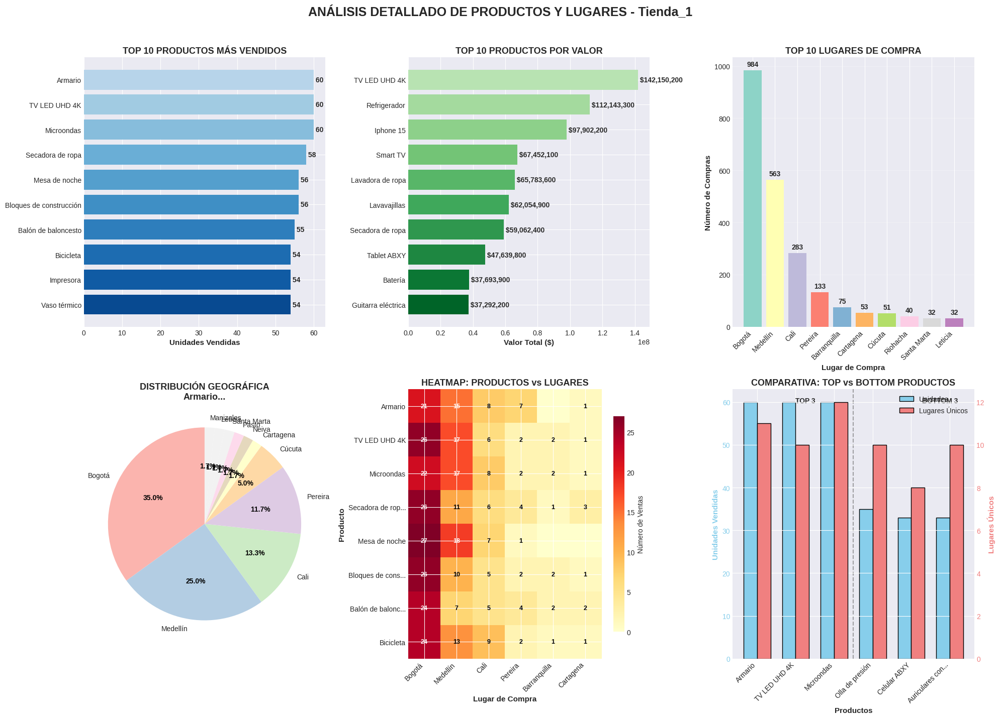


 RECOMENDACIONES ESTRATÉGICAS - Tienda_1:
----------------------------------------
1. ENFOQUE EN ÉXITO: Incrementar stock de 'Armario...'
2. REVISIÓN DE DESEMPEÑO: Analizar por qué 'Mochila...' tiene bajo rendimiento
3. EXPANSIÓN GEOGRÁFICA: Fortalecer presencia en 'Bogotá'
4. OPTIMIZACIÓN: 'TV LED UHD 4K...' tiene la mejor relación valor/unidad
5. OPORTUNIDAD: 'Mesa de noche...' tiene buen volumen pero poca distribución geográfica


📊 ANÁLISIS DE PRODUCTOS: Tienda_2

 PRODUCTOS MÁS Y MENOS VENDIDOS - Tienda_2
--------------------------------------------------

 TOP 5 PRODUCTOS MÁS VENDIDOS:
  1. Iniciando en programación: 65.0 unidades ($3,127,800.00)
  2. Microondas: 62.0 unidades ($36,192,000.00)
  3. Batería: 61.0 unidades ($46,175,300.00)
  4. Pandereta: 58.0 unidades ($3,725,100.00)
  5. Guitarra acústica: 58.0 unidades ($18,648,400.00)

 TOP 5 PRODUCTOS MENOS VENDIDOS:
  1. Auriculares: 37.0 unidades ($3,569,600.00)
  2. Sillón: 35.0 unidades ($8,413,500.00)
  3. Impresora: 34.

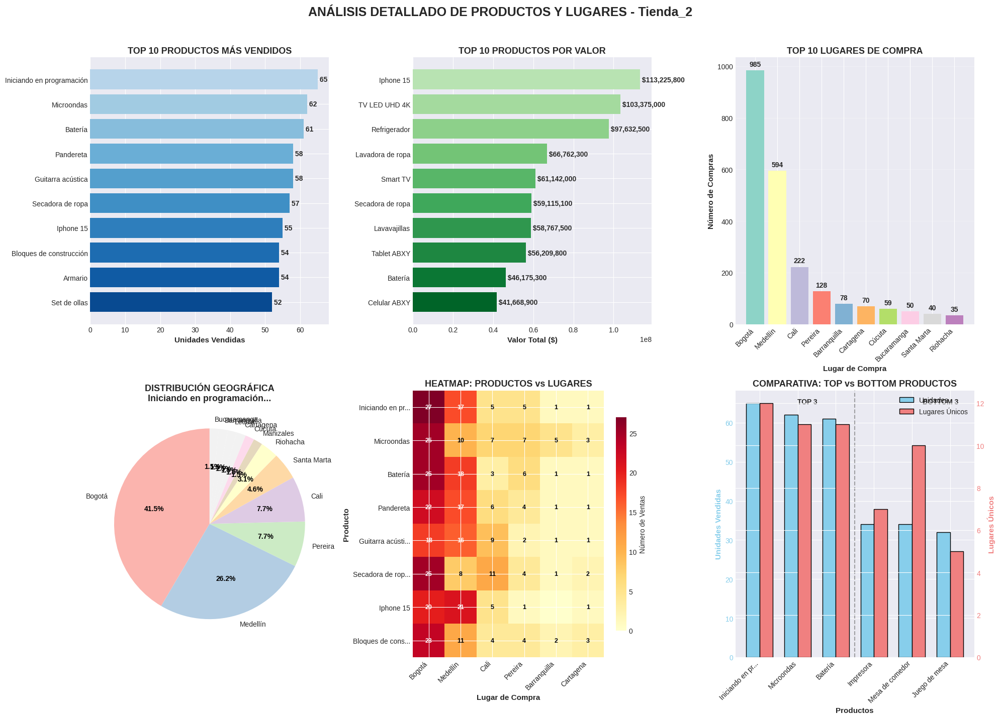


 RECOMENDACIONES ESTRATÉGICAS - Tienda_2:
----------------------------------------
1. ENFOQUE EN ÉXITO: Incrementar stock de 'Iniciando en programación...'
2. REVISIÓN DE DESEMPEÑO: Analizar por qué 'Auriculares...' tiene bajo rendimiento
3. EXPANSIÓN GEOGRÁFICA: Fortalecer presencia en 'Bogotá'
4. OPTIMIZACIÓN: 'TV LED UHD 4K...' tiene la mejor relación valor/unidad
5. OPORTUNIDAD: 'Armario...' tiene buen volumen pero poca distribución geográfica


📊 ANÁLISIS DE PRODUCTOS: Tienda_3

 PRODUCTOS MÁS Y MENOS VENDIDOS - Tienda_3
--------------------------------------------------

 TOP 5 PRODUCTOS MÁS VENDIDOS:
  1. Kit de bancas: 57.0 unidades ($16,699,800.00)
  2. Mesa de comedor: 56.0 unidades ($14,326,100.00)
  3. Cama king: 56.0 unidades ($38,834,700.00)
  4. Set de ollas: 55.0 unidades ($8,696,500.00)
  5. Mesa de noche: 55.0 unidades ($15,365,500.00)

 TOP 5 PRODUCTOS MENOS VENDIDOS:
  1. Guitarra eléctrica: 38.0 unidades ($29,848,000.00)
  2. Mochila: 36.0 unidades ($3,547,000.00)

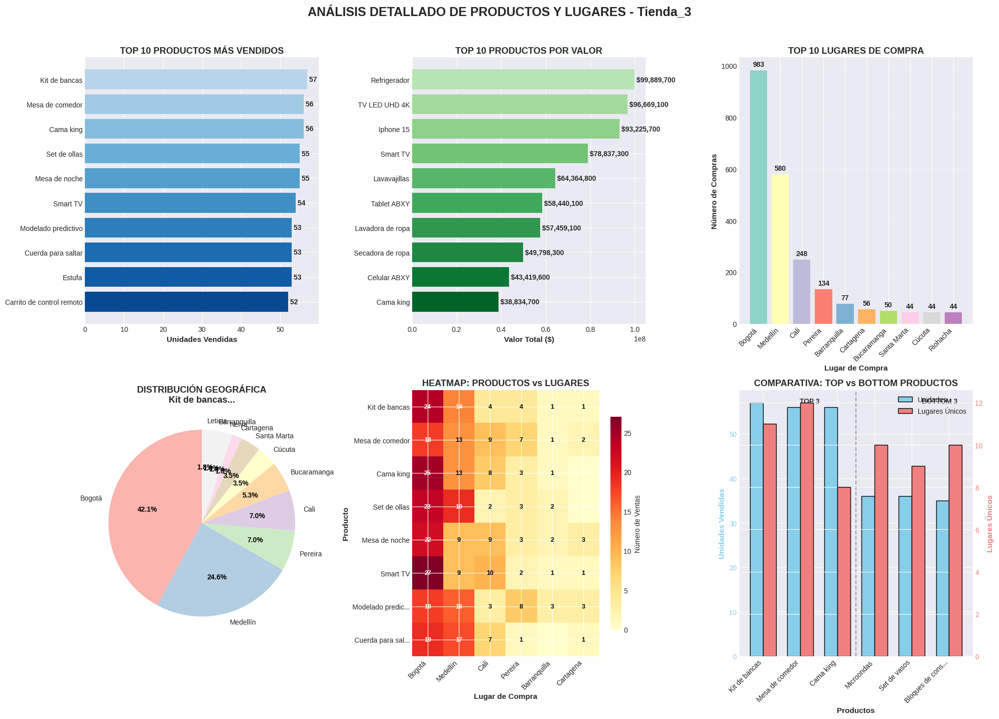


 RECOMENDACIONES ESTRATÉGICAS - Tienda_3:
----------------------------------------
1. ENFOQUE EN ÉXITO: Incrementar stock de 'Kit de bancas...'
2. REVISIÓN DE DESEMPEÑO: Analizar por qué 'Guitarra eléctrica...' tiene bajo rendimiento
3. EXPANSIÓN GEOGRÁFICA: Fortalecer presencia en 'Bogotá'
4. OPTIMIZACIÓN: 'TV LED UHD 4K...' tiene la mejor relación valor/unidad
5. OPORTUNIDAD: 'Cama king...' tiene buen volumen pero poca distribución geográfica


📊 ANÁLISIS DE PRODUCTOS: Tienda_4

 PRODUCTOS MÁS Y MENOS VENDIDOS - Tienda_4
--------------------------------------------------

 TOP 5 PRODUCTOS MÁS VENDIDOS:
  1. Cama box: 62.0 unidades ($32,946,300.00)
  2. Cubertería: 59.0 unidades ($2,649,300.00)
  3. Cama king: 56.0 unidades ($37,555,400.00)
  4. Dashboards con Power BI: 56.0 unidades ($1,990,600.00)
  5. Carrito de control remoto: 55.0 unidades ($4,014,200.00)

 TOP 5 PRODUCTOS MENOS VENDIDOS:
  1. Ciencia de datos con Python: 38.0 unidades ($2,108,800.00)
  2. Refrigerador: 38.0 uni

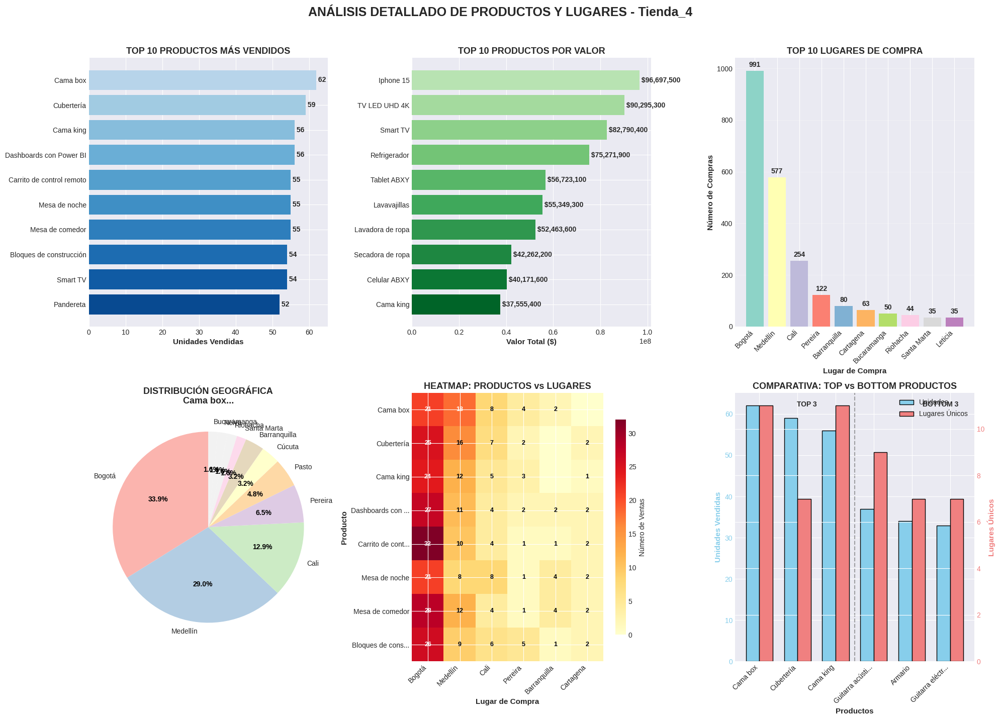


 RECOMENDACIONES ESTRATÉGICAS - Tienda_4:
----------------------------------------
1. ENFOQUE EN ÉXITO: Incrementar stock de 'Cama box...'
2. REVISIÓN DE DESEMPEÑO: Analizar por qué 'Ciencia de datos con Python...' tiene bajo rendimiento
3. EXPANSIÓN GEOGRÁFICA: Fortalecer presencia en 'Bogotá'
4. OPTIMIZACIÓN: 'TV LED UHD 4K...' tiene la mejor relación valor/unidad
5. OPORTUNIDAD: 'Cubertería...' tiene buen volumen pero poca distribución geográfica


 ANÁLISIS COMPARATIVO ENTRE TIENDAS

 COMPARATIVA GENERAL:
----------------------------------------
          Productos_Unicos  Lugares_Unicos  Total_Transacciones
Tienda                                                         
Tienda_1                51              19                 2359
Tienda_2                51              19                 2359
Tienda_3                51              19                 2359
Tienda_4                51              19                 2358

 PRODUCTOS MÁS VENDIDOS POR TIENDA:
----------------------

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Cargar datos
url = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_1%20.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_4.csv"

tienda = pd.read_csv(url)
tienda2 = pd.read_csv(url2)
tienda3 = pd.read_csv(url3)
tienda4 = pd.read_csv(url4)

# Crear DataFrame consolidado
todas_tiendas = pd.concat([
    tienda.assign(Tienda='Tienda_1'),
    tienda2.assign(Tienda='Tienda_2'),
    tienda3.assign(Tienda='Tienda_3'),
    tienda4.assign(Tienda='Tienda_4')
], ignore_index=True)

# Análisis por tienda
for tienda_nombre in ['Tienda_1', 'Tienda_2', 'Tienda_3', 'Tienda_4']:
    print(f"\n{'='*80}")
    print(f"ANÁLISIS DE PRODUCTOS: {tienda_nombre}")
    print(f"{'='*80}")

    # Filtrar datos de la tienda actual
    datos_tienda = todas_tiendas[todas_tiendas['Tienda'] == tienda_nombre].copy()


    # 1. PRODUCTOS MÁS Y MENOS VENDIDOS

    print(f"\n PRODUCTOS MÁS Y MENOS VENDIDOS - {tienda_nombre}")
    print("-" * 50)

    # Calcular ventas por producto
    ventas_producto = datos_tienda.groupby('Producto').agg(
        Unidades_Vendidas=('Producto', 'count'),
        Valor_Total=('Precio', 'sum'),
        Precio_Promedio=('Precio', 'mean'),
        Lugares_Unicos=('Lugar de Compra', 'nunique')
    ).round(2).sort_values('Unidades_Vendidas', ascending=False)

    # Top 5 productos más vendidos
    top5_mas_vendidos = ventas_producto.head(5)
    print("\n TOP 5 PRODUCTOS MÁS VENDIDOS:")
    for i, (producto, datos) in enumerate(top5_mas_vendidos.iterrows(), 1):
        print(f"  {i}. {producto}: {datos['Unidades_Vendidas']} unidades (${datos['Valor_Total']:,.2f})")

    # Top 5 productos menos vendidos (excluyendo productos con 1 venta si hay muchos)
    productos_varios_ventas = ventas_producto[ventas_producto['Unidades_Vendidas'] > 1]
    if len(productos_varios_ventas) >= 5:
        top5_menos_vendidos = productos_varios_ventas.tail(5)
    else:
        top5_menos_vendidos = ventas_producto.tail(5)

    print("\n TOP 5 PRODUCTOS MENOS VENDIDOS:")
    for i, (producto, datos) in enumerate(top5_menos_vendidos.iterrows(), 1):
        print(f"  {i}. {producto}: {datos['Unidades_Vendidas']} unidades (${datos['Valor_Total']:,.2f})")


    # 2. ANÁLISIS POR LUGAR DE COMPRA

    print(f"\n ANÁLISIS POR LUGAR DE COMPRA - {tienda_nombre}")
    print("-" * 50)

    # Lugares de compra más frecuentes
    lugares_frecuentes = datos_tienda['Lugar de Compra'].value_counts()
    print(f"\n LUGARES DE COMPRA MÁS FRECUENTES:")
    for i, (lugar, cantidad) in enumerate(lugares_frecuentes.head(5).items(), 1):
        porcentaje = (cantidad / len(datos_tienda)) * 100
        print(f"  {i}. {lugar}: {cantidad} compras ({porcentaje:.1f}%)")

    # Lugar de compra por producto más vendido
    producto_mas_vendido = top5_mas_vendidos.index[0]
    datos_producto_top = datos_tienda[datos_tienda['Producto'] == producto_mas_vendido]

    print(f"\n DISTRIBUCIÓN GEOGRÁFICA DEL PRODUCTO MÁS VENDIDO ({producto_mas_vendido}):")
    distribucion_lugares = datos_producto_top['Lugar de Compra'].value_counts()
    for lugar, cantidad in distribucion_lugares.head(5).items():
        porcentaje = (cantidad / datos_producto_top.shape[0]) * 100
        print(f"  • {lugar}: {cantidad} compras ({porcentaje:.1f}%)")


    # 3. RESUMEN ESTADÍSTICO

    print(f"\n RESUMEN ESTADÍSTICO - {tienda_nombre}:")
    print("-" * 40)

    total_productos = ventas_producto.shape[0]
    promedio_ventas_producto = ventas_producto['Unidades_Vendidas'].mean()
    producto_top_unidades = ventas_producto['Unidades_Vendidas'].max()
    producto_top_valor = ventas_producto['Valor_Total'].max()

    print(f"• Total de productos únicos: {total_productos}")
    print(f"• Promedio de ventas por producto: {promedio_ventas_producto:.1f} unidades")
    print(f"• Producto con más unidades vendidas: {ventas_producto['Unidades_Vendidas'].idxmax()}")
    print(f"• Producto con mayor valor total: {ventas_producto['Valor_Total'].idxmax()}")
    print(f"• Lugares de compra únicos: {datos_tienda['Lugar de Compra'].nunique()}")


    # 4. GRÁFICOS DETALLADOS

    print(f"\n GENERANDO GRÁFICOS DETALLADOS PARA {tienda_nombre}...")

    fig, axes = plt.subplots(2, 3, figsize=(20, 14))
    fig.suptitle(f'ANÁLISIS DETALLADO DE PRODUCTOS Y LUGARES - {tienda_nombre}',
                 fontsize=18, fontweight='bold', y=1.02)

    # Gráfico 1: Top 10 productos más vendidos por unidades
    ax1 = axes[0, 0]
    top10_productos = ventas_producto.head(10)
    bars1 = ax1.barh(range(len(top10_productos)), top10_productos['Unidades_Vendidas'],
                    color=plt.cm.Blues(np.linspace(0.3, 0.9, len(top10_productos))))
    ax1.set_yticks(range(len(top10_productos)))
    ax1.set_yticklabels([p[:25] + '...' if len(p) > 25 else p for p in top10_productos.index])
    ax1.set_xlabel('Unidades Vendidas', fontsize=11, fontweight='bold')
    ax1.set_title('TOP 10 PRODUCTOS MÁS VENDIDOS', fontsize=13, fontweight='bold')
    ax1.invert_yaxis()

    # Añadir valores en c/d una de las barras
    for i, v in enumerate(top10_productos['Unidades_Vendidas']):
        ax1.text(v, i, f' {int(v)}', va='center', fontweight='bold')

    # Gráfico 2: Top 10 productos por valor total
    ax2 = axes[0, 1]
    top10_valor = ventas_producto.sort_values('Valor_Total', ascending=False).head(10)
    bars2 = ax2.barh(range(len(top10_valor)), top10_valor['Valor_Total'],
                    color=plt.cm.Greens(np.linspace(0.3, 0.9, len(top10_valor))))
    ax2.set_yticks(range(len(top10_valor)))
    ax2.set_yticklabels([p[:25] + '...' if len(p) > 25 else p for p in top10_valor.index])
    ax2.set_xlabel('Valor Total ($)', fontsize=11, fontweight='bold')
    ax2.set_title('TOP 10 PRODUCTOS POR VALOR', fontsize=13, fontweight='bold')
    ax2.invert_yaxis()

    # Añadir valores en las barras
    for i, v in enumerate(top10_valor['Valor_Total']):
        ax2.text(v, i, f' ${v:,.0f}', va='center', fontweight='bold')

    # Gráfico 3: Lugares de compra más frecuentes
    ax3 = axes[0, 2]
    top_lugares = lugares_frecuentes.head(10)
    colors3 = plt.cm.Set3(np.arange(len(top_lugares)))
    bars3 = ax3.bar(range(len(top_lugares)), top_lugares.values, color=colors3)
    ax3.set_xlabel('Lugar de Compra', fontsize=11, fontweight='bold')
    ax3.set_ylabel('Número de Compras', fontsize=11, fontweight='bold')
    ax3.set_title('TOP 10 LUGARES DE COMPRA', fontsize=13, fontweight='bold')
    ax3.set_xticks(range(len(top_lugares)))
    ax3.set_xticklabels(top_lugares.index, rotation=45, ha='right')
    ax3.grid(True, alpha=0.3, axis='y')

    # Añadir valores en las barras
    for bar in bars3:
        height = bar.get_height()
        ax3.text(bar.get_x() + bar.get_width()/2., height + max(top_lugares.values)*0.01,
                f'{int(height)}', ha='center', va='bottom', fontweight='bold')

    # Gráfico 4: Distribución de productos más vendido por lugar
    ax4 = axes[1, 0]
    if len(distribucion_lugares) > 0:
        wedges, texts, autotexts = ax4.pie(distribucion_lugares.values,
                                          labels=distribucion_lugares.index,
                                          autopct='%1.1f%%',
                                          startangle=90,
                                          colors=plt.cm.Pastel1(np.arange(len(distribucion_lugares))))
        ax4.set_title(f'DISTRIBUCIÓN GEOGRÁFICA\n{producto_mas_vendido[:30]}...',
                     fontsize=13, fontweight='bold')

        # Mejorar legibilidad
        for autotext in autotexts:
            autotext.set_color('black')
            autotext.set_fontweight('bold')
    else:
        ax4.text(0.5, 0.5, 'No hay datos suficientes',
                ha='center', va='center', fontsize=12)
        ax4.set_title('DISTRIBUCIÓN GEOGRÁFICA', fontsize=13, fontweight='bold')

    # Gráfico 5: Heatmap Productos vs Lugares (Top 8 productos)
    ax5 = axes[1, 1]
    top_8_productos = ventas_producto.head(8).index
    top_6_lugares = lugares_frecuentes.head(6).index

    datos_filtrados = datos_tienda[
        datos_tienda['Producto'].isin(top_8_productos) &
        datos_tienda['Lugar de Compra'].isin(top_6_lugares)
    ]

    # Crear matriz para heatmap
    heatmap_matrix = pd.crosstab(
        datos_filtrados['Producto'],
        datos_filtrados['Lugar de Compra']
    ).reindex(top_8_productos).reindex(columns=top_6_lugares).fillna(0)

    # Crear heatmap
    im = ax5.imshow(heatmap_matrix, cmap='YlOrRd', aspect='auto')
    ax5.set_xlabel('Lugar de Compra', fontsize=11, fontweight='bold')
    ax5.set_ylabel('Producto', fontsize=11, fontweight='bold')
    ax5.set_title('HEATMAP: PRODUCTOS vs LUGARES', fontsize=13, fontweight='bold')
    ax5.set_xticks(range(len(top_6_lugares)))
    ax5.set_xticklabels(top_6_lugares, rotation=45, ha='right')
    ax5.set_yticks(range(len(top_8_productos)))
    ax5.set_yticklabels([p[:15] + '...' if len(p) > 15 else p for p in top_8_productos])

    # Añadir barra de color
    cbar = plt.colorbar(im, ax=ax5, shrink=0.8)
    cbar.set_label('Número de Ventas', fontsize=10)

    # Añadir valores en las celdas
    for i in range(len(top_8_productos)):
        for j in range(len(top_6_lugares)):
            valor = heatmap_matrix.iloc[i, j]
            if valor > 0:
                color = 'white' if valor > heatmap_matrix.values.max()/2 else 'black'
                ax5.text(j, i, str(int(valor)), ha='center', va='center',
                        color=color, fontweight='bold', fontsize=9)

    # Gráfico 6: Comparativa productos top vs bottom
    ax6 = axes[1, 2]
    # Seleccionar 3 productos más vendidos y 3 menos vendidos
    productos_comparar = pd.concat([
        ventas_producto.head(3),
        ventas_producto.tail(3)
    ])

    x_pos = np.arange(len(productos_comparar))
    width = 0.35

    # Barras para unidades vendidas
    bars6a = ax6.bar(x_pos - width/2, productos_comparar['Unidades_Vendidas'],
                    width, label='Unidades', color='skyblue', edgecolor='black')

    # Barras para lugares únicos segundo eje Y
    ax6_twin = ax6.twinx()
    bars6b = ax6_twin.bar(x_pos + width/2, productos_comparar['Lugares_Unicos'],
                         width, label='Lugares Únicos', color='lightcoral', edgecolor='black')

    ax6.set_xlabel('Productos', fontsize=11, fontweight='bold')
    ax6.set_ylabel('Unidades Vendidas', fontsize=11, fontweight='bold', color='skyblue')
    ax6.set_xticks(x_pos)
    ax6.set_xticklabels([p[:15] + '...' if len(p) > 15 else p for p in productos_comparar.index],
                       rotation=45, ha='right')
    ax6.tick_params(axis='y', labelcolor='skyblue')
    ax6.set_title('COMPARATIVA: TOP vs BOTTOM PRODUCTOS', fontsize=13, fontweight='bold')

    ax6_twin.set_ylabel('Lugares Únicos', fontsize=11, fontweight='bold', color='lightcoral')
    ax6_twin.tick_params(axis='y', labelcolor='lightcoral')

    # Añadir línea divisoria entre top y bottom
    ax6.axvline(x=2.5, color='gray', linestyle='--', alpha=0.7)
    ax6.text(1.25, ax6.get_ylim()[1]*0.95, 'TOP 3', ha='center', fontweight='bold', fontsize=10)
    ax6.text(4.75, ax6.get_ylim()[1]*0.95, 'BOTTOM 3', ha='center', fontweight='bold', fontsize=10)

    # Combinar leyendas
    lines1, labels1 = ax6.get_legend_handles_labels()
    lines2, labels2 = ax6_twin.get_legend_handles_labels()
    ax6.legend(lines1 + lines2, labels1 + labels2, loc='upper right')

    plt.tight_layout()
    plt.show()


    # 5. RECOMENDACIONES ESTRATÉGICAS

    print(f"\n RECOMENDACIONES ESTRATÉGICAS - {tienda_nombre}:")
    print("-" * 40)

    # Análisis de oportunidades
    producto_mas_vendido_nombre = top5_mas_vendidos.index[0]
    producto_menos_vendido_nombre = top5_menos_vendidos.index[0]
    lugar_mas_frecuente = lugares_frecuentes.index[0]

    print(f"1. ENFOQUE EN ÉXITO: Incrementar stock de '{producto_mas_vendido_nombre[:30]}...'")
    print(f"2. REVISIÓN DE DESEMPEÑO: Analizar por qué '{producto_menos_vendido_nombre[:30]}...' tiene bajo rendimiento")
    print(f"3. EXPANSIÓN GEOGRÁFICA: Fortalecer presencia en '{lugar_mas_frecuente}'")

    # Calcular eficiencia por producto
    ventas_producto['Eficiencia'] = ventas_producto['Valor_Total'] / ventas_producto['Unidades_Vendidas']
    producto_mas_eficiente = ventas_producto['Eficiencia'].idxmax()

    print(f"4. OPTIMIZACIÓN: '{producto_mas_eficiente[:30]}...' tiene la mejor relación valor/unidad")

    # Identificar productos con potencial
    productos_potencial = ventas_producto[
        (ventas_producto['Unidades_Vendidas'] > promedio_ventas_producto) &
        (ventas_producto['Lugares_Unicos'] < datos_tienda['Lugar de Compra'].nunique() * 0.5)
    ]

    if not productos_potencial.empty:
        producto_potencial = productos_potencial.index[0]
        print(f"5. OPORTUNIDAD: '{producto_potencial[:30]}...' tiene buen volumen pero poca distribución geográfica")

    print(f"\n{'='*80}")


# ANÁLISIS COMPARATIVO ENTRE TIENDAS

print("\n" + "="*80)
print(" ANÁLISIS COMPARATIVO ENTRE TIENDAS")
print("="*80)

# Calcular métricas comparativas
comparativa_tiendas = todas_tiendas.groupby('Tienda').agg({
    'Producto': 'nunique',
    'Lugar de Compra': 'nunique',
    'Precio': 'count'
}).rename(columns={
    'Producto': 'Productos_Unicos',
    'Lugar de Compra': 'Lugares_Unicos',
    'Precio': 'Total_Transacciones'
})

# Calcular productos más vendidos por tienda
productos_top_por_tienda = {}
for tienda_nombre in ['Tienda_1', 'Tienda_2', 'Tienda_3', 'Tienda_4']:
    datos_tienda = todas_tiendas[todas_tiendas['Tienda'] == tienda_nombre]
    producto_top = datos_tienda['Producto'].value_counts().index[0]
    productos_top_por_tienda[tienda_nombre] = producto_top

print("\n COMPARATIVA GENERAL:")
print("-" * 40)
print(comparativa_tiendas.to_string())

print(f"\n PRODUCTOS MÁS VENDIDOS POR TIENDA:")
print("-" * 40)
for tienda_nombre, producto in productos_top_por_tienda.items():
    print(f"• {tienda_nombre}: {producto}")

print(f"\n INSIGHTS TRANSVERSALES:")
print("-" * 40)
print("1. Identificar productos exitosos para replicar en todas las tiendas")
print("2. Analizar diferencias geográficas en preferencias de productos")
print("3. Optimizar inventario basado en patrones de venta por ubicación")
print("4. Desarrollar estrategias de marketing localizadas")

print(f"\n{'='*80}")
print(" ANÁLISIS DE PRODUCTOS Y LUGARES COMPLETADO")
print(f"{'='*80}")

# 5. Envío promedio por tienda


 ANÁLISIS DE ENVÍOS: Tienda_1

 ENVÍO PROMEDIO POR TIENDA - Tienda_1
--------------------------------------------------
 ESTADÍSTICAS DE ENVÍO:
  • Envío promedio: $26,018.61
  • Envío mediano: $12,400.00
  • Envío máximo: $160,800.00
  • Envío mínimo: $0.00
  • Total en envíos: $61,377,900.00
  • Porcentaje promedio vs precio: 5.5%

 ENVÍO POR LUGAR DE COMPRA - Tienda_1
--------------------------------------------------

 TOP 5 LUGARES CON MAYOR ENVÍO PROMEDIO:
  1. Soacha: $43,420.00 (5.0 envíos)
  2. Cúcuta: $40,129.41 (51.0 envíos)
  3. Pasto: $35,078.26 (23.0 envíos)
  4. Villavicencio: $34,709.09 (11.0 envíos)
  5. Neiva: $31,516.67 (6.0 envíos)

 TOP 5 LUGARES CON MENOR ENVÍO PROMEDIO:
  1. Cartagena: $22,624.53 (53.0 envíos)
  2. Santa Marta: $22,593.75 (32.0 envíos)
  3. Pereira: $22,403.76 (133.0 envíos)
  4. Valledupar: $18,766.67 (3.0 envíos)
  5. Armenia: $17,314.29 (14.0 envíos)

 RELACIÓN ENVÍO-PRECIO - Tienda_1
--------------------------------------------------
  • Cor

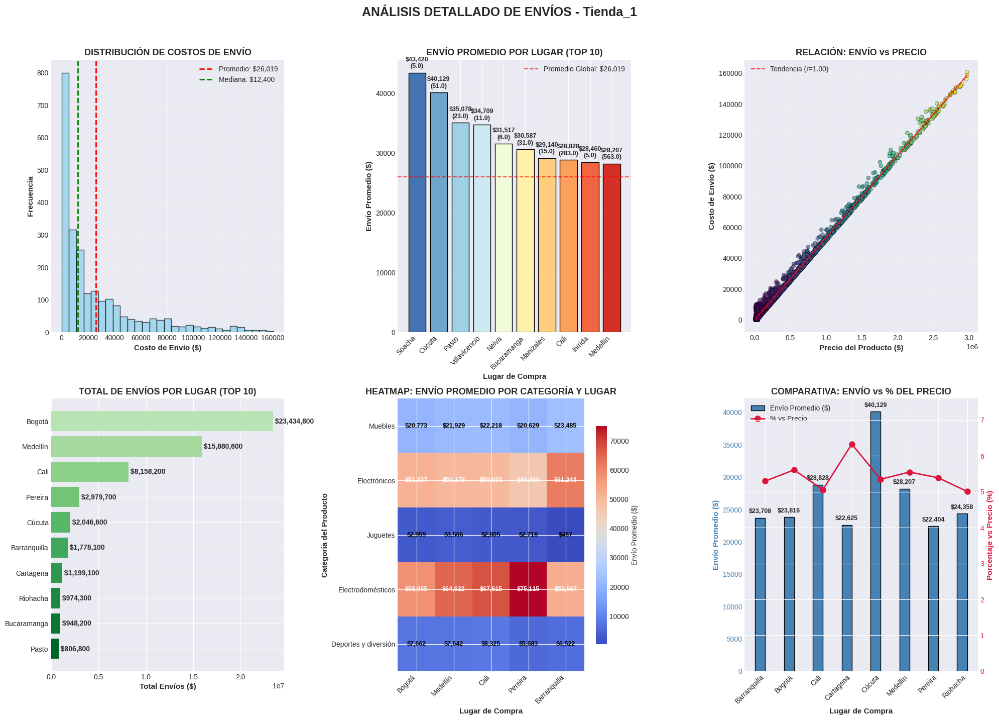


 RESUMEN Y RECOMENDACIONES - Tienda_1:
--------------------------------------------------
1. LUGAR CON MAYOR ENVÍO PROMEDIO:
   • Soacha: $43,420.00
   • Recomendación: Revisar logística o negociar mejores tarifas

2. LUGAR CON MENOR ENVÍO PROMEDIO:
   • Armenia: $17,314.29
   • Recomendación: Replicar estrategia logística exitosa

3. EFICIENCIA LOGÍSTICA:
   • Costo promedio por envío: $26,018.61
   • Porcentaje vs precio: 5.5%

4. OPTIMIZACIÓN DE COSTOS:
   • Desviación estándar: $32,860.00
   • Rango: $0.00 - $160,800.00


 ANÁLISIS DE ENVÍOS: Tienda_2

 ENVÍO PROMEDIO POR TIENDA - Tienda_2
--------------------------------------------------
 ESTADÍSTICAS DE ENVÍO:
  • Envío promedio: $25,216.24
  • Envío mediano: $11,600.00
  • Envío máximo: $162,500.00
  • Envío mínimo: $0.00
  • Total en envíos: $59,485,100.00
  • Porcentaje promedio vs precio: 5.6%

 ENVÍO POR LUGAR DE COMPRA - Tienda_2
--------------------------------------------------

 TOP 5 LUGARES CON MAYOR ENVÍO PROMEDIO:


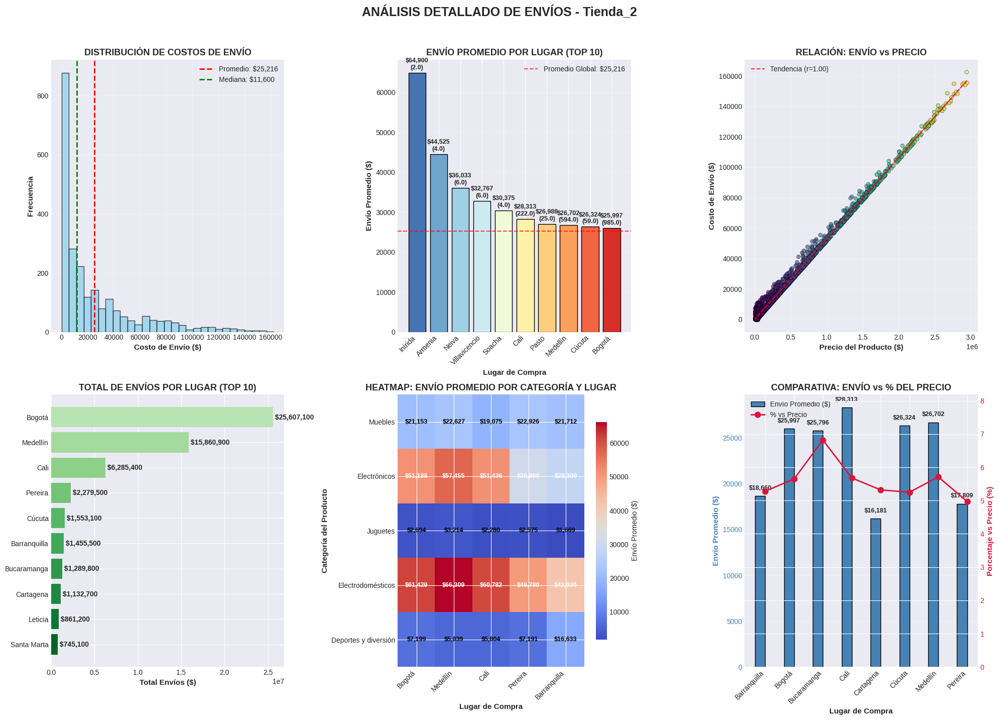


 RESUMEN Y RECOMENDACIONES - Tienda_2:
--------------------------------------------------
1. LUGAR CON MAYOR ENVÍO PROMEDIO:
   • Inírida: $64,900.00
   • Recomendación: Revisar logística o negociar mejores tarifas

2. LUGAR CON MENOR ENVÍO PROMEDIO:
   • Manizales: $13,476.92
   • Recomendación: Replicar estrategia logística exitosa

3. EFICIENCIA LOGÍSTICA:
   • Costo promedio por envío: $25,216.24
   • Porcentaje vs precio: 5.6%

4. OPTIMIZACIÓN DE COSTOS:
   • Desviación estándar: $31,741.38
   • Rango: $0.00 - $162,500.00


 ANÁLISIS DE ENVÍOS: Tienda_3

 ENVÍO PROMEDIO POR TIENDA - Tienda_3
--------------------------------------------------
 ESTADÍSTICAS DE ENVÍO:
  • Envío promedio: $24,805.68
  • Envío mediano: $11,900.00
  • Envío máximo: $158,400.00
  • Envío mínimo: $0.00
  • Total en envíos: $58,516,600.00
  • Porcentaje promedio vs precio: 5.4%

 ENVÍO POR LUGAR DE COMPRA - Tienda_3
--------------------------------------------------

 TOP 5 LUGARES CON MAYOR ENVÍO PROMEDI

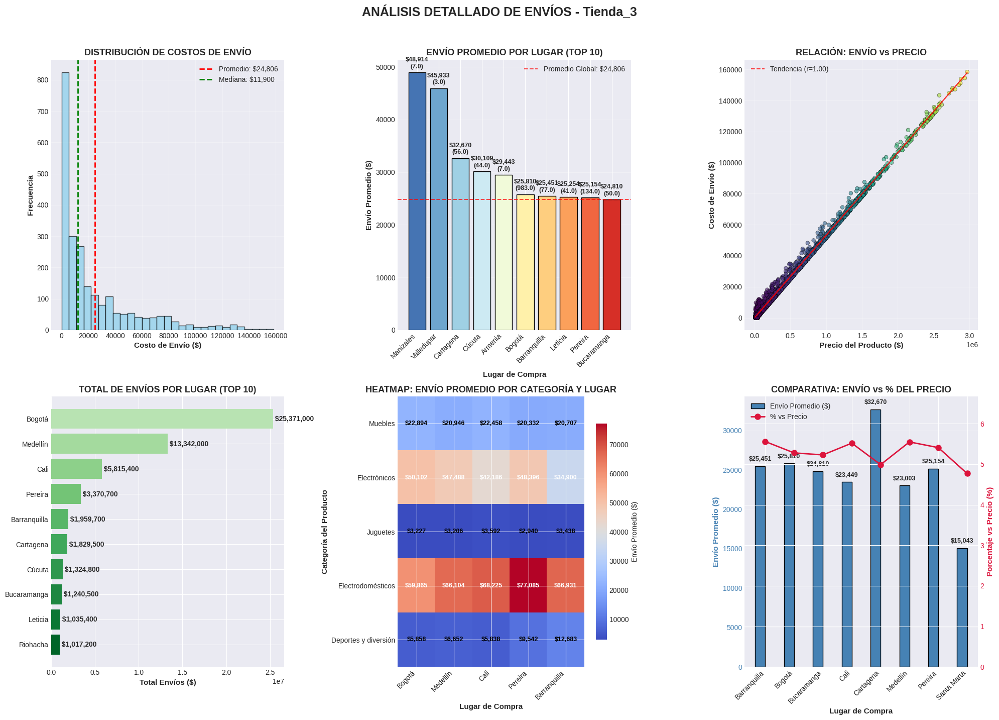


 RESUMEN Y RECOMENDACIONES - Tienda_3:
--------------------------------------------------
1. LUGAR CON MAYOR ENVÍO PROMEDIO:
   • Manizales: $48,914.29
   • Recomendación: Revisar logística o negociar mejores tarifas

2. LUGAR CON MENOR ENVÍO PROMEDIO:
   • Villavicencio: $11,820.00
   • Recomendación: Replicar estrategia logística exitosa

3. EFICIENCIA LOGÍSTICA:
   • Costo promedio por envío: $24,805.68
   • Porcentaje vs precio: 5.4%

4. OPTIMIZACIÓN DE COSTOS:
   • Desviación estándar: $30,945.89
   • Rango: $0.00 - $158,400.00


 ANÁLISIS DE ENVÍOS: Tienda_4

 ENVÍO PROMEDIO POR TIENDA - Tienda_4
--------------------------------------------------
 ESTADÍSTICAS DE ENVÍO:
  • Envío promedio: $23,459.46
  • Envío mediano: $10,950.00
  • Envío máximo: $154,700.00
  • Envío mínimo: $0.00
  • Total en envíos: $55,317,400.00
  • Porcentaje promedio vs precio: 5.5%

 ENVÍO POR LUGAR DE COMPRA - Tienda_4
--------------------------------------------------

 TOP 5 LUGARES CON MAYOR ENVÍO P

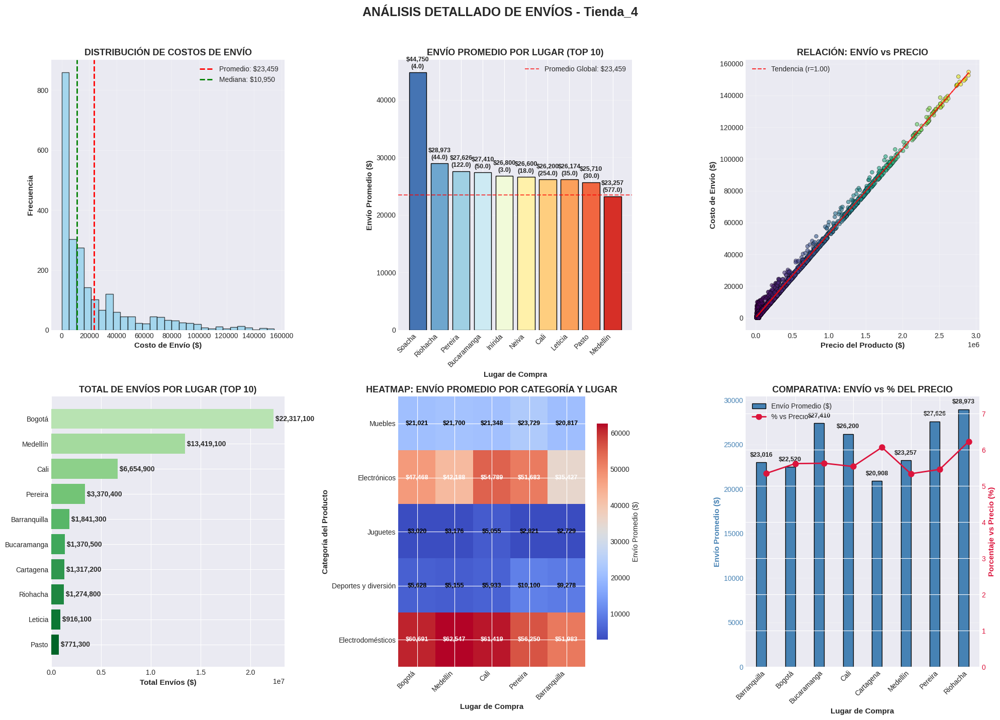


 RESUMEN Y RECOMENDACIONES - Tienda_4:
--------------------------------------------------
1. LUGAR CON MAYOR ENVÍO PROMEDIO:
   • Soacha: $44,750.00
   • Recomendación: Revisar logística o negociar mejores tarifas

2. LUGAR CON MENOR ENVÍO PROMEDIO:
   • Armenia: $4,566.67
   • Recomendación: Replicar estrategia logística exitosa

3. EFICIENCIA LOGÍSTICA:
   • Costo promedio por envío: $23,459.46
   • Porcentaje vs precio: 5.5%

4. OPTIMIZACIÓN DE COSTOS:
   • Desviación estándar: $30,279.10
   • Rango: $0.00 - $154,700.00


 ANÁLISIS COMPARATIVO DE ENVÍOS ENTRE TIENDAS

 COMPARATIVA DE ENVÍOS POR TIENDA:
------------------------------------------------------------
          Envio_Promedio  Envio_Total  Desviacion_Envio  Total_Envios  Precio_Promedio  Porcentaje_vs_Precio
Tienda                                                                                                      
Tienda_1        26018.61   61377900.0          32860.00          2359        487867.91                  5.3

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np


url = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_1%20.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_4.csv"

tienda = pd.read_csv(url)
tienda2 = pd.read_csv(url2)
tienda3 = pd.read_csv(url3)
tienda4 = pd.read_csv(url4)

# ============================================================================================
todas_tiendas = pd.concat([
    tienda.assign(Tienda='Tienda_1'),
    tienda2.assign(Tienda='Tienda_2'),
    tienda3.assign(Tienda='Tienda_3'),
    tienda4.assign(Tienda='Tienda_4')
], ignore_index=True)

# Análisis por tienda
for tienda_nombre in ['Tienda_1', 'Tienda_2', 'Tienda_3', 'Tienda_4']:
    print(f"\n{'='*80}")
    print(f" ANÁLISIS DE ENVÍOS: {tienda_nombre}")
    print(f"{'='*80}")

    # Filtrar datos de la tienda actual
    datos_tienda = todas_tiendas[todas_tiendas['Tienda'] == tienda_nombre].copy()


    # 1. ENVÍO PROMEDIO POR TIENDA

    print(f"\n ENVÍO PROMEDIO POR TIENDA - {tienda_nombre}")
    print("-" * 50)

    # Estadísticas de envío
    envio_promedio = datos_tienda['Costo de envío'].mean()
    envio_mediano = datos_tienda['Costo de envío'].median()
    envio_max = datos_tienda['Costo de envío'].max()
    envio_min = datos_tienda['Costo de envío'].min()
    envio_total = datos_tienda['Costo de envío'].sum()

    print(f" ESTADÍSTICAS DE ENVÍO:")
    print(f"  • Envío promedio: ${envio_promedio:,.2f}")
    print(f"  • Envío mediano: ${envio_mediano:,.2f}")
    print(f"  • Envío máximo: ${envio_max:,.2f}")
    print(f"  • Envío mínimo: ${envio_min:,.2f}")
    print(f"  • Total en envíos: ${envio_total:,.2f}")

    # Porcentaje del envío respecto al precio
    datos_tienda['Porcentaje_Envio'] = (datos_tienda['Costo de envío'] / datos_tienda['Precio']) * 100
    porcentaje_promedio = datos_tienda['Porcentaje_Envio'].mean()
    print(f"  • Porcentaje promedio vs precio: {porcentaje_promedio:.1f}%")


    # 2. ANÁLISIS POR LUGAR DE COMPRA

    print(f"\n ENVÍO POR LUGAR DE COMPRA - {tienda_nombre}")
    print("-" * 50)

    # Envío promedio por lugar de compra
    envio_por_lugar = datos_tienda.groupby('Lugar de Compra').agg({
        'Costo de envío': ['mean', 'sum', 'count', 'std'],
        'Precio': 'mean'
    }).round(2)

    envio_por_lugar.columns = ['_'.join(col).strip() for col in envio_por_lugar.columns.values]
    envio_por_lugar = envio_por_lugar.rename(columns={
        'Costo de envío_mean': 'Envio_Promedio',
        'Costo de envío_sum': 'Envio_Total',
        'Costo de envío_count': 'Cantidad_Envios',
        'Costo de envío_std': 'Desviacion_Envio',
        'Precio_mean': 'Precio_Promedio'
    })

    # Ordenar por envío promedio (mayor a menor)
    envio_por_lugar = envio_por_lugar.sort_values('Envio_Promedio', ascending=False)

    print(f"\n TOP 5 LUGARES CON MAYOR ENVÍO PROMEDIO:")
    for i, (lugar, datos) in enumerate(envio_por_lugar.head(5).iterrows(), 1):
        print(f"  {i}. {lugar}: ${datos['Envio_Promedio']:,.2f} ({datos['Cantidad_Envios']} envíos)")

    print(f"\n TOP 5 LUGARES CON MENOR ENVÍO PROMEDIO:")
    for i, (lugar, datos) in enumerate(envio_por_lugar.tail(5).iterrows(), 1):
        print(f"  {i}. {lugar}: ${datos['Envio_Promedio']:,.2f} ({datos['Cantidad_Envios']} envíos)")


    # 3. ANÁLISIS DE RELACIÓN ENVÍO-PRECIO

    print(f"\n RELACIÓN ENVÍO-PRECIO - {tienda_nombre}")
    print("-" * 50)

    # Calcular correlación
    correlacion_envio_precio = datos_tienda['Costo de envío'].corr(datos_tienda['Precio'])
    print(f"  • Correlación Envío-Precio: {correlacion_envio_precio:.3f}")

    if correlacion_envio_precio > 0.7:
        print("    → FUERTE correlación positiva: Envíos más caros para productos más caros")
    elif correlacion_envio_precio > 0.3:
        print("    → MODERADA correlación positiva")
    elif correlacion_envio_precio < -0.3:
        print("    → Correlación NEGATIVA: Envíos más baratos para productos más caros")
    else:
        print("    → Correlación DÉBIL: Poca relación entre envío y precio")


    # 4. GRÁFICOS DETALLADOS

    print(f"\n GENERANDO GRÁFICOS DETALLADOS PARA {tienda_nombre}...")

    fig, axes = plt.subplots(2, 3, figsize=(20, 14))
    fig.suptitle(f'ANÁLISIS DETALLADO DE ENVÍOS - {tienda_nombre}',
                 fontsize=18, fontweight='bold', y=1.02)

    # Gráfico 1: Distribución de costos de envío
    ax1 = axes[0, 0]
    bins = np.linspace(0, datos_tienda['Costo de envío'].max(), 30)
    ax1.hist(datos_tienda['Costo de envío'], bins=bins, color='skyblue',
             edgecolor='black', alpha=0.7)
    ax1.axvline(x=envio_promedio, color='red', linestyle='--', linewidth=2,
                label=f'Promedio: ${envio_promedio:,.0f}')
    ax1.axvline(x=envio_mediano, color='green', linestyle='--', linewidth=2,
                label=f'Mediana: ${envio_mediano:,.0f}')
    ax1.set_xlabel('Costo de Envío ($)', fontsize=11, fontweight='bold')
    ax1.set_ylabel('Frecuencia', fontsize=11, fontweight='bold')
    ax1.set_title('DISTRIBUCIÓN DE COSTOS DE ENVÍO', fontsize=13, fontweight='bold')
    ax1.legend()
    ax1.grid(True, alpha=0.3)

    # Gráfico 2: Envío promedio por lugar de compra (Top 10)
    ax2 = axes[0, 1]
    top_lugares_envio = envio_por_lugar.head(10)
    colors2 = plt.cm.RdYlBu_r(np.linspace(0.1, 0.9, len(top_lugares_envio)))
    bars2 = ax2.bar(range(len(top_lugares_envio)), top_lugares_envio['Envio_Promedio'],
                   color=colors2, edgecolor='black')
    ax2.set_xlabel('Lugar de Compra', fontsize=11, fontweight='bold')
    ax2.set_ylabel('Envío Promedio ($)', fontsize=11, fontweight='bold')
    ax2.set_title('ENVÍO PROMEDIO POR LUGAR (TOP 10)', fontsize=13, fontweight='bold')
    ax2.set_xticks(range(len(top_lugares_envio)))
    ax2.set_xticklabels(top_lugares_envio.index, rotation=45, ha='right')
    ax2.axhline(y=envio_promedio, color='red', linestyle='--', alpha=0.7,
                label=f'Promedio Global: ${envio_promedio:,.0f}')
    ax2.legend(loc='upper right')
    ax2.grid(True, alpha=0.3, axis='y')

    # Añadir valores en las barras
    for i, bar in enumerate(bars2):
        height = bar.get_height()
        cantidad = top_lugares_envio.iloc[i]['Cantidad_Envios']
        ax2.text(bar.get_x() + bar.get_width()/2., height + envio_promedio*0.02,
                f'${height:,.0f}\n({cantidad})',
                ha='center', va='bottom', fontsize=9, fontweight='bold')

    # Gráfico 3: Relación Envío vs Precio (Scatter plot)
    ax3 = axes[0, 2]
    scatter = ax3.scatter(datos_tienda['Precio'], datos_tienda['Costo de envío'],
                         alpha=0.6, c=datos_tienda['Precio'], cmap='viridis',
                         s=30, edgecolor='black', linewidth=0.5)
    ax3.set_xlabel('Precio del Producto ($)', fontsize=11, fontweight='bold')
    ax3.set_ylabel('Costo de Envío ($)', fontsize=11, fontweight='bold')
    ax3.set_title('RELACIÓN: ENVÍO vs PRECIO', fontsize=13, fontweight='bold')

    # Añadir línea de tendencia
    z = np.polyfit(datos_tienda['Precio'], datos_tienda['Costo de envío'], 1)
    p = np.poly1d(z)
    ax3.plot(datos_tienda['Precio'], p(datos_tienda['Precio']), "r--", alpha=0.8,
             label=f'Tendencia (r={correlacion_envio_precio:.2f})')
    ax3.legend()
    ax3.grid(True, alpha=0.3)

    # Gráfico 4: Total de envíos por lugar (barras horizontales)
    ax4 = axes[1, 0]
    top_lugares_total = envio_por_lugar.sort_values('Envio_Total', ascending=False).head(10)
    bars4 = ax4.barh(range(len(top_lugares_total)), top_lugares_total['Envio_Total'],
                    color=plt.cm.Greens(np.linspace(0.3, 0.9, len(top_lugares_total))))
    ax4.set_yticks(range(len(top_lugares_total)))
    ax4.set_yticklabels(top_lugares_total.index)
    ax4.set_xlabel('Total Envíos ($)', fontsize=11, fontweight='bold')
    ax4.set_title('TOTAL DE ENVÍOS POR LUGAR (TOP 10)', fontsize=13, fontweight='bold')
    ax4.invert_yaxis()

    # Añadir valores en las barras
    for i, v in enumerate(top_lugares_total['Envio_Total']):
        ax4.text(v, i, f' ${v:,.0f}', va='center', fontweight='bold')

    # Gráfico 5: Heatmap Envío Promedio por Lugar y Categoría
    ax5 = axes[1, 1]
    # Seleccionar top 5 categorías y top 5 lugares
    top_categorias = datos_tienda['Categoría del Producto'].value_counts().head(5).index
    top_lugares_heat = datos_tienda['Lugar de Compra'].value_counts().head(5).index

    datos_filtrados = datos_tienda[
        datos_tienda['Categoría del Producto'].isin(top_categorias) &
        datos_tienda['Lugar de Compra'].isin(top_lugares_heat)
    ]

    # Crear matriz para heatmap
    heatmap_data = datos_filtrados.pivot_table(
        index='Categoría del Producto',
        columns='Lugar de Compra',
        values='Costo de envío',
        aggfunc='mean',
        fill_value=0
    ).round(2)

    # Ordenar los datos
    heatmap_data = heatmap_data.reindex(top_categorias).reindex(columns=top_lugares_heat)

    # Crear heatmap
    im = ax5.imshow(heatmap_data, cmap='coolwarm', aspect='auto')
    ax5.set_xlabel('Lugar de Compra', fontsize=11, fontweight='bold')
    ax5.set_ylabel('Categoría del Producto', fontsize=11, fontweight='bold')
    ax5.set_title('HEATMAP: ENVÍO PROMEDIO POR CATEGORÍA Y LUGAR', fontsize=13, fontweight='bold')
    ax5.set_xticks(range(len(top_lugares_heat)))
    ax5.set_xticklabels(top_lugares_heat, rotation=45, ha='right')
    ax5.set_yticks(range(len(top_categorias)))
    ax5.set_yticklabels(top_categorias)

    # Añadir barra de color
    cbar = plt.colorbar(im, ax=ax5, shrink=0.8)
    cbar.set_label('Envío Promedio ($)', fontsize=10)

    # Añadir valores en las celdas
    for i in range(len(top_categorias)):
        for j in range(len(top_lugares_heat)):
            valor = heatmap_data.iloc[i, j]
            if valor > 0:
                color = 'white' if valor > heatmap_data.values.mean() else 'black'
                ax5.text(j, i, f'${valor:,.0f}', ha='center', va='center',
                        color=color, fontweight='bold', fontsize=9)

    # Gráfico 6: Comparativa Envío vs Porcentaje del Precio
    ax6 = axes[1, 2]

    # Seleccionar top 8 lugares por cantidad de envíos
    top_8_lugares = envio_por_lugar.sort_values('Cantidad_Envios', ascending=False).head(8).index
    datos_top_lugares = datos_tienda[datos_tienda['Lugar de Compra'].isin(top_8_lugares)]

    # Calcular métricas por lugar
    comparativa_lugares = datos_top_lugares.groupby('Lugar de Compra').agg({
        'Costo de envío': 'mean',
        'Porcentaje_Envio': 'mean'
    }).round(2)

    x_pos = np.arange(len(comparativa_lugares))
    width = 0.35

    # Barras para envío promedio
    bars6a = ax6.bar(x_pos - width/2, comparativa_lugares['Costo de envío'],
                    width, label='Envío Promedio ($)', color='steelblue', edgecolor='black')

    # Línea para porcentaje (segundo eje Y)
    ax6_twin = ax6.twinx()
    line6b = ax6_twin.plot(x_pos, comparativa_lugares['Porcentaje_Envio'],
                          color='crimson', marker='o', linewidth=2, markersize=8,
                          label='% vs Precio')

    ax6.set_xlabel('Lugar de Compra', fontsize=11, fontweight='bold')
    ax6.set_ylabel('Envío Promedio ($)', fontsize=11, fontweight='bold', color='steelblue')
    ax6.set_xticks(x_pos)
    ax6.set_xticklabels(comparativa_lugares.index, rotation=45, ha='right')
    ax6.tick_params(axis='y', labelcolor='steelblue')
    ax6.set_title('COMPARATIVA: ENVÍO vs % DEL PRECIO', fontsize=13, fontweight='bold')
    ax6.grid(True, alpha=0.3, axis='y')

    ax6_twin.set_ylabel('Porcentaje vs Precio (%)', fontsize=11, fontweight='bold', color='crimson')
    ax6_twin.tick_params(axis='y', labelcolor='crimson')
    ax6_twin.set_ylim(0, comparativa_lugares['Porcentaje_Envio'].max() * 1.2)

    # Añadir valores en las barras
    for i, bar in enumerate(bars6a):
        height = bar.get_height()
        ax6.text(bar.get_x() + bar.get_width()/2., height + envio_promedio*0.02,
                f'${height:,.0f}', ha='center', va='bottom', fontsize=9, fontweight='bold')

    # Combinar leyendas
    lines1, labels1 = ax6.get_legend_handles_labels()
    lines2, labels2 = ax6_twin.get_legend_handles_labels()
    ax6.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

    plt.tight_layout()
    plt.show()


    # 5. RESUMEN Y RECOMENDACIONES

    print(f"\n RESUMEN Y RECOMENDACIONES - {tienda_nombre}:")
    print("-" * 50)

    # Identificar oportunidades de optimización
    lugar_mayor_envio = envio_por_lugar.iloc[0]
    lugar_menor_envio = envio_por_lugar.iloc[-1]

    print(f"1. LUGAR CON MAYOR ENVÍO PROMEDIO:")
    print(f"   • {envio_por_lugar.index[0]}: ${lugar_mayor_envio['Envio_Promedio']:,.2f}")
    print(f"   • Recomendación: Revisar logística o negociar mejores tarifas")

    print(f"\n2. LUGAR CON MENOR ENVÍO PROMEDIO:")
    print(f"   • {envio_por_lugar.index[-1]}: ${lugar_menor_envio['Envio_Promedio']:,.2f}")
    print(f"   • Recomendación: Replicar estrategia logística exitosa")

    # Análisis de eficiencia
    eficiencia_promedio = (envio_total / len(datos_tienda))
    print(f"\n3. EFICIENCIA LOGÍSTICA:")
    print(f"   • Costo promedio por envío: ${eficiencia_promedio:,.2f}")
    print(f"   • Porcentaje vs precio: {porcentaje_promedio:.1f}%")

    if porcentaje_promedio > 10:
        print(f"   •  OPORTUNIDAD: Envíos representan más del 10% del precio")
    elif porcentaje_promedio < 5:
        print(f"   •  EXCELENTE: Envíos representan menos del 5% del precio")

    print(f"\n4. OPTIMIZACIÓN DE COSTOS:")
    print(f"   • Desviación estándar: ${datos_tienda['Costo de envío'].std():,.2f}")
    print(f"   • Rango: ${envio_min:,.2f} - ${envio_max:,.2f}")

    # Recomendación basada en correlación
    if correlacion_envio_precio < 0.3:
        print(f"   •   OPORTUNIDAD: Poca relación envío-precio, revisar estructura de costos")

    print(f"\n{'='*80}")


# ANÁLISIS COMPARATIVO ENTRE TIENDAS

print("\n" + "="*80)
print(" ANÁLISIS COMPARATIVO DE ENVÍOS ENTRE TIENDAS")
print("="*80)

# Calcular métricas comparativas
comparativa_envios = todas_tiendas.groupby('Tienda').agg({
    'Costo de envío': ['mean', 'sum', 'std', 'count'],
    'Precio': 'mean'
}).round(2)

comparativa_envios.columns = ['_'.join(col).strip() for col in comparativa_envios.columns.values]
comparativa_envios = comparativa_envios.rename(columns={
    'Costo de envío_mean': 'Envio_Promedio',
    'Costo de envío_sum': 'Envio_Total',
    'Costo de envío_std': 'Desviacion_Envio',
    'Costo de envío_count': 'Total_Envios',
    'Precio_mean': 'Precio_Promedio'
})

# Calcular porcentaje vs precio
comparativa_envios['Porcentaje_vs_Precio'] = (comparativa_envios['Envio_Promedio'] / comparativa_envios['Precio_Promedio'] * 100).round(2)

# Ordenar por envío promedio
comparativa_envios = comparativa_envios.sort_values('Envio_Promedio', ascending=False)

print("\n COMPARATIVA DE ENVÍOS POR TIENDA:")
print("-" * 60)
print(comparativa_envios.to_string())

print(f"\n RANKING DE ENVÍOS PROMEDIO:")
print("-" * 40)
for i, (tienda_nombre, datos) in enumerate(comparativa_envios.iterrows(), 1):
    print(f"{i}. {tienda_nombre}: ${datos['Envio_Promedio']:,.2f} "
          f"({datos['Porcentaje_vs_Precio']:.1f}% del precio)")

print(f"\n INSIGHTS TRANSVERSALES:")
print("-" * 40)
print(f"1. MEJOR DESEMPEÑO: {comparativa_envios.iloc[-1].name} "
      f"(${comparativa_envios['Envio_Promedio'].min():,.2f} por envío)")
print(f"2. MAYOR OPORTUNIDAD: {comparativa_envios.iloc[0].name} "
      f"(${comparativa_envios['Envio_Promedio'].max():,.2f} por envío)")
print(f"3. MÁS CONSISTENTE: {comparativa_envios['Desviacion_Envio'].idxmin()} "
      f"(menor variación: ${comparativa_envios['Desviacion_Envio'].min():,.2f})")

print(f"\n RECOMENDACIONES GENERALES:")
print("-" * 40)
print("1. Establecer tarifas de envío más consistentes entre tiendas")
print("2. Negociar mejores tarifas con transportistas para tiendas con costos altos")
print("3. Implementar política de envíos gratuitos para órdenes sobre cierto monto")
print("4. Optimizar rutas de entrega basadas en análisis geográfico")

print(f"\n{'='*80}")
print(" ANÁLISIS DE ENVÍOS COMPLETADO")
print(f"{'='*80}")

                            ANALISIS FINAL

En los resultados obtenidos, de los datos y tras analizar el comportamiento de

---

las cuatro tiendas en las cuales se analizó más mas de 9.000 transacciones y, sin dudas, recomiendo que el Sr. Joao desafíe el reto de asumir estrategias de ventas parta la Tienda 3.
Esta recomendación se da porque es el punto medio de las 4 tiendas analizadas que combina lo mejor según los datos obtenidos, volumen de ventas atractivas sin exponer márgenes, clientes más satisfechos y una operación que no consume la rentabilidad de la tienda. No es la que más factura, pero sí la que entrega resultados más equilibrados y sostenibles.
La Tienda 3 ofrece más oportunidades, más demanda para crecer exponencialmente sin encontrar los obstáculos que frenen a un vendedor. Además, contiene valor agregado como compradores que allí suelen valorar la calidad y el buen servicio, según los datos obtenidos y los valores que se reflejan según las gráficas y que está más propensa a que los visitantes compren más productos. En cuanto a la logística también se desataca, es donde mejor encaja debido a los costos de envío los cuales son proporcionales al precio de los productos, lo que la ayuda a mantener las márgenes estables. Además, las ventas de la tienda, están distribuidas entre varias ciudades, lo que reduce la dependencia de un solo mercado.
En conclusión la Tienda 3 es el terreno más acomodado para crecer en el mercado con pasos firmes y minimizar la probabilidad de quebrar en el proceso.
